In [1]:
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib as mpl 
mpl.rcParams["image.origin"] = 'lower'
# mpl.rcParams["image.dpi"] = '100'
from sklearn.metrics import auc
import os
import numpy as np
import pandas as pd
from plotting import * 

import mplhep as hep
plt.style.use(hep.style.CMS)

In [2]:
outdir = "/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/models_archive/gcn_models/gcn_models_SA_v18/run_01/validation_plots"
os.makedirs(outdir, exist_ok = True)

In [3]:
df_ele = pd.read_csv("/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/models_archive/gcn_models/gcn_models_SA_v18/run_01/validation_data/validation_dataset_v11_ele.csv", sep=";")
df_gamma = pd.read_csv("/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/models_archive/gcn_models/gcn_models_SA_v18/run_01/validation_data/validation_dataset_v11_gamma.csv", sep=";")
# df_nomatch = pd.read_csv("/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/models_archive/gcn_models/gcn_models_SA_v11/run_01/en_regr/run_01/validation_data/validation_dataset_v10_nomatch.csv", sep=";")

In [4]:
# df_tot = pd.concat([df_nomatch, df_ele, df_gamma], sort=False)
df_tot = pd.concat([df_ele, df_gamma], sort=False)

In [5]:
# Add variables
for df in [df_ele, df_gamma]:
    df['iz'] = df['seed_iz']
    df['ieta'] = df['seed_ieta']
    df['iphi'] = df['seed_iphi']
    df['eta'] = df['seed_eta'].abs()
    df['phi'] = df['seed_phi']
    df['en'] = df['en_seed']
    df['et'] = df['et_seed']

In [6]:
def bin_analysis(col):
    def f(df):
        m = df[col].mean()
        A = (df[col].quantile(0.84) - df[col].quantile(0.16))/2
        B = (df[col].quantile(0.025) - df[col].quantile(0.975))/2
        return pd.Series({
            "m": m,
            "w68": A,
            "w95": B,
            "N": df[col].count()
        })
    return f

In [7]:
import mplhep as hep
plt.style.use(hep.style.CMS)

# Seed comparison

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.


(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary '))

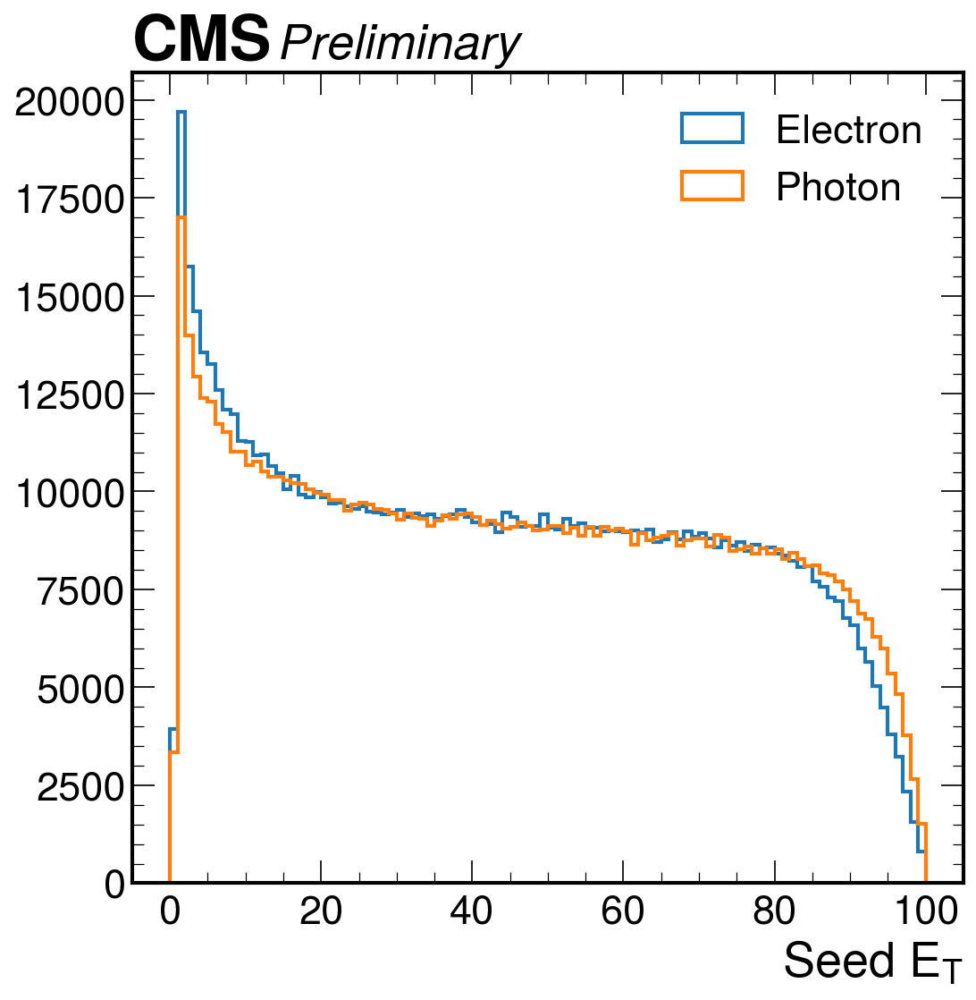

In [8]:
fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=150)
ax.hist(df_ele.et_seed, bins=100, range=(0,100), histtype="step", label="Electron", linewidth=2)
ax.hist(df_gamma.et_seed, bins=100, range=(0,100), histtype="step", label="Photon", linewidth=2)
ax.legend()
ax.set_xlabel("Seed $E_T$")
hep.cms.text("Preliminary ",loc=0, ax=ax)

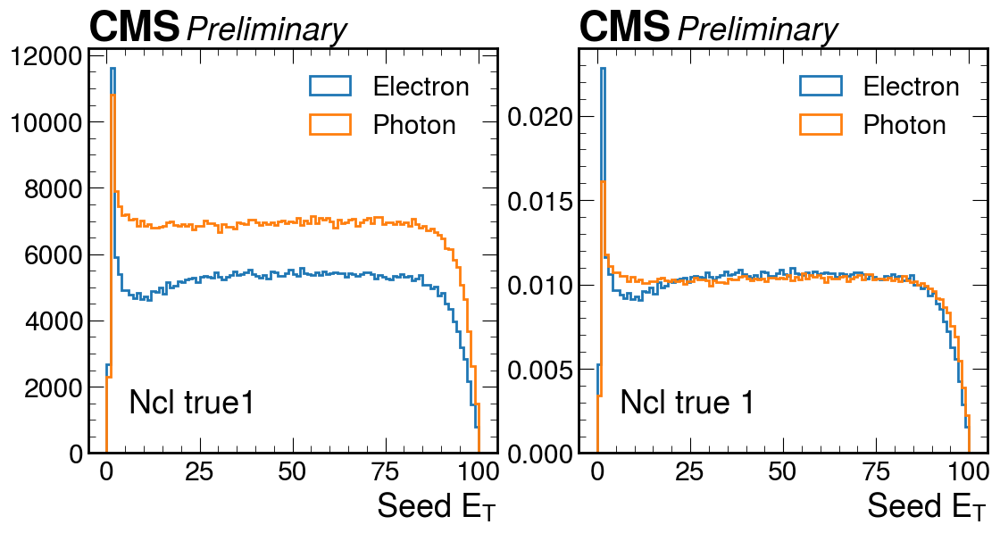

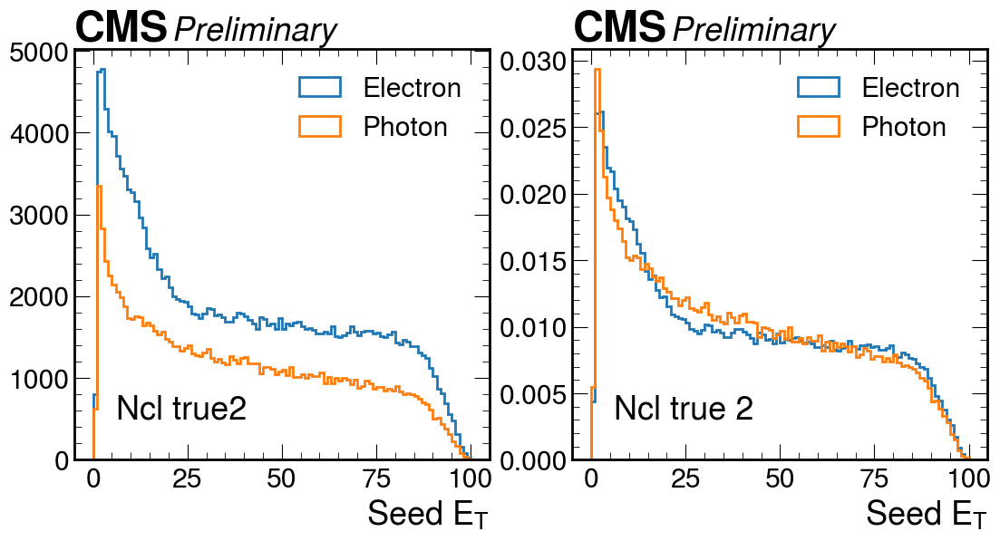

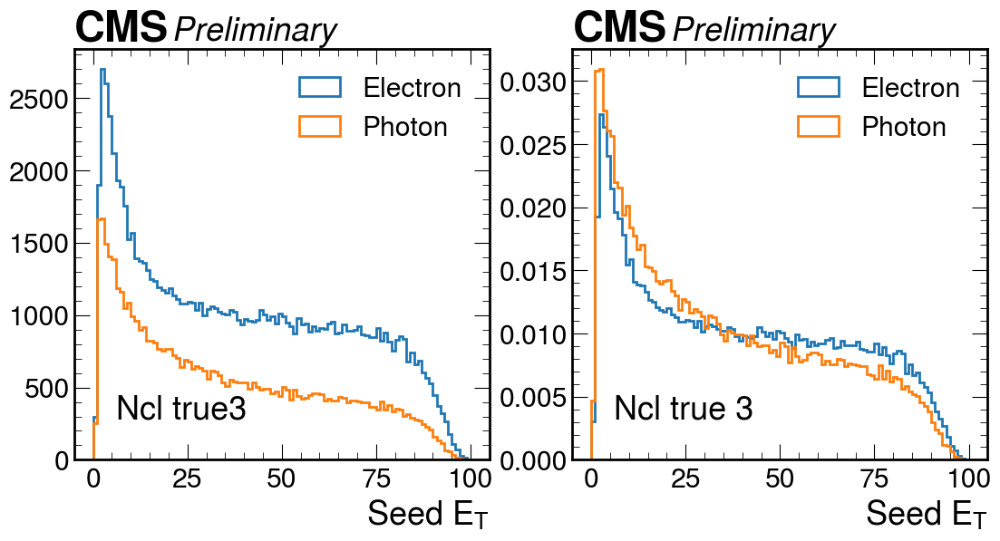

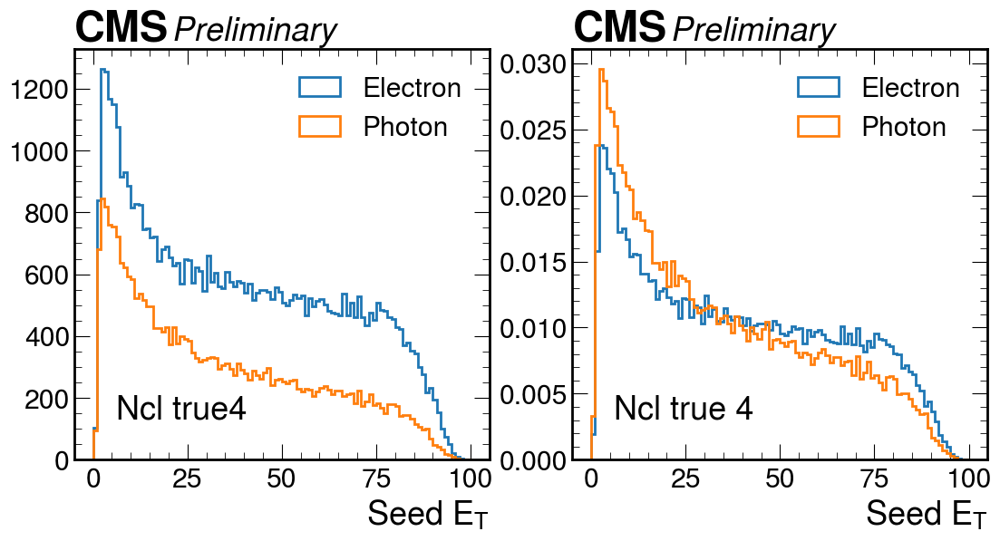

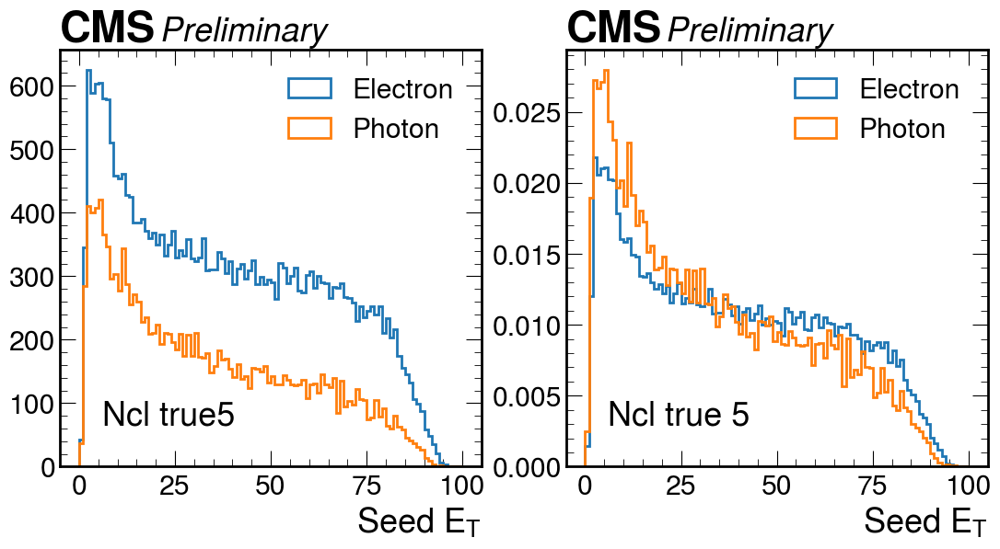

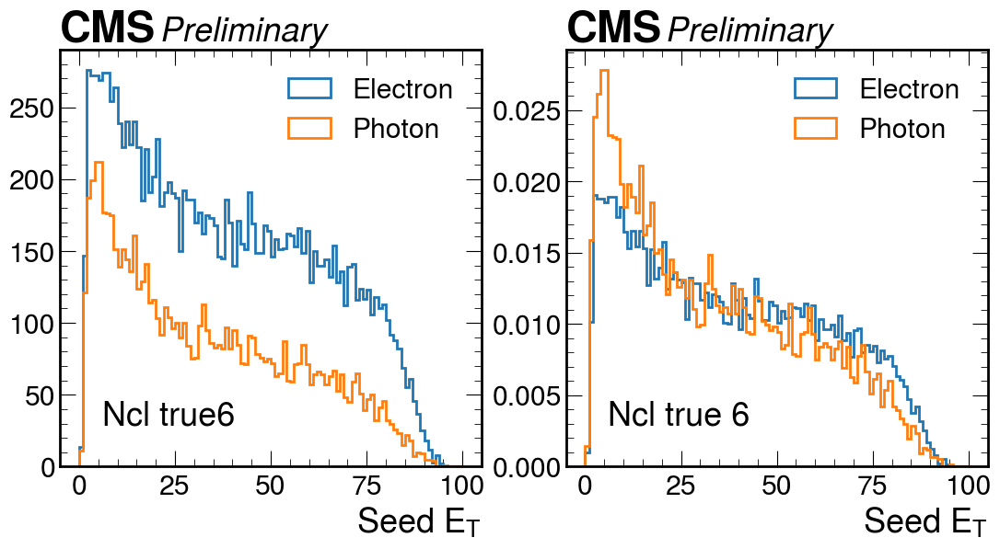

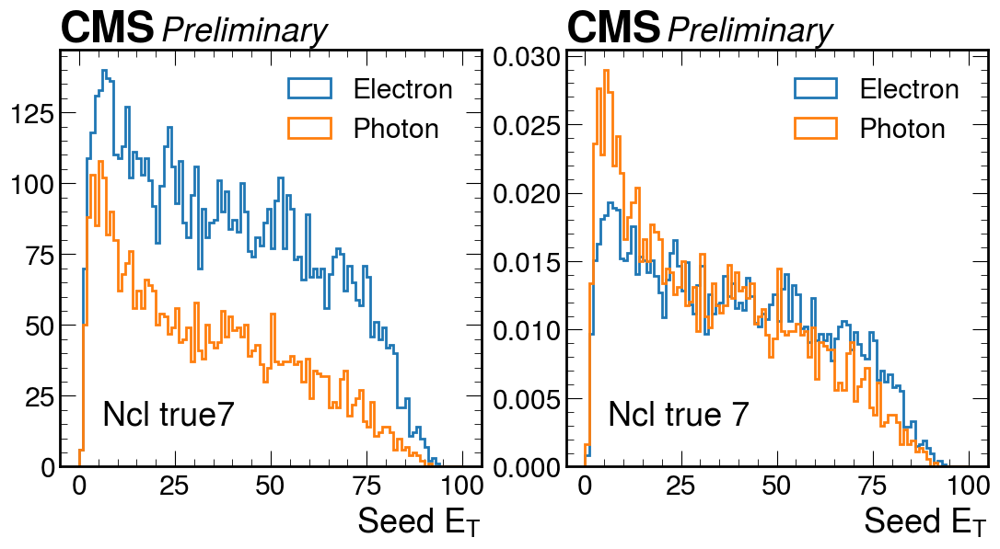

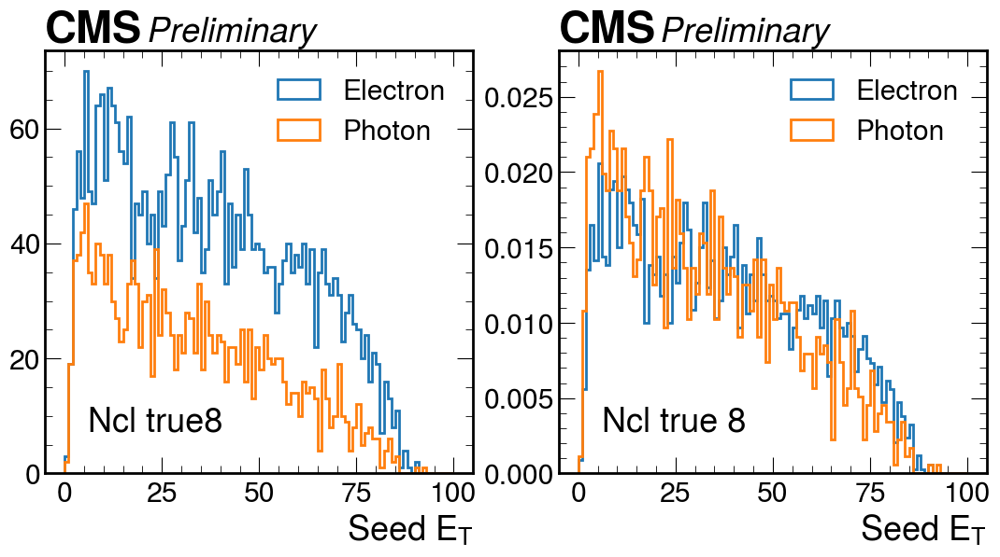

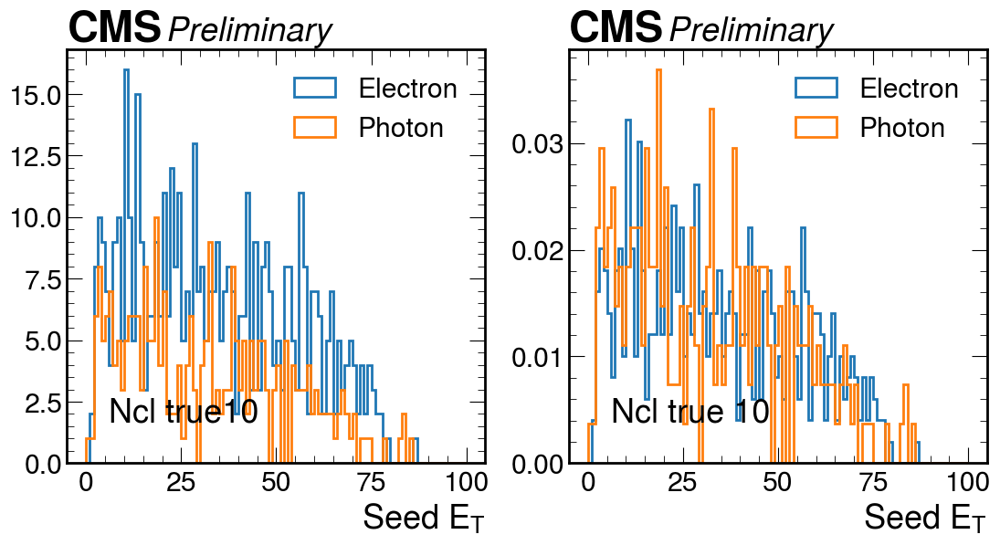

In [9]:
for ncl in [1,2,3,4,5,6,7,8,10]:
    fig, (ax,ay) = plt.subplots(1,2, figsize=(13,6),dpi=100)
    ax.hist(df_ele[df_ele.ncls_true==ncl].et_seed, bins=100, range=(0,100), histtype="step", label="Electron", linewidth=2)
    ax.hist(df_gamma[df_gamma.ncls_true==ncl].et_seed, bins=100, range=(0,100), histtype="step", label="Photon", linewidth=2)
    ax.legend()
    ax.set_xlabel("Seed $E_T$")
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    ax.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)
    
    ay.hist(df_ele[df_ele.ncls_true==ncl].et_seed, bins=100, range=(0,100), histtype="step", label="Electron", linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true==ncl].et_seed, bins=100, range=(0,100), histtype="step", label="Photon", linewidth=2, density=True)
    ay.legend()
    ay.set_xlabel("Seed $E_T$")
    hep.cms.text("Preliminary ",loc=0, ax=ay)
    ay.text(0.1,0.1, "Ncl true {}".format(ncl), transform=ay.transAxes)

# True clusters energy fraction

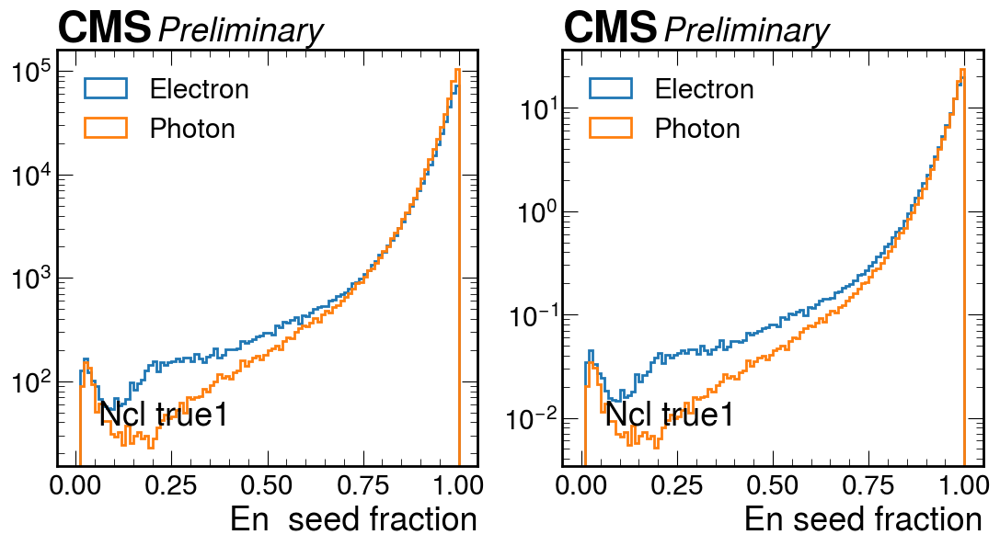

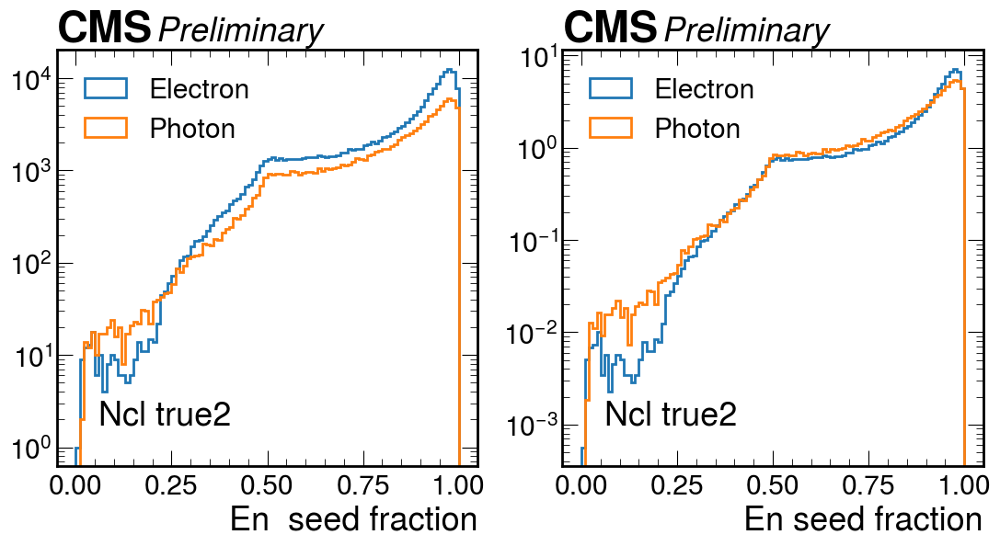

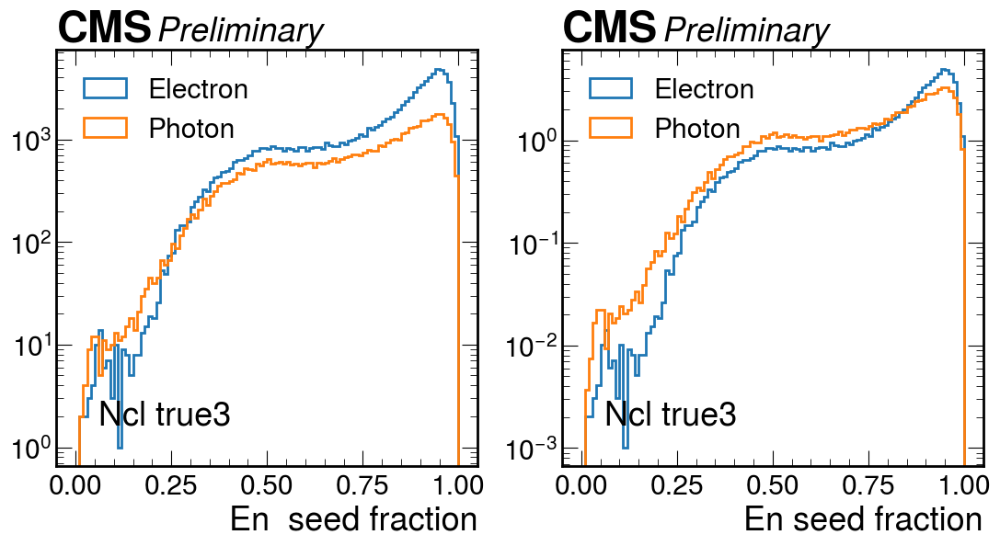

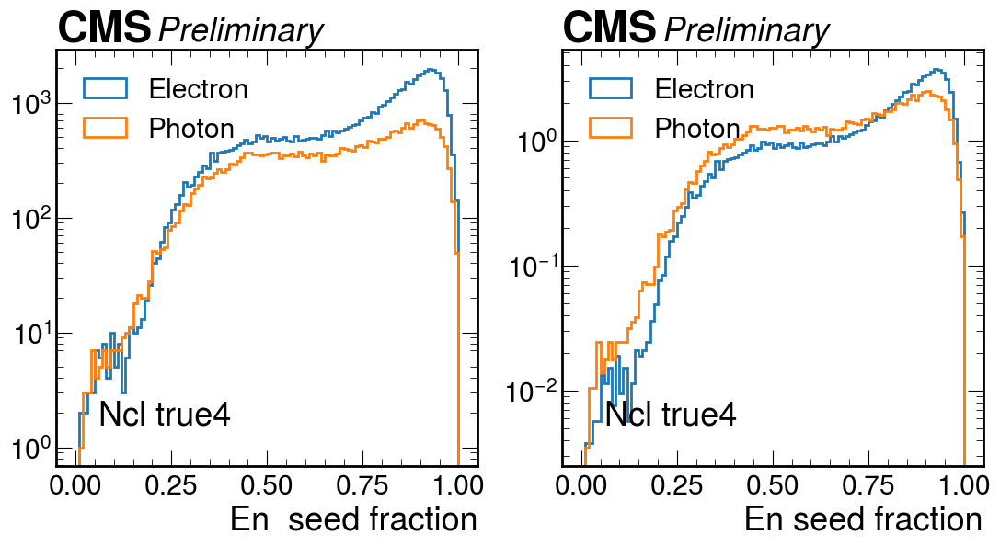

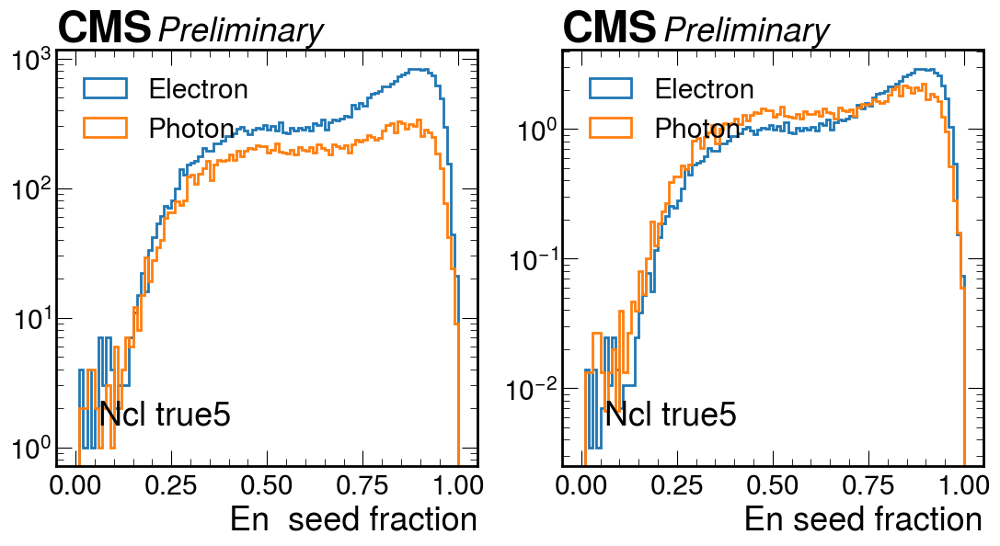

In [10]:
for ncl in [1, 2,3,4,5]:
    fig, (ax,ay) = plt.subplots(1,2, figsize=(13,6),dpi=100)
    ax.hist(df_ele[df_ele.ncls_true==ncl].en_seed / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,1), histtype="step", label="Electron", linewidth=2)
    ax.hist(df_gamma[df_gamma.ncls_true==ncl].en_seed / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,1), histtype="step", label="Photon", linewidth=2)
    ax.legend(loc="upper left")
    ax.set_yscale("log")
    ax.set_xlabel("En  seed fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    ax.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)
    
    ay.hist(df_ele[df_ele.ncls_true==ncl].en_seed / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,1), histtype="step", label="Electron", linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true==ncl].en_seed / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,1), histtype="step", label="Photon", linewidth=2, density=True)
    ay.legend(loc="upper left")
    ay.set_yscale("log")
    ay.set_xlabel("En seed fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ay)
    ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ay.transAxes)

In [ ]:
for ncl in [2,3,4,5]:
    fig, (ax,ay) = plt.subplots(1,2, figsize=(13,6),dpi=100)
    ax.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_2 / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.6), histtype="step", label="Electron", linewidth=2)
    ax.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_2 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.6), histtype="step", label="Photon", linewidth=2)
    ax.legend()
    ax.set_yscale("log")
    ax.set_xlabel("2nd cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    ax.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)
    
    ay.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_2 / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.6), histtype="step", label="Electron", linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_2 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.6), histtype="step", label="Photon", linewidth=2, density=True)
    ay.legend()
    ay.set_yscale("log")
    ay.set_xlabel("2nd cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ay)
    ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ay.transAxes)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary '))

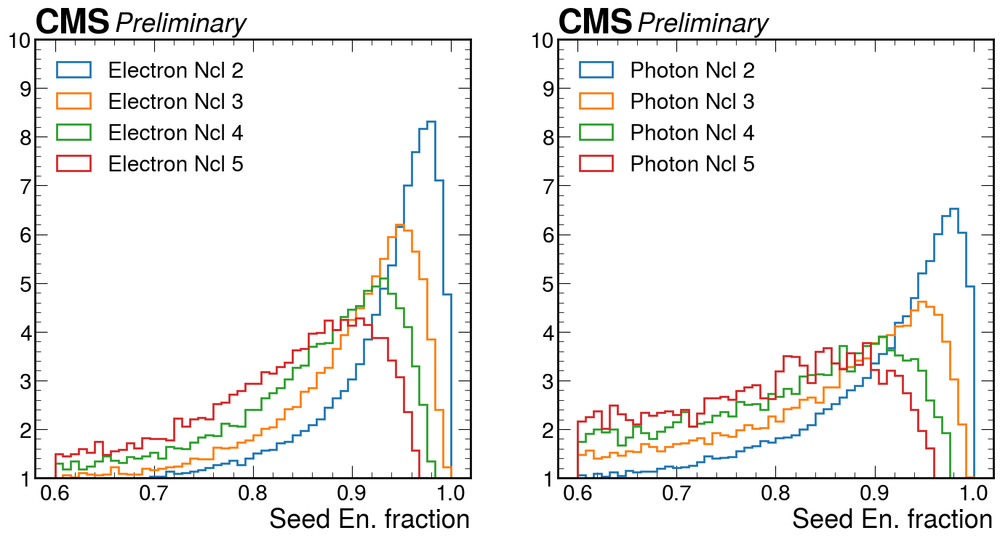

In [142]:
fig, (ax,ay) = plt.subplots(1,2, figsize=(17,8),dpi=100)
ncls = [2,3,4,5]
for ncl in ncls:
    ax.hist(df_ele[df_ele.ncls_true ==ncl].en_seed / df_ele[df_ele.ncls_true ==ncl].en_true_sim_good, bins=50, range=(0.6,1), histtype="step", label="Electron Ncl {}".format(ncl), linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true ==ncl].en_seed / df_gamma[df_gamma.ncls_true ==ncl].en_true_sim_good, bins=50, range=(0.6,1), histtype="step", label="Photon Ncl {}".format(ncl), linewidth=2, density=True)
ax.legend(loc="upper left")
ay.legend(loc="upper left")
ax.set_ylim(1,10)
ay.set_ylim(1,10)
# ax.set_yscale("log")
ax.set_xlabel("Seed En. fraction")
ay.set_xlabel("Seed En. fraction")
hep.cms.text("Preliminary ",loc=0, ax=ax)
hep.cms.text("Preliminary ",loc=0, ax=ay)
# ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)

Text(0.1, 0.1, 'Ncl true15')

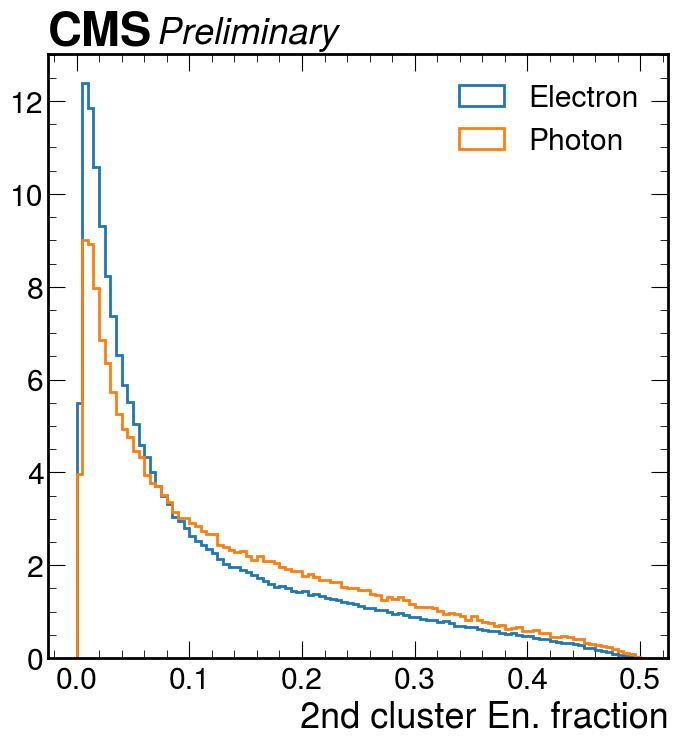

In [128]:
fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=100)

ax.hist(df_ele[df_ele.ncls_true >=2].En_cl_true_2 / df_ele[df_ele.ncls_true >=2].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Electron", linewidth=2, density=True)
ax.hist(df_gamma[df_gamma.ncls_true >=2].En_cl_true_2 / df_gamma[df_gamma.ncls_true >=2].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Photon", linewidth=2, density=True)
ax.legend()
# ax.set_yscale("log")
ax.set_xlabel("2nd cluster En. fraction")
hep.cms.text("Preliminary ",loc=0, ax=ax)
ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)

Text(0.1, 0.1, 'Ncl true15')

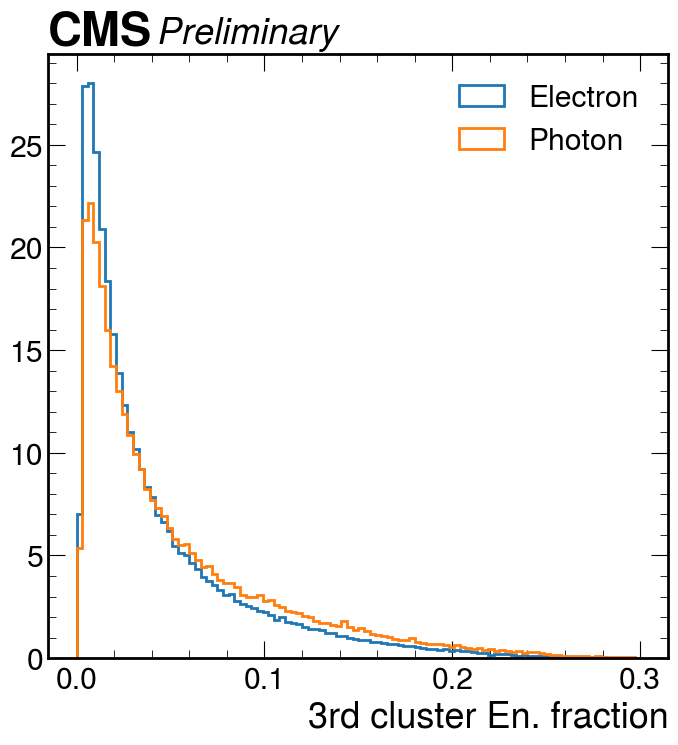

In [129]:
fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=100)

ax.hist(df_ele[df_ele.ncls_true >=3].En_cl_true_3 / df_ele[df_ele.ncls_true >=3].en_true_sim_good, bins=100, range=(0,0.3), histtype="step", label="Electron", linewidth=2, density=True)
ax.hist(df_gamma[df_gamma.ncls_true >=3].En_cl_true_3 / df_gamma[df_gamma.ncls_true >=3].en_true_sim_good, bins=100, range=(0,0.3), histtype="step", label="Photon", linewidth=2, density=True)
ax.legend()
# ax.set_yscale("log")
ax.set_xlabel("3rd cluster En. fraction")
hep.cms.text("Preliminary ",loc=0, ax=ax)
ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)

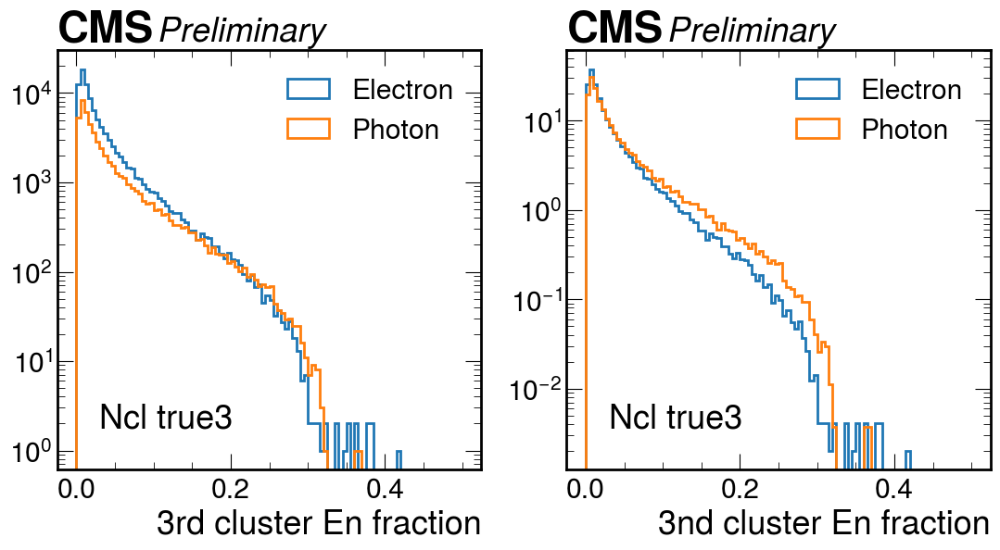

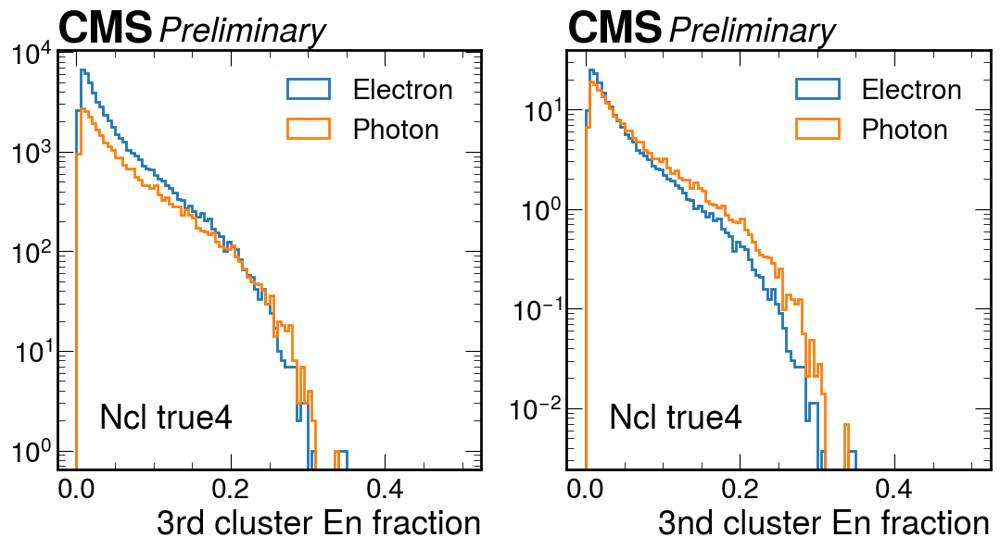

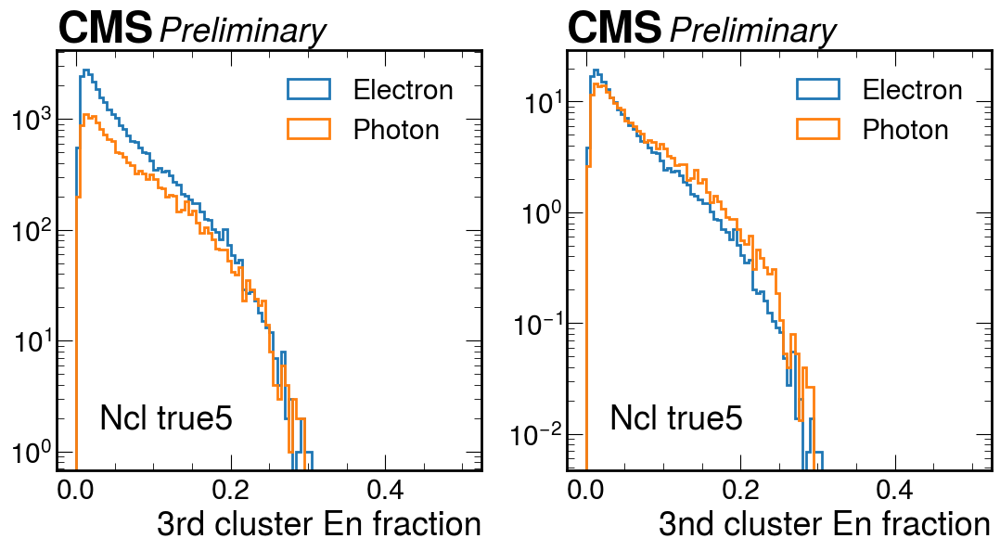

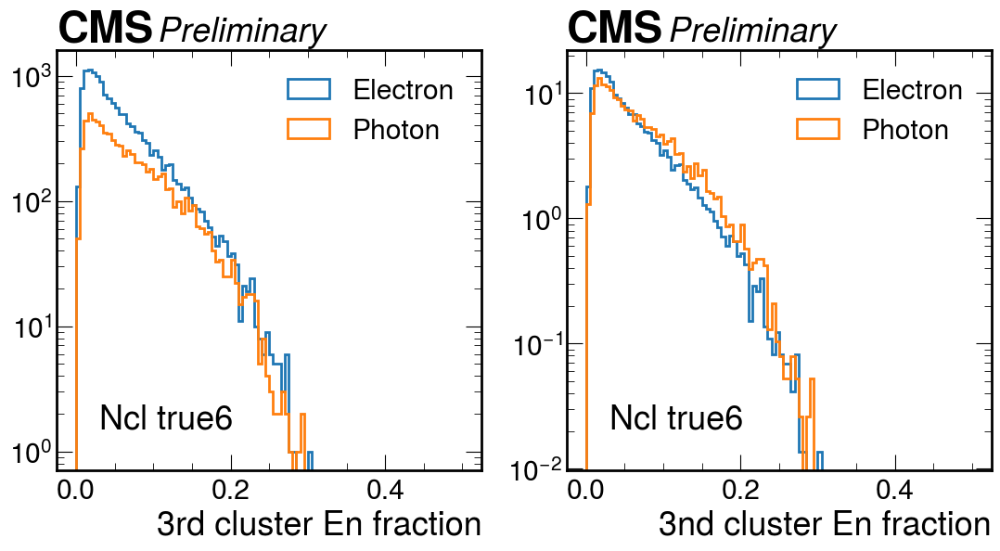

In [12]:
for ncl in [3,4,5,6]:
    fig, (ax,ay) = plt.subplots(1,2, figsize=(13,6),dpi=100)
    ax.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_3 / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Electron", linewidth=2)
    ax.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_3 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Photon", linewidth=2)
    ax.legend()
    ax.set_yscale("log")
    ax.set_xlabel("3rd cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    ax.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)
    
    ay.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_3 / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Electron", linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_3 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.5), histtype="step", label="Photon", linewidth=2, density=True)
    ay.legend()
    ay.set_yscale("log")
    ay.set_xlabel("3nd cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ay)
    ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ay.transAxes)

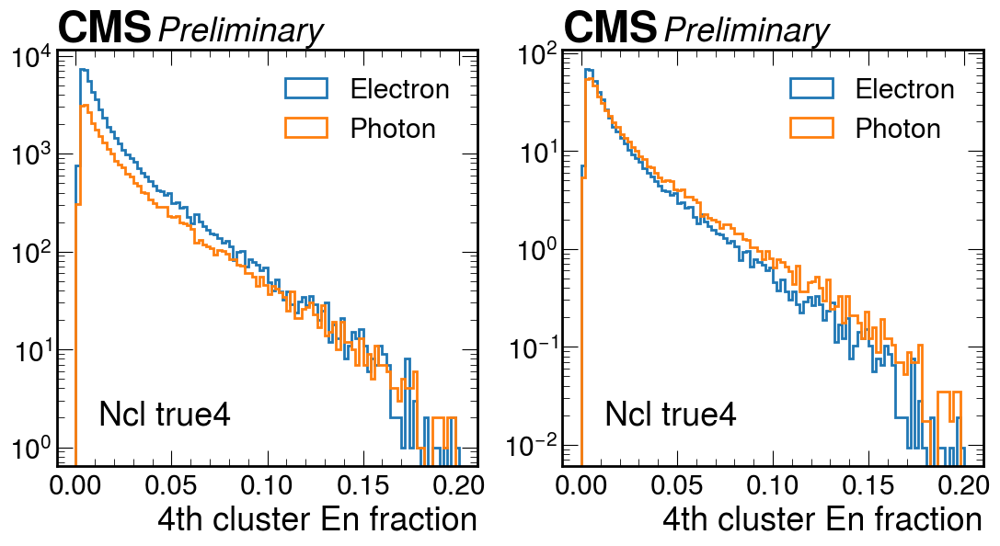

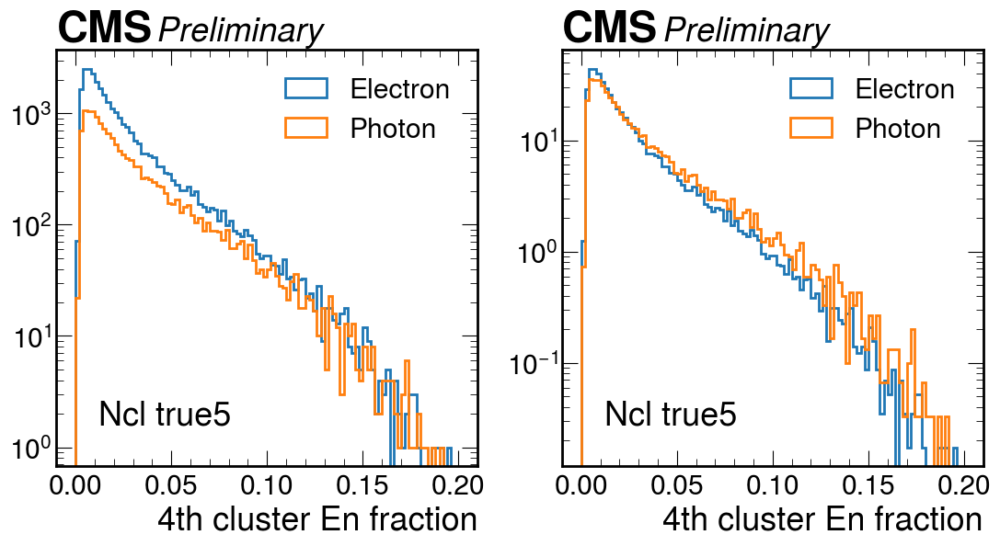

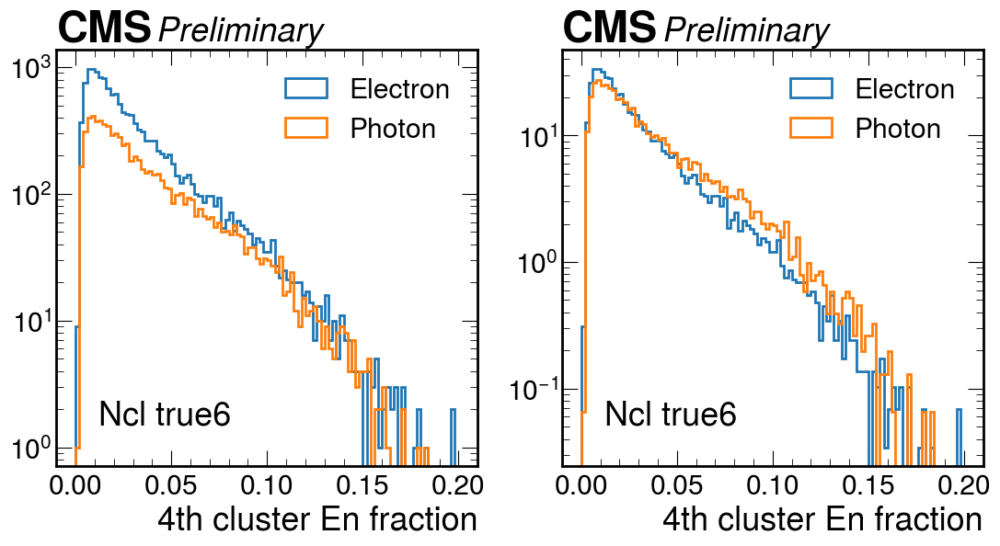

In [13]:
for ncl in [4,5,6]:
    fig, (ax,ay) = plt.subplots(1,2, figsize=(13,6),dpi=100)
    ax.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_4/ df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.2), histtype="step", label="Electron", linewidth=2)
    ax.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_4 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.2), histtype="step", label="Photon", linewidth=2)
    ax.legend()
    ax.set_yscale("log")
    ax.set_xlabel("4th cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    ax.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ax.transAxes)
    
    ay.hist(df_ele[df_ele.ncls_true==ncl].En_cl_true_4 / df_ele[df_ele.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.2), histtype="step", label="Electron", linewidth=2, density=True)
    ay.hist(df_gamma[df_gamma.ncls_true==ncl].En_cl_true_4 / df_gamma[df_gamma.ncls_true==ncl].en_true_sim_good, bins=100, range=(0,0.2), histtype="step", label="Photon", linewidth=2, density=True)
    ay.legend()
    ay.set_yscale("log")
    ay.set_xlabel("4th cluster En fraction")
    hep.cms.text("Preliminary ",loc=0, ax=ay)
    ay.text(0.1,0.1, "Ncl true{}".format(ncl), transform=ay.transAxes)

# N clusters

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.


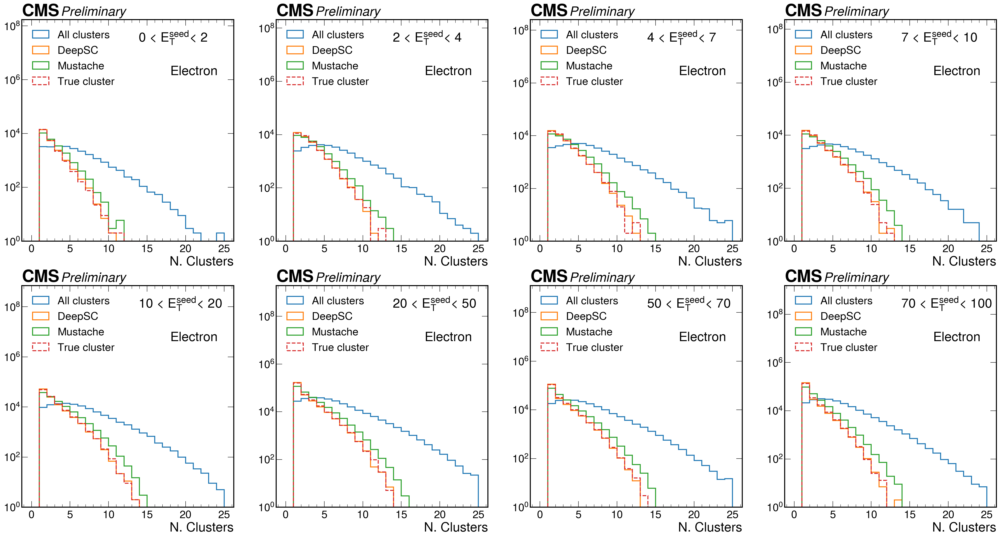

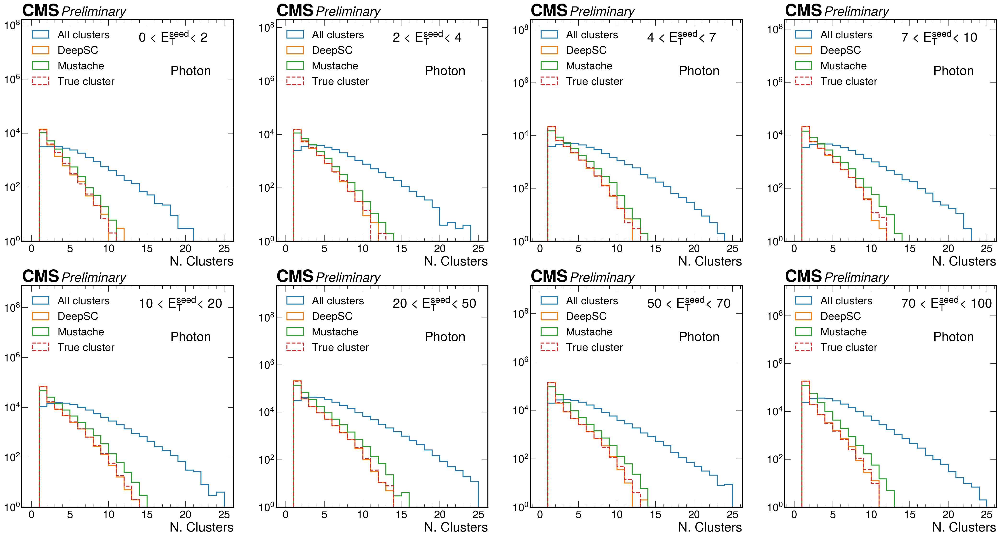

In [8]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(2,4, figsize=(35,18),dpi=150)

    xrange = (0,25)
    bins= 25

    ets = [ [(0,2),(2,4),(4,7),(7,10)],[(10,20),(20,50),(50,70),(70,100)]]

    for j,etss in enumerate(ets): 
        for i, (e1,e2) in enumerate(etss): 
            dfx = df[(df.et>=e1) & (df.et<e2)]

            A = ax[j,i].hist(dfx.ncls,bins=bins, range=xrange, histtype='step', linewidth=2, label='All clusters')
            ax[j,i].hist(dfx.ncls_sel,bins=bins, range=xrange, histtype='step', linewidth=2, label='DeepSC')
            ax[j,i].hist(dfx.ncls_sel_must,bins=bins, range=xrange, histtype='step', linewidth=2, label='Mustache')
            ax[j,i].hist(dfx.ncls_true,bins=bins, range=xrange, histtype='step', linewidth=2, linestyle='dashed', label='True cluster')
            maxY = np.max(A[0])
            ax[j,i].legend(loc="upper left")
            ax[j,i].set_yscale('log')
            ax[j,i].set_ylim(1, 5e4 * maxY)
            ax[j,i].set_xlabel("N. Clusters")
            ax[j,i].text(0.55,0.9,  str(e1) + ' < $E_T^{seed}$< ' + str(e2), transform = ax[j,i].transAxes)  
            ax[j,i].text(0.7, 0.75, flavour, transform=ax[j,i].transAxes)

            hep.cms.text("Preliminary ",loc=0, ax=ax[j,i])


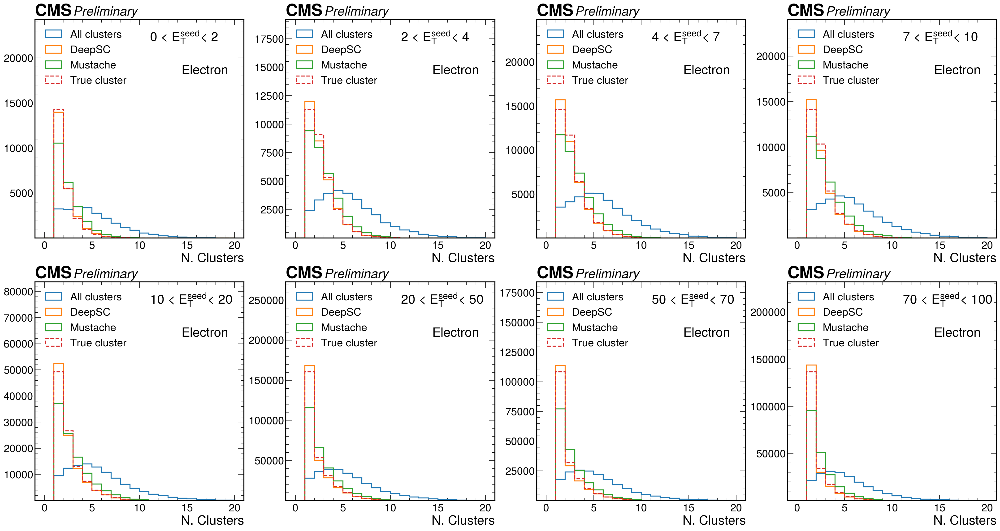

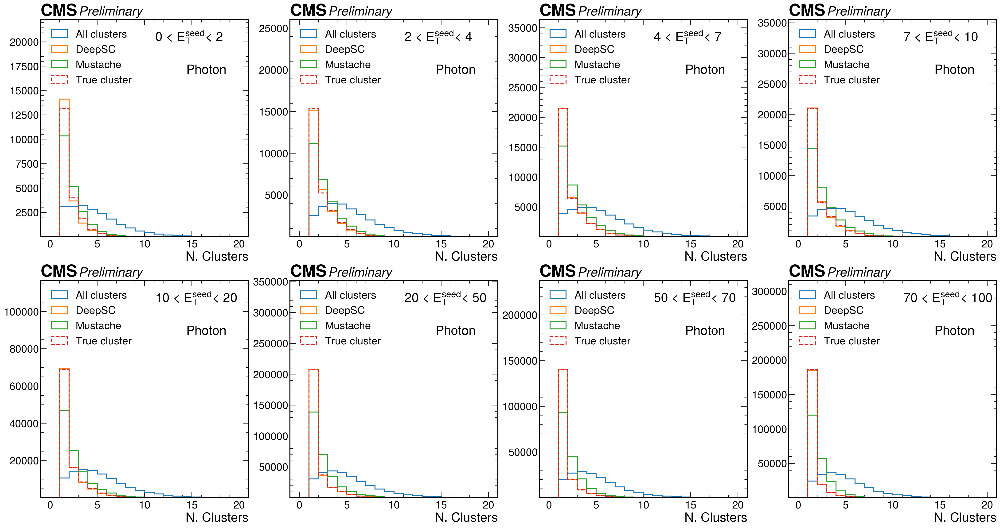

In [9]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(2,4, figsize=(35,18),dpi=150)

    xrange = (0,20)
    bins= 20

    ets = [ [(0,2),(2,4),(4,7),(7,10)],[(10,20),(20,50),(50,70),(70,100)]]

    for j,etss in enumerate(ets): 
        for i, (e1,e2) in enumerate(etss): 
            dfx = df[(df.et>=e1) & (df.et<e2)]

            ax[j,i].hist(dfx.ncls,bins=bins, range=xrange, histtype='step', linewidth=2, label='All clusters')
            ax[j,i].hist(dfx.ncls_sel,bins=bins, range=xrange, histtype='step', linewidth=2, label='DeepSC')
            ax[j,i].hist(dfx.ncls_sel_must,bins=bins, range=xrange, histtype='step', linewidth=2, label='Mustache')
            A = ax[j,i].hist(dfx.ncls_true,bins=bins, range=xrange, histtype='step', linewidth=2, linestyle='dashed', label='True cluster')
            maxY = np.max(A[0])
            ax[j,i].legend(loc="upper left")
#             ax[j,i].set_yscale('log')
            ax[j,i].set_ylim(1, 1.7 * maxY)
            ax[j,i].set_xlabel("N. Clusters")
            ax[j,i].text(0.55,0.9,  str(e1) + ' < $E_T^{seed}$< ' + str(e2), transform = ax[j,i].transAxes)  
            ax[j,i].text(0.7, 0.75, flavour, transform=ax[j,i].transAxes)

            hep.cms.text("Preliminary ",loc=0, ax=ax[j,i])


# Resolution

In [10]:
def get_CI(histo, CL):
    Y, X = histo
    maxBin = np.argmax(Y)
    Xmax = (X[maxBin] + X[maxBin+1])/2
    # now we have to compute the simmetric interval
    Xr, Xl = 0, 0
    tot = np.sum(Y)
    thr = tot* CL/2
#     print(tot, thr)
    xi = maxBin+1
    Nu = Y[maxBin]/2
    Nd = Nu
    while(xi < len(X)):
        Nu += Y[xi]
        if Nu > thr:
            Xr = (X[xi] + X[xi+1])/2
            break
        else:
            xi+=1
            
    xi = maxBin-1
    while(xi > 0):
        Nd += Y[xi]
        if Nd > thr:
            Xl = (X[xi] + X[xi+1])/2
            break
        else:
            xi-=1
    
    return Xmax, Xr, Xl
    
def get_sigma_eff(df):
    A = (df.quantile(0.84) - df.quantile(0.16)) /2
    B = (df.quantile(0.025) - df.quantile(0.975)) /2
    return A,B

    

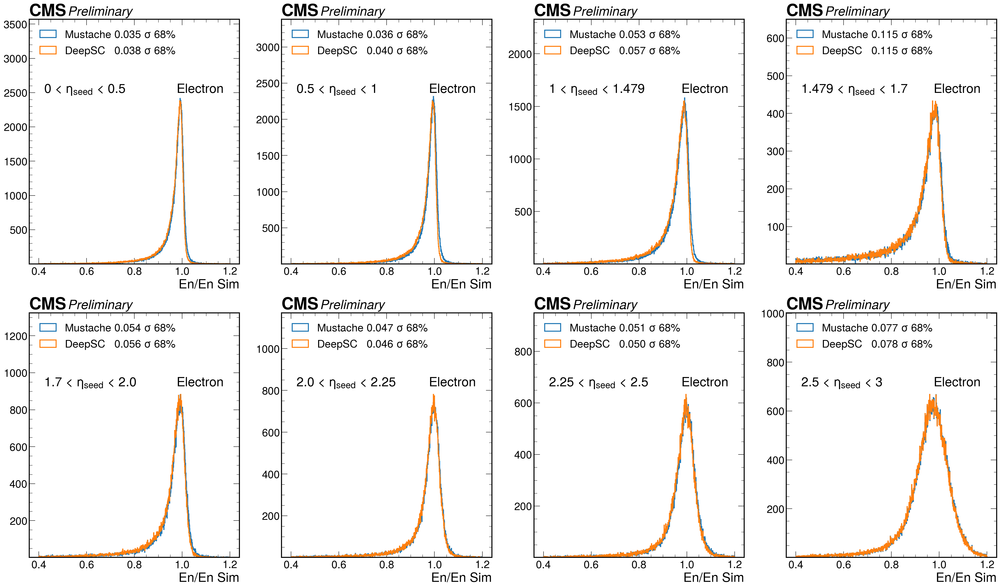

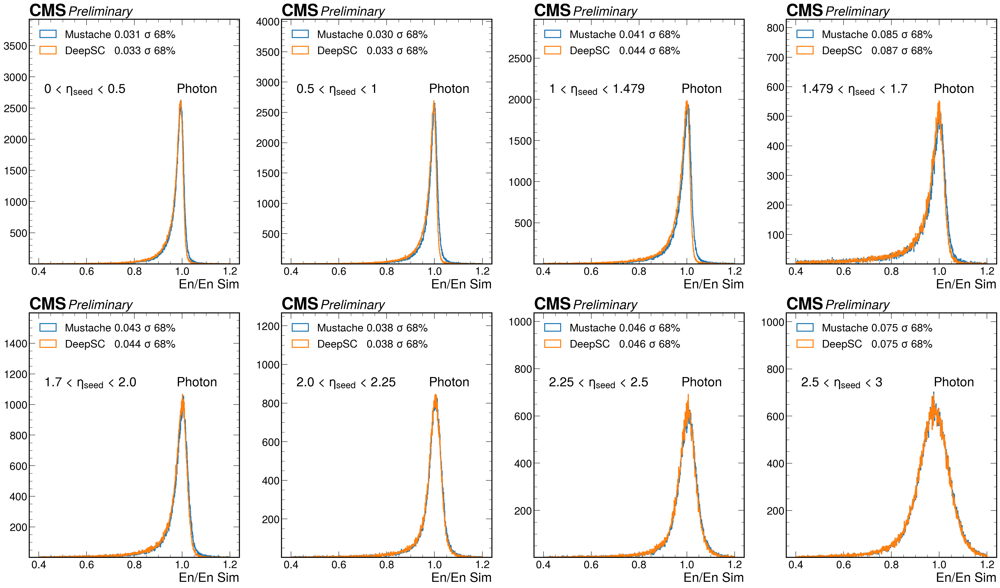

In [11]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(2,4, figsize=(35,20),dpi=150)

    xrange = (0.4, 1.2)
    bins= 1000
    CL = 0.4


    r = [0, 0.5,1, 1.479, 1.7, 2.0, 2.25, 2.5, 3]
    s = [[], []]
    for i in range(len(r)-1):
        line = i //4 
        s[line].append((r[i],r[i+1]))

    for j,ss in enumerate(s): 
        for i, (e1,e2) in enumerate(ss): 
            dfx = df[(abs(df.seed_eta)>=e1) & (abs(df.seed_eta)<e2)]

            width, width_2 = get_sigma_eff(dfx.En_ovEtrue_sim_good)
            width_must, width_2_must = get_sigma_eff(dfx.En_ovEtrue_sim_good_mustache)
    #         rms_regr = dfx.En_ovEtrue_gen_corr.std()

            ax[j,i].hist(dfx.En_ovEtrue_sim_good_mustache,bins=bins, range=xrange,histtype='step', linewidth=2, label='Mustache {:.3f} $\sigma$ 68%'.format(width_must))
            A= ax[j,i].hist(dfx.En_ovEtrue_sim_good,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC   {:.3f} $\sigma$ 68%'.format(width))
    #         ax[j,i].hist(dfx.En_ovEtrue_gen_corr,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC +regre    RMS: {:.4f}'.format(rms_regr))
            maxY = np.max(A[0])
            ax[j,i].legend(loc="upper left")
    #         ax[j,i].set_yscale('log')
            ax[j,i].set_ylim(1, 1.5 * maxY)
            ax[j,i].set_xlabel("En/En Sim")
            ax[j,i].text(0.07,0.7,  str(e1) + ' < $\eta_{seed}$ < ' + str(e2), transform = ax[j,i].transAxes)  
            ax[j,i].text(0.7, 0.7, flavour, transform=ax[j,i].transAxes)

            hep.cms.text("Preliminary ",loc=0, ax=ax[j,i])


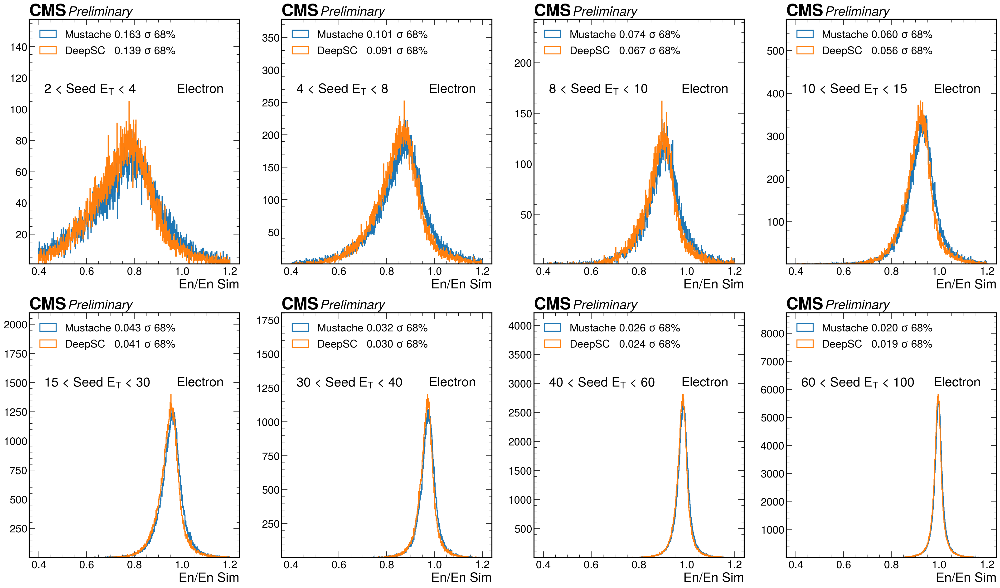

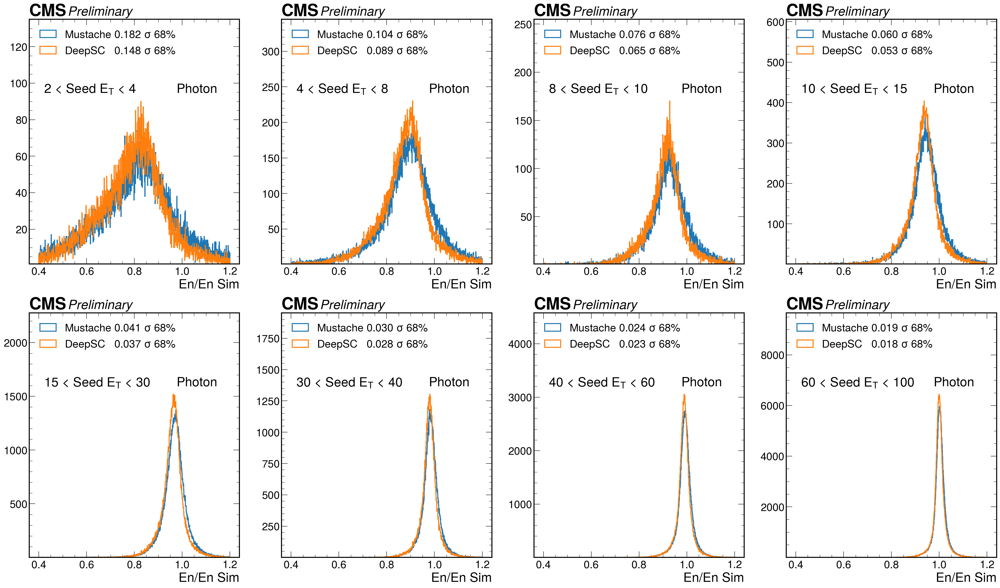

In [12]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(2,4, figsize=(35,20),dpi=150)

    xrange = (0.4, 1.2)
    bins= 1000
    CL = 0.4


    r = [2, 4, 8, 10, 15, 30 ,40, 60,100]
    s = [[], []]
    for i in range(len(r)-1):
        line = i //4 
        s[line].append((r[i],r[i+1]))

    for j,ss in enumerate(s): 
        for i, (e1,e2) in enumerate(ss): 
            dfx = df[(abs(df.et_seed)>=e1) & (abs(df.et_seed)<e2)]

            width, width_2 = get_sigma_eff(dfx.En_ovEtrue_sim_good)
            width_must, width_2_must = get_sigma_eff(dfx.En_ovEtrue_sim_good_mustache)
    #         rms_regr = dfx.En_ovEtrue_gen_corr.std()

            ax[j,i].hist(dfx.En_ovEtrue_sim_good_mustache,bins=bins, range=xrange,histtype='step', linewidth=2, label='Mustache {:.3f} $\sigma$ 68%'.format(width_must))
            A= ax[j,i].hist(dfx.En_ovEtrue_sim_good,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC   {:.3f} $\sigma$ 68%'.format(width))
    #         ax[j,i].hist(dfx.En_ovEtrue_gen_corr,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC +regre    RMS: {:.4f}'.format(rms_regr))
            maxY = np.max(A[0])
            ax[j,i].legend(loc="upper left")
    #         ax[j,i].set_yscale('log')
            ax[j,i].set_ylim(1, 1.5 * maxY)
            ax[j,i].set_xlabel("En/En Sim")
            ax[j,i].text(0.07,0.7,  str(e1) + ' < Seed $E_T$ < ' + str(e2), transform = ax[j,i].transAxes)  
            ax[j,i].text(0.7, 0.7, flavour, transform=ax[j,i].transAxes)

            hep.cms.text("Preliminary ",loc=0, ax=ax[j,i])


# Inclusive comparison

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

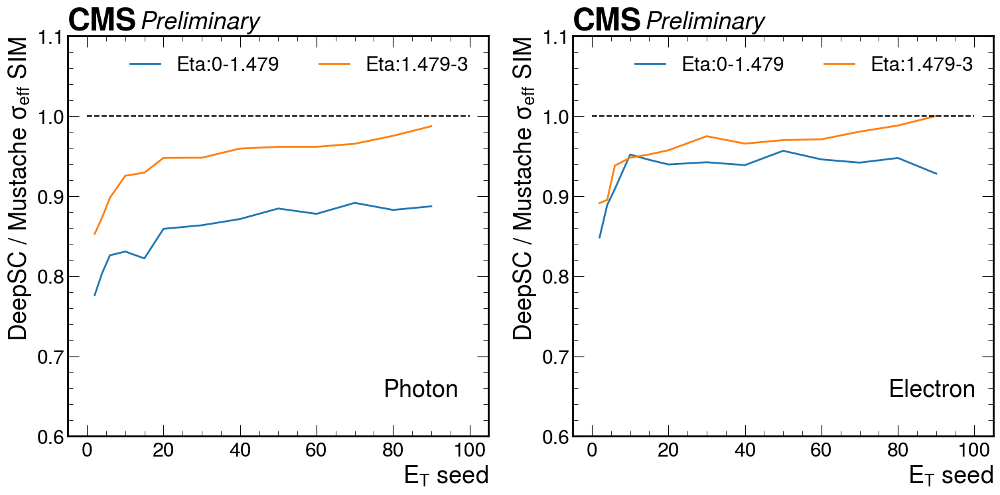

In [13]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 1.479, 3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.1, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 1.479, 3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.1, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

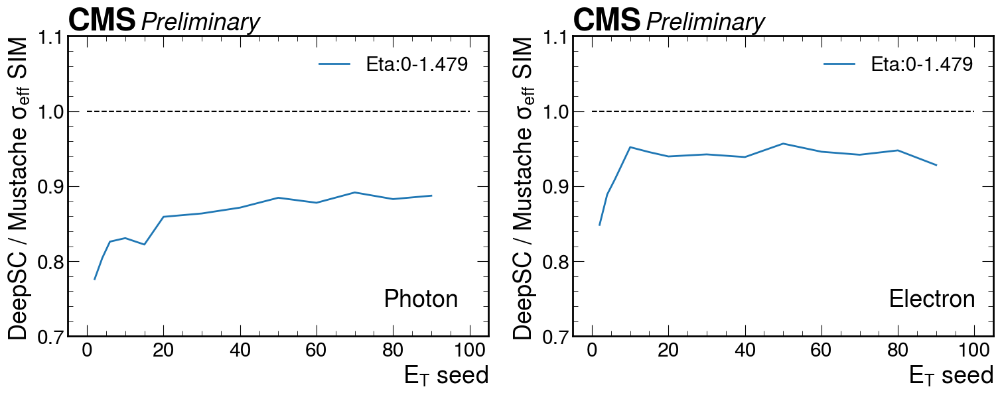

In [50]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,6),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 1.479]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.7, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.1, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.7, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.1, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

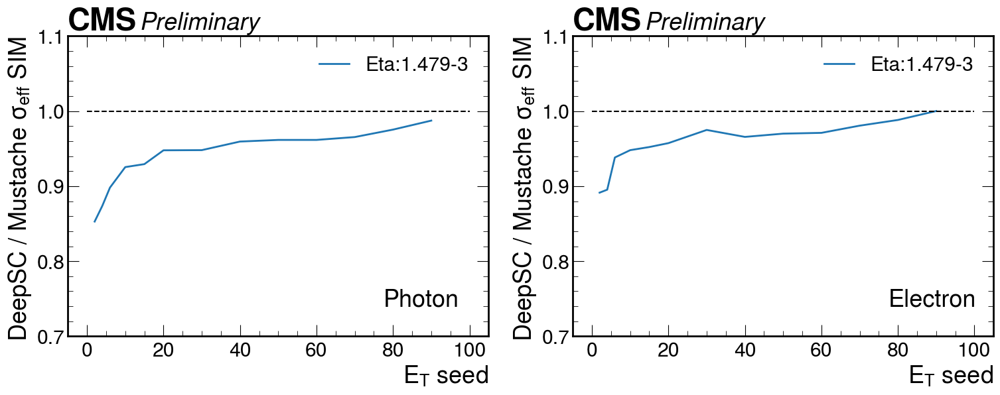

In [51]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,6),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [1.479, 3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.7, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.1, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.7, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.1, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 2.0000e+01, 2.2000e+01,
        5.5000e+01, 1.3200e+02, 2.1100e+02, 2.2100e+02, 4.9900e+02,
        7.6200e+02, 1.1980e+03, 1.7650e+03, 2.5410e+03, 3.7680e+03,
        5.4710e+03, 7.1290e+03, 9.0980e+03, 1.1749e+04, 1.4136e+04,
        1.7361e+04, 2.0069e+04, 2.2935e+04, 2.6551e+04, 2.8736e+04,
        3.1750e+04, 3.4357e+04, 3.5179e+04, 3.6361e+04, 3.7959e+04,
        3.8087e+04, 3.7449e+04, 3.7846e+04, 3.5790e+04, 3.4062e+04,
        3.2542e+04, 3.1764e+04, 2.9928e+04, 2.7638e+04, 2.5805e+04,
        2.3320e+04, 2.1326e+04, 1.9577e+04, 1.7663e+04, 1.6036e+04,
        1.4113e+04, 1.3035e+04, 1.1406e+04, 9.9010e+03, 9.0960e+03,
        8.1230e+03, 6.8940e+03, 5.8810e+03, 5.3490e+03, 4.7570e+03,
        4.1320e+03, 3.5730e+03, 3.0940e+03, 2.8710e+03, 2.4100e+03,
        2.1450e+03, 1.7980e+03, 1.5220e+03, 1.3830e+03, 1.1800e+03,
        1.1600e+03, 9.1900e+02, 7.5500e+02, 7.1200e+02, 6.7200e+02,
        5.5200e+02, 4.9200e+02, 4.2000e+02, 3.73

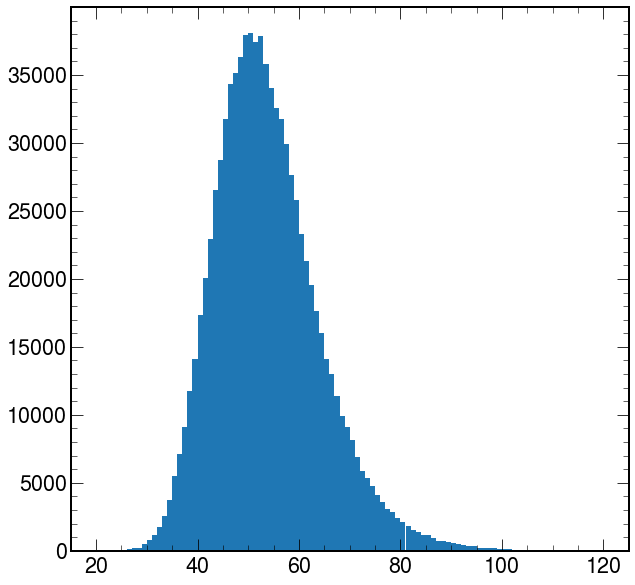

In [18]:
plt.hist(df_ele.nVtx, range=(20,120), bins=100)

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 4.0000e+00,
        3.0000e+00, 1.9000e+01, 1.5000e+01, 3.4000e+01, 9.8000e+01,
        1.3900e+02, 1.5500e+02, 2.4200e+02, 4.0000e+02, 6.5600e+02,
        8.3900e+02, 1.2050e+03, 1.7570e+03, 2.4140e+03, 3.1730e+03,
        3.7940e+03, 5.4280e+03, 6.7880e+03, 8.1390e+03, 9.8550e+03,
        1.1652e+04, 1.3963e+04, 1.6251e+04, 1.8675e+04, 2.0735e+04,
        2.2640e+04, 2.4749e+04, 2.6395e+04, 2.9023e+04, 3.0507e+04,
        3.2510e+04, 3.2933e+04, 3.3867e+04, 3.3688e+04, 3.4298e+04,
        3.4526e+04, 3.4690e+04, 3.3796e+04, 3.2859e+04, 3.2050e+04,
        3.0289e+04, 2.8304e+04, 2.6972e+04, 2.5503e+04, 2.3667e+04,
        2.1826e+04, 2.0250e+04, 1.7821e+04, 1.6504e+04, 1.4379e+04,
        1.2862e+04, 1.1310e+04, 9.5780e+03, 8.1780e+03, 6.7220e+03,
        5.9110e+03, 4.9230e+03, 3.9810e+03, 3.3670e+03, 2.6080e+03,
        2.2600e+03, 1.8110e+03, 1.4560e+03, 9.55

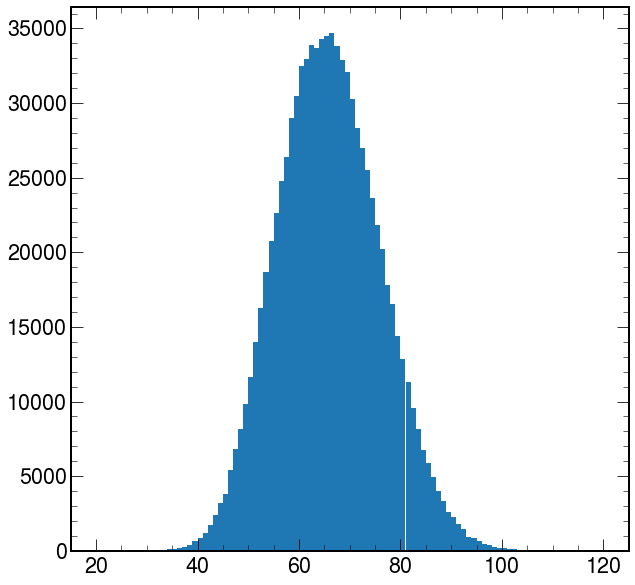

In [24]:
plt.hist(df_ele.obsPU, range=(20,120), bins=100)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

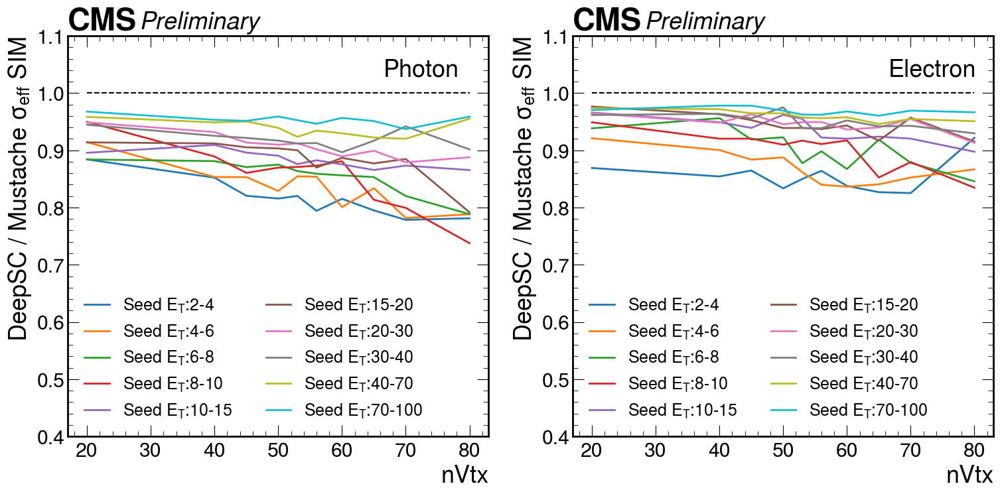

In [39]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
nvtx = [20,40,45,50,53,56,60,65,70,80,120]
ets = [2,4,6,8,10,15,20,30,40,70,100]
df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, et in enumerate(ets[:-1]):
    ax.plot(nvtx[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax.set_ylim(0.4, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2, fontsize='x-small')
ax.set_xlabel("nVtx")
ax.plot([20,80],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ets[:-1]):
    ay.plot(nvtx[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay.set_ylim(0.4, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2, fontsize='x-small')
ay.set_xlabel("nVtx")
ay.plot([20,80],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)




(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

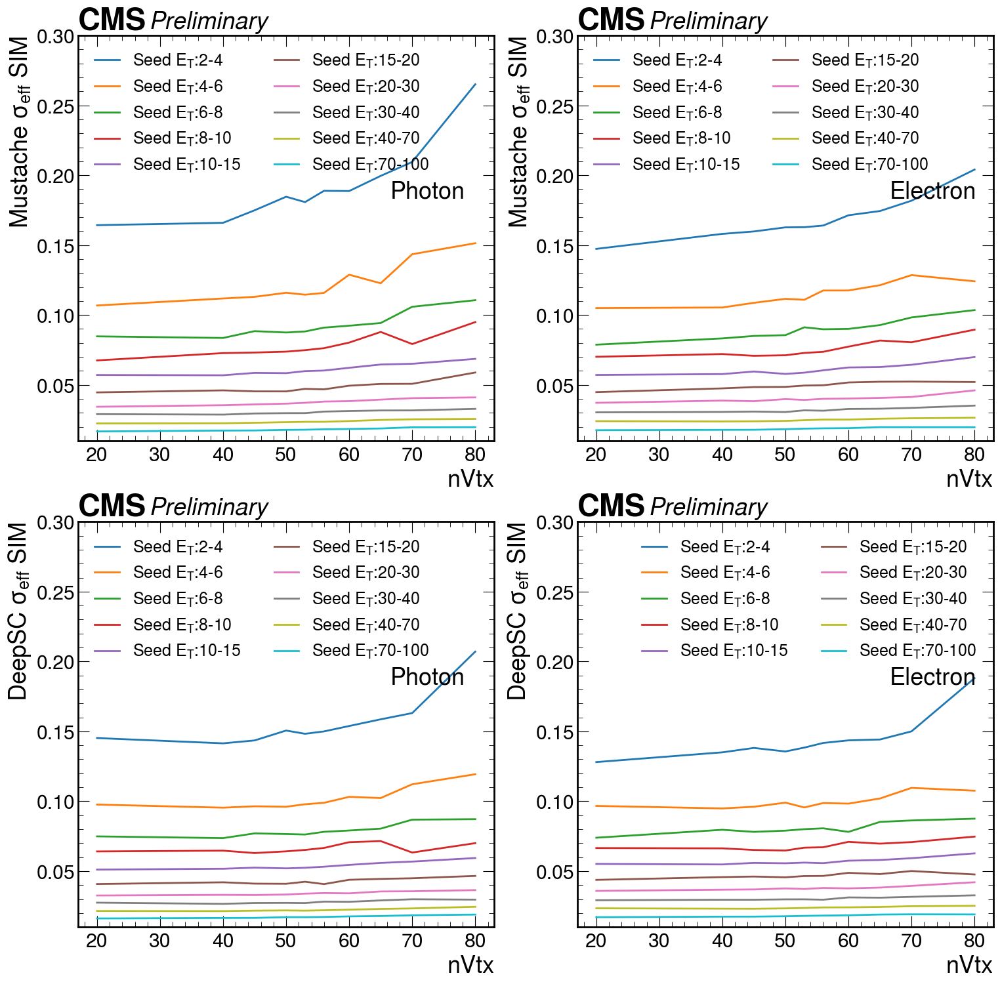

In [41]:
fig, ((ax, ay),(ax2, ay2)) = plt.subplots(2,2, figsize=(18,18),dpi=100, )

df = df_gamma
flavour = "Photon"
nvtx = [20,40,45,50,53,56,60,65,70,80,120]
ets = [2,4,6,8,10,15,20,30,40,70,100]
df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, et in enumerate(ets[:-1]):
    ax.plot(nvtx[:-1], res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax.set_ylim(0.01, 0.3)
ax.set_ylabel("Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2, fontsize='x-small')
ax.set_xlabel("nVtx")
ax.text(0.75, 0.6, flavour, transform=ax.transAxes)
hep.cms.text("Preliminary", loc=0, ax=ax)


for ieta, et in enumerate(ets[:-1]):
    ax2.plot(nvtx[:-1], res[res.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax2.set_ylim(0.01, 0.3)
ax2.set_ylabel("DeepSC $\sigma_{eff}$ SIM")
ax2.legend(ncol=2, fontsize='x-small')
ax2.set_xlabel("nVtx")
ax2.text(0.75, 0.6, flavour, transform=ax2.transAxes)
hep.cms.text("Preliminary", loc=0, ax=ax2)




df = df_ele
flavour = "Electron"

df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ets[:-1]):
    ay.plot(nvtx[:-1], res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay.set_ylim(0.01, 0.3)
ay.set_ylabel("Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2, fontsize='x-small')
ay.set_xlabel("nVtx")
ay.text(0.75, 0.6, flavour, transform=ay.transAxes)
hep.cms.text("Preliminary", loc=0, ax=ay)

for ieta, et in enumerate(ets[:-1]):
    ay2.plot(nvtx[:-1], res[res.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay2.set_ylim(0.01, 0.3)
ay2.set_ylabel("DeepSC $\sigma_{eff}$ SIM")
ay2.legend(ncol=2, fontsize='x-small')
ay2.set_xlabel("nVtx")
ay2.text(0.75, 0.6, flavour, transform=ay2.transAxes)
hep.cms.text("Preliminary", loc=0, ax=ay2)


(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

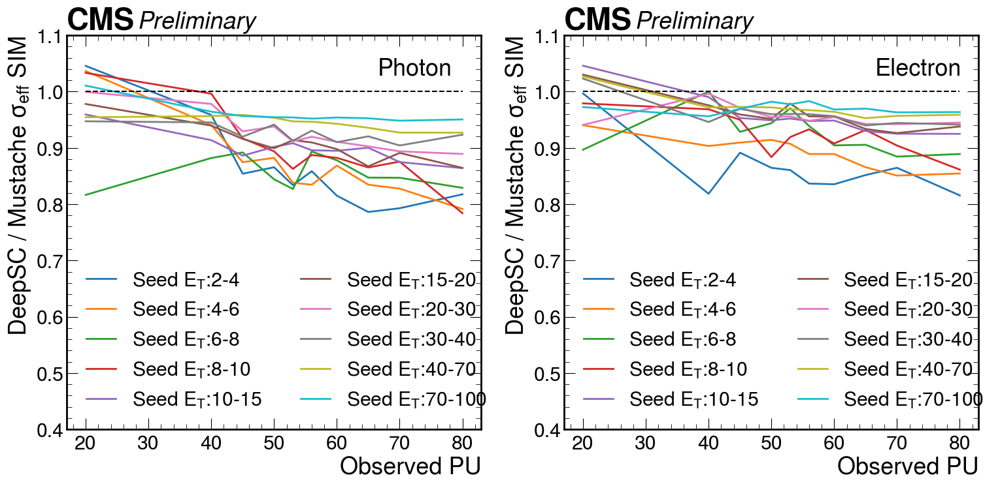

In [25]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
nvtx = [20,40,45,50,53,56,60,65,70,80,120]
ets = [2,4,6,8,10,15,20,30,40,70,100]
df["nvtx_bin"] = pd.cut(df.obsPU, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, et in enumerate(ets[:-1]):
    ax.plot(nvtx[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax.set_ylim(0.4, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("Observed PU")
ax.plot([20,80],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["nvtx_bin"] = pd.cut(df.obsPU, nvtx, labels=list(range(len(nvtx)-1)))
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))


res = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ets[:-1]):
    ay.plot(nvtx[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="Seed $E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay.set_ylim(0.4, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("Observed PU")
ay.plot([20,80],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

In [ ]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
nvtx = [20,30,40,45,50,55,60,65,70,80,100,120]
etas = [0, 1.479, 3]
df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["nvtx_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(nvtx[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("nVtx")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.1, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["nvtx_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["nvtx_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(nvtx[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("nVtx")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.1, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

# Comparison 

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.


(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

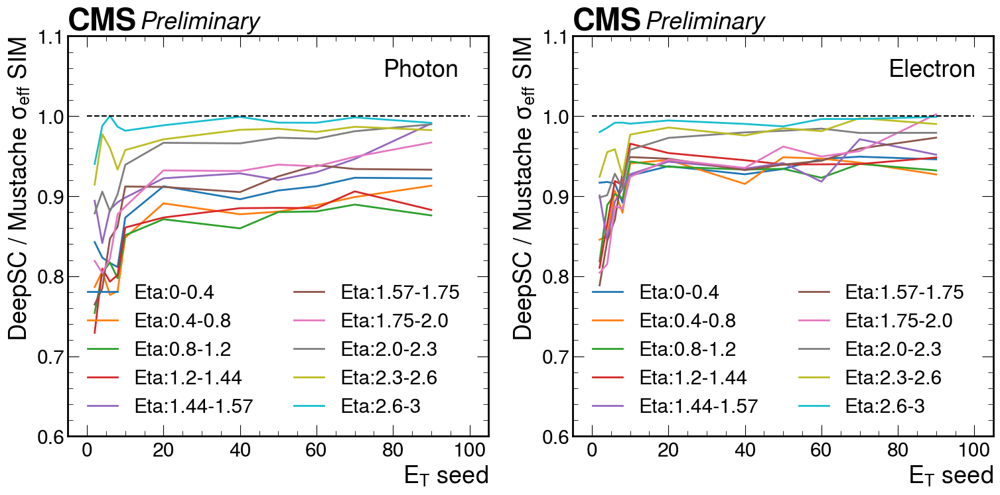

In [8]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"

ets = [2, 4,6,8, 10,20,40,50,60,70,90,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

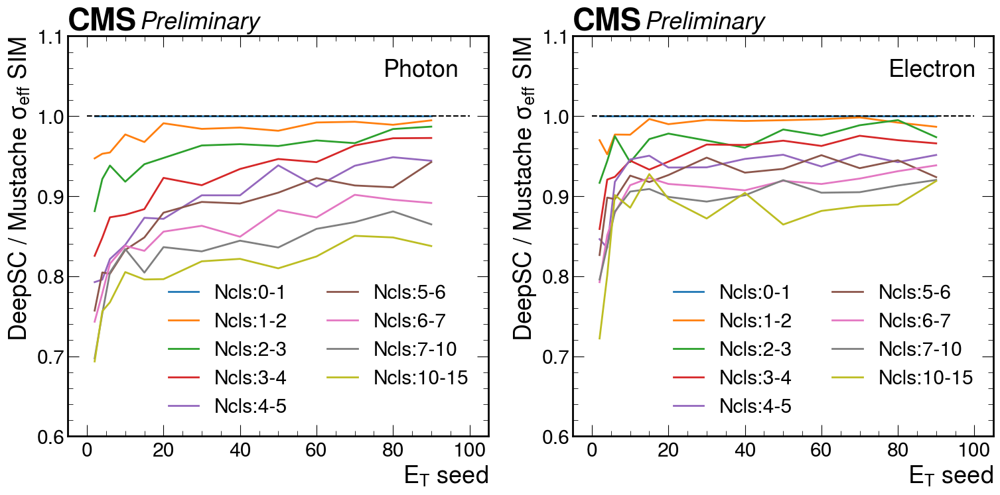

In [15]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

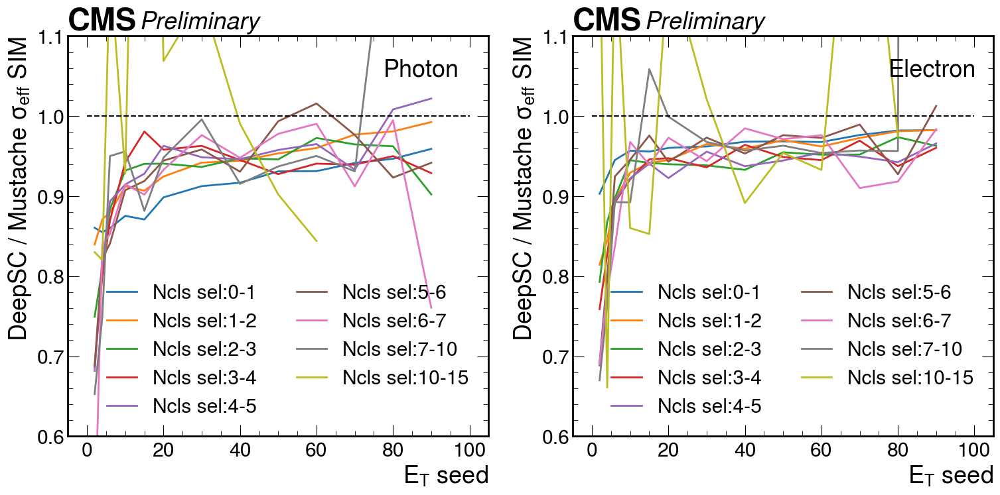

In [16]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_sel, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls sel:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_sel, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls sel:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

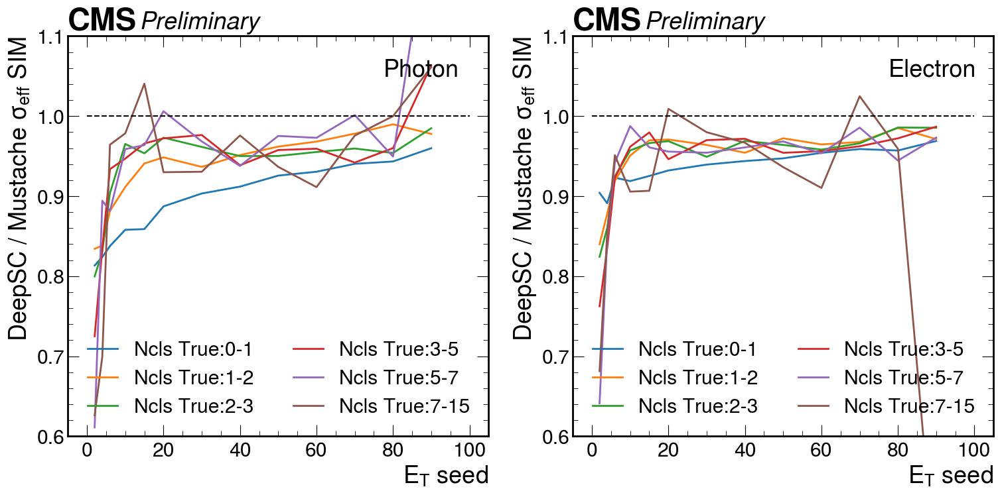

In [17]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,5,7,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_true, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls True:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,5,7,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_true, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls True:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

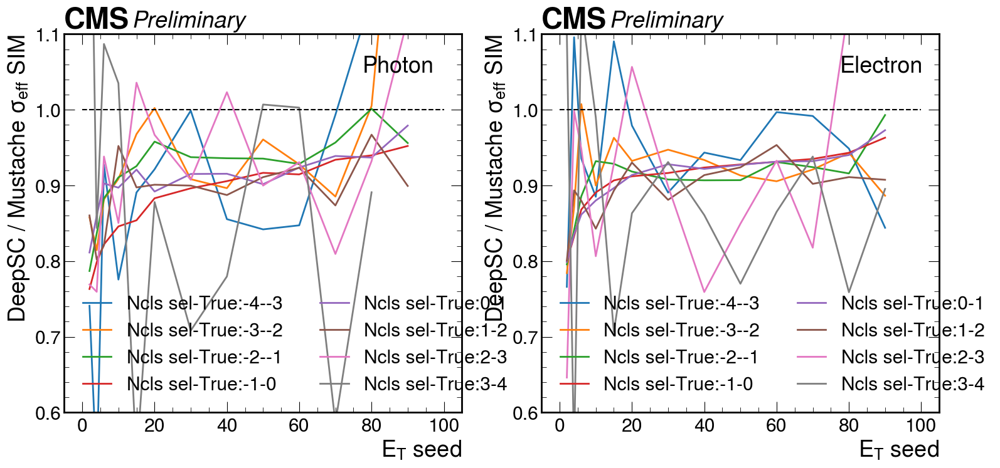

In [18]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [-4,-3,-2,-1,0,1,2,3,4]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_sel- df.ncls_true, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls sel-True:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [-4,-3,-2,-1,0,1,2,3,4]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls_sel- df.ncls_true, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls sel-True:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

In [10]:
df.eta

0         0.944004
1         0.540314
2         2.180974
3         1.521933
4         2.748403
            ...   
899702    0.781789
899703    1.278434
899704    0.715025
899705    1.150989
899706    1.611707
Name: eta, Length: 899707, dtype: float64

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

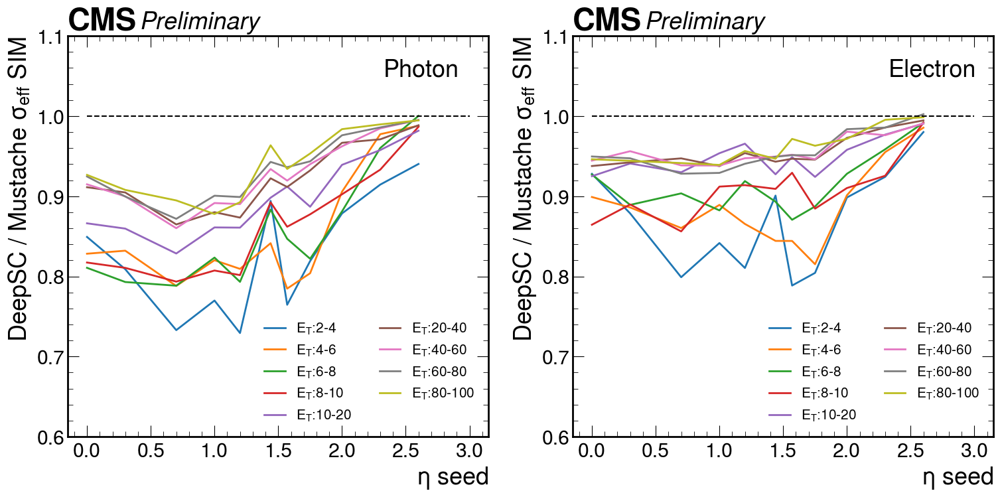

In [9]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 8, 10,20,40,60,80,100]
etas = [0, 0.3,0.7,1.0, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ets[:-1]):
    ax.plot(etas[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="$E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2, fontsize="xx-small")
ax.set_xlabel("$\eta$ seed")
ax.plot([0,3],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ets[:-1]):
    ay.plot(etas[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="$E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2, loc="lower right", fontsize="xx-small")
ay.set_xlabel("$\eta$ seed")
ay.plot([0,3],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

Text(0.75, 1.02, 'Photon')

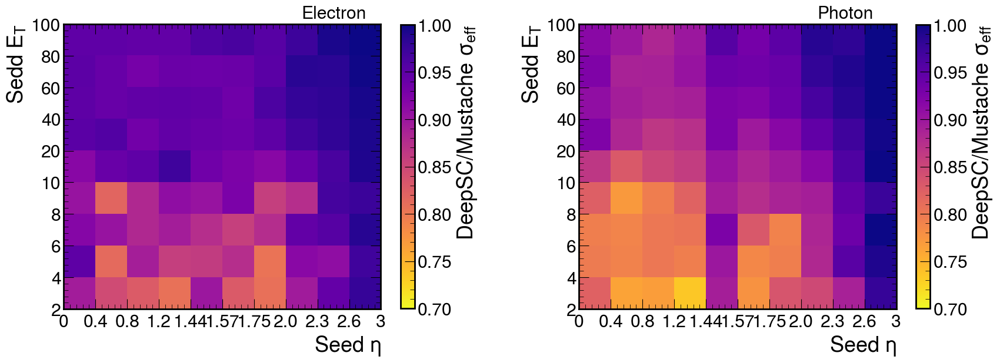

In [22]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.3)

df = df_ele
flavour = "Electron"
ets = [2, 4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


vmax=1
vmin =0.7

a1 = res.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
a2 = res_must.w68.values.reshape((len(etas)-1,len(ets)-1))
a2[a2==0] = np.nan

A = ax.imshow((a1/a2).T, vmin=vmin, vmax=vmax, cmap="plasma_r")
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Sedd $E_T$")
fig.colorbar(A , label="DeepSC/Mustache $\sigma_{eff}$", ax=ax, shrink=0.8)

ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)

ax.text(0.75, 1.02, flavour, transform=ax.transAxes,  fontsize="small")

df = df_gamma
flavour = "Photon"
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


a1 = res.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
a2 = res_must.w68.values.reshape((len(etas)-1,len(ets)-1))
a2[a2==0] = np.nan

A = ay.imshow((a1/a2).T, vmin=vmin, vmax=vmax, cmap="plasma_r")
ay.set_xlabel("Seed $\eta$")
ay.set_ylabel("Sedd $E_T$")
fig.colorbar(A , label="DeepSC/Mustache $\sigma_{eff}$", ax=ay, shrink=0.8)

ay.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ay.set_yticklabels(ets)
ay.set_xticklabels(etas)

ax.text(0.75, 1.02, flavour, transform=ay.transAxes,  fontsize="small")


In [23]:
pd.options.mode.chained_assignment = None  # default='warn'

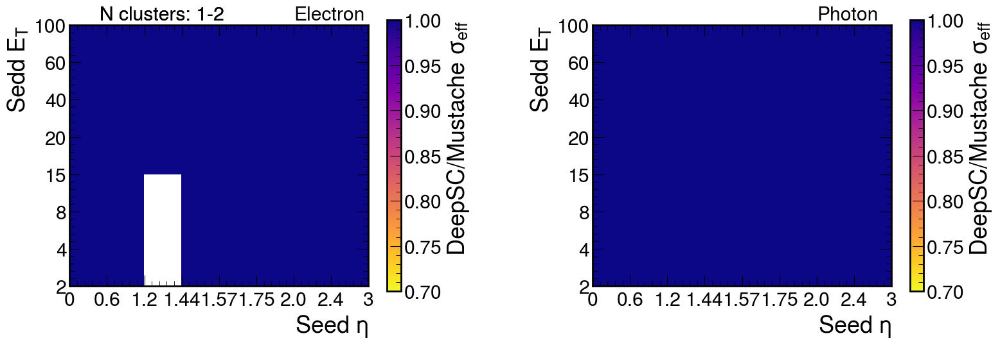

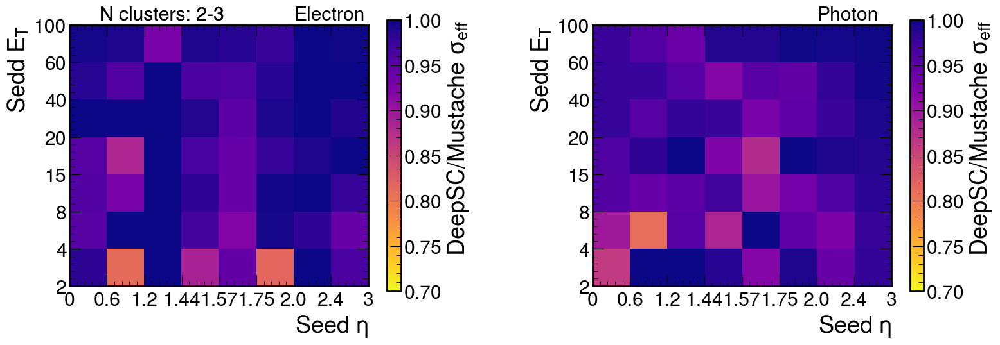

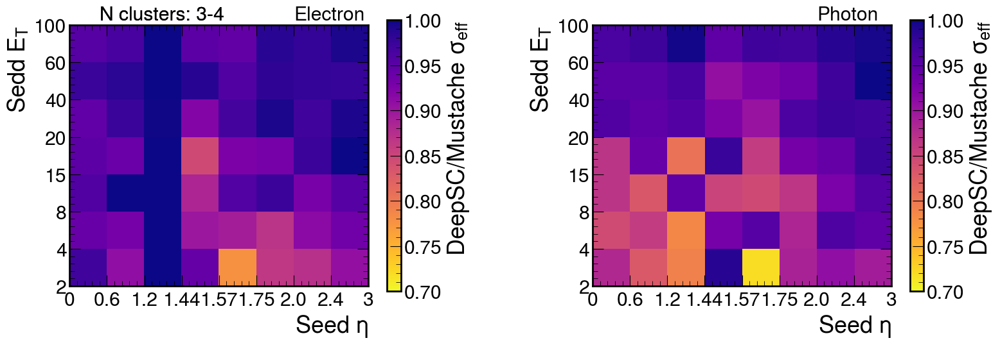

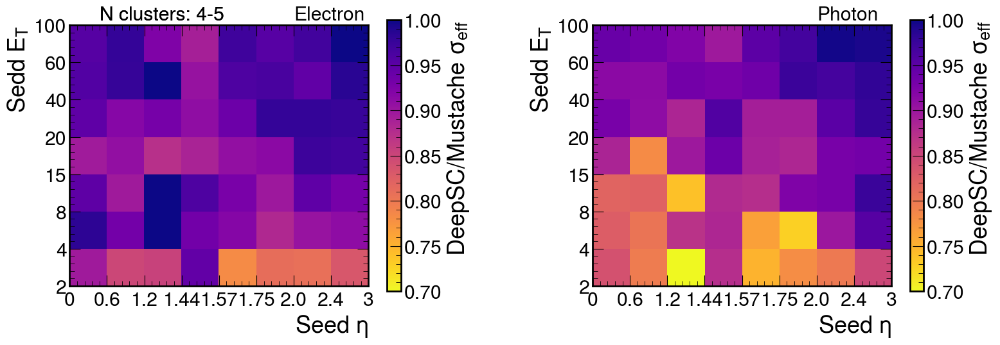

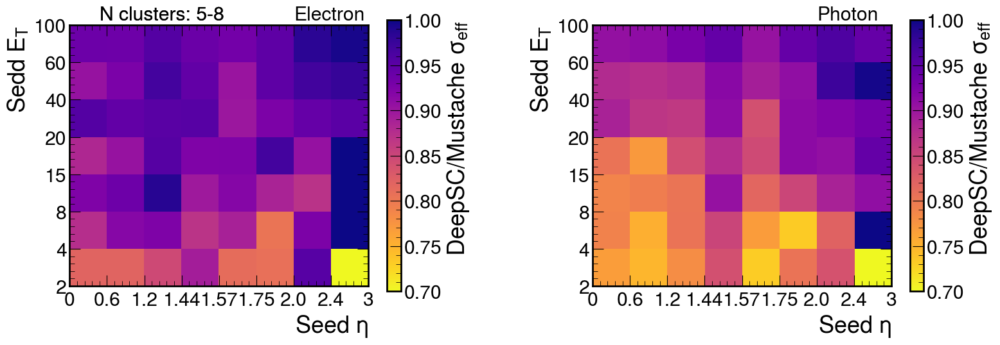

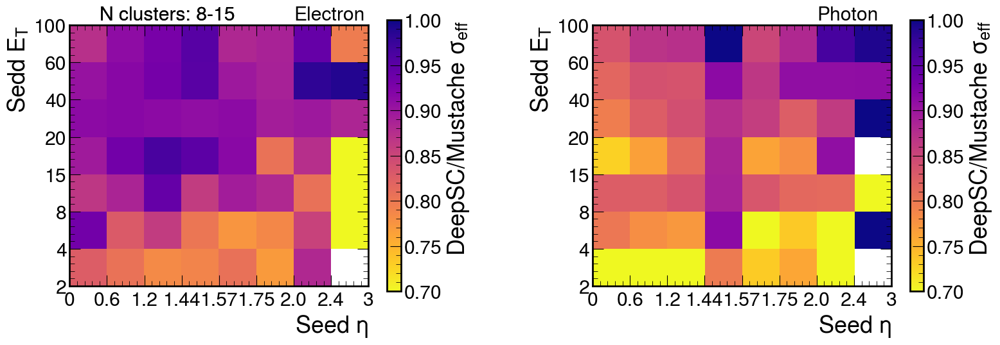

In [24]:

ncls = [1, 2,3,4,5,8,15]
for icl in range(len(ncls)-1):

    fig, (ax, ay) = plt.subplots(1,2, figsize=(18, 8),dpi=100, )
    plt.subplots_adjust( wspace=0.4)


    df = df_ele.loc[ (df_ele.ncls >=ncls[icl]) & (df_ele.ncls <ncls[icl+1])]
    flavour = "Electron"
    ets = [2, 4, 8,15, 20,40,60,100]
    etas = [0, 0.6, 1.2,1.44, 1.57, 1.75, 2., 2.4, 3]
    df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
    df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


    res = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
    res_must = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
    res.reset_index(level=0, inplace=True)
    res.reset_index(level=0, inplace=True)
    res_must.reset_index(level=0, inplace=True)
    res_must.reset_index(level=0, inplace=True)


    vmax=1
    vmin =0.7

    a1 = res.w68.values.reshape((len(etas)-1,len(ets)-1))
    a1[a1==0] = np.nan
    a2 = res_must.w68.values.reshape((len(etas)-1,len(ets)-1))
    a2[a2==0] = np.nan

    A = ax.imshow((a1/a2).T, vmin=vmin, vmax=vmax, cmap="plasma_r")
    ax.set_xlabel("Seed $\eta$")
    ax.set_ylabel("Sedd $E_T$")
    fig.colorbar(A , label="DeepSC/Mustache $\sigma_{eff}$", ax=ax, shrink=0.7)

    ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ax.set_yticklabels(ets)
    ax.set_xticklabels(etas)
    
    ax.text(0.75, 1.02, flavour, transform=ax.transAxes,  fontsize="small")
    ax.text(0.1, 1.02, "N clusters: {}-{}".format(ncls[icl], ncls[icl+1]), transform=ax.transAxes,  fontsize="small")

    df = df_gamma.loc[ (df_gamma.ncls >=ncls[icl]) & (df_gamma.ncls <ncls[icl+1])]
    flavour = "Photon"
    df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
    df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


    res = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
    res_must = df.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
    res.reset_index(level=0, inplace=True)
    res.reset_index(level=0, inplace=True)
    res_must.reset_index(level=0, inplace=True)
    res_must.reset_index(level=0, inplace=True)


    a1 = res.w68.values.reshape((len(etas)-1,len(ets)-1))
    a1[a1==0] = np.nan
    a2 = res_must.w68.values.reshape((len(etas)-1,len(ets)-1))
    a2[a2==0] = np.nan

    A = ay.imshow((a1/a2).T, vmin=vmin, vmax=vmax, cmap="plasma_r")
    ay.set_xlabel("Seed $\eta$")
    ay.set_ylabel("Sedd $E_T$")
    fig.colorbar(A , label="DeepSC/Mustache $\sigma_{eff}$", ax=ay, shrink=0.7)

    ay.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
    ay.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ay.set_yticklabels(ets)
    ay.set_xticklabels(etas)

    ax.text(0.75, 1.02, flavour, transform=ay.transAxes,  fontsize="small")
    ax.text(0.1, 1.02, "N clusters: {}-{}".format(ncls[icl], ncls[icl+1]), transform=ax.transAxes,  fontsize="small")


(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

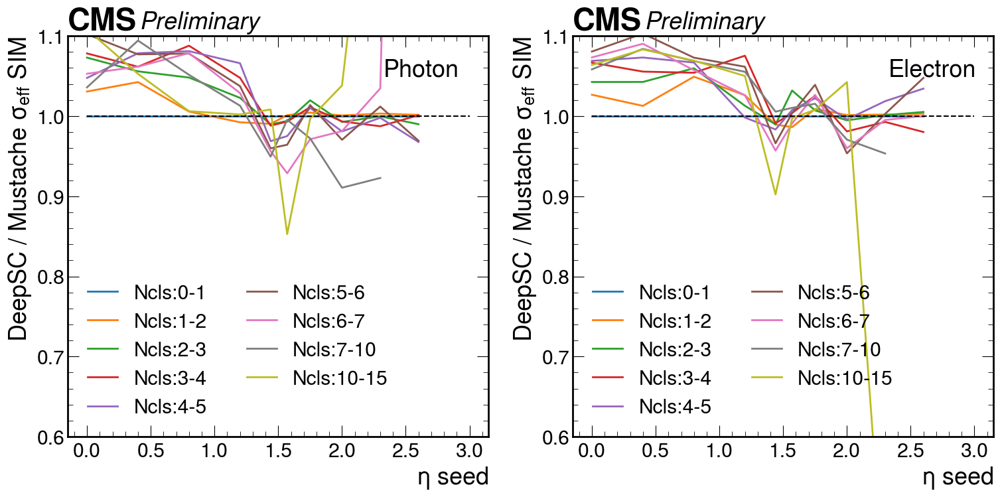

In [29]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df[df.et>5].groupby(["eta_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df[df.et>5].groupby(["eta_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(etas[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$\eta$ seed")
ax.plot([0,3],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df[df.et>5].groupby(["eta_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df[df.et>5].groupby(["eta_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(etas[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$\eta$ seed")
ay.plot([0,3],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

In [30]:
df.columns

Index(['ncls', 'ncls_true', 'ncls_sel', 'ncls_sel_true', 'En_cl_first_fn',
       'En_cl_first_fp', 'En_cl_second_fn', 'En_cl_second_fp', 'En_cl_true_2',
       'En_cl_true_3',
       ...
       'iz', 'ieta', 'iphi', 'eta', 'phi', 'en', 'et', 'et_bin', 'eta_bin',
       'ncls_bin'],
      dtype='object', length=109)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

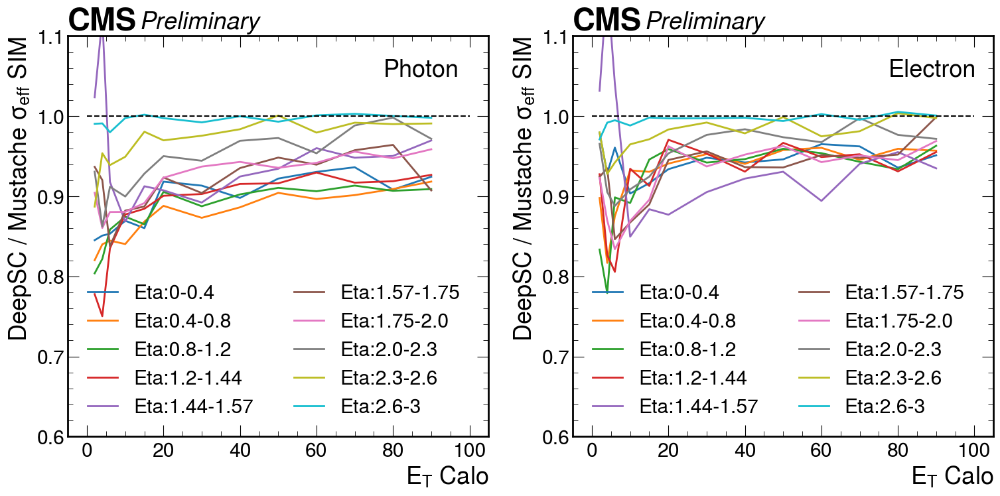

In [31]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.En_true_sim_good / np.cosh(df.sim_true_eta) , ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))



res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ Calo")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.En_true_sim_good / np.cosh(df.sim_true_eta) , ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ Calo")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

# Window classification

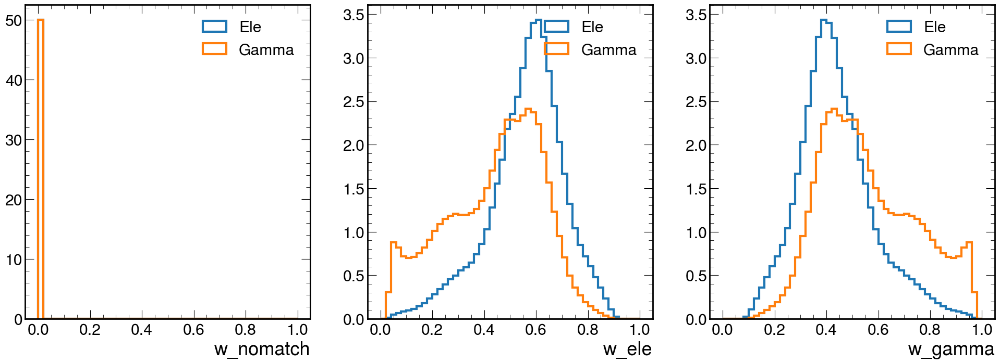

In [32]:
fig, ax = plt.subplots(1,3, figsize=(24,8),dpi=100)

for i, v in enumerate(['w_nomatch','w_ele','w_gamma']):
#     ax[i].hist(df_nomatch[v], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="No matched")
    ax[i].hist(df_ele[v], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Ele")
    ax[i].hist(df_gamma[v], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Gamma")
    ax[i].set_xlabel(v)
    ax[i].legend()

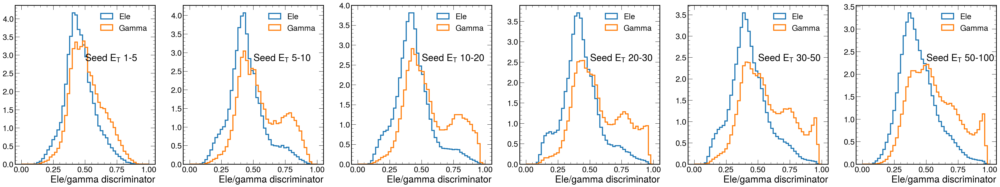

In [145]:
fig, ax = plt.subplots(1,6, figsize=(48,8),dpi=100)

ets = [1,5,10,20,30,50,100]

for iet in range(len(ets)-1):
#     ax[i].hist(df_nomatch[v], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="No matched")
    ax[iet].hist(df_ele[(df_ele.et > ets[iet] ) & (df_ele.et_seed < ets[iet+1])]["w_gamma"], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Ele")
    ax[iet].hist(df_gamma[(df_gamma.et > ets[iet] ) & (df_gamma.et_seed < ets[iet+1])]["w_gamma"], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Gamma")
    ax[iet].set_xlabel("Ele/gamma discriminator")
    ax[iet].text(0.5,0.65, "Seed $E_T$ {}-{}".format(ets[iet],ets[iet+1]), transform=ax[iet].transAxes)
    ax[iet].legend()

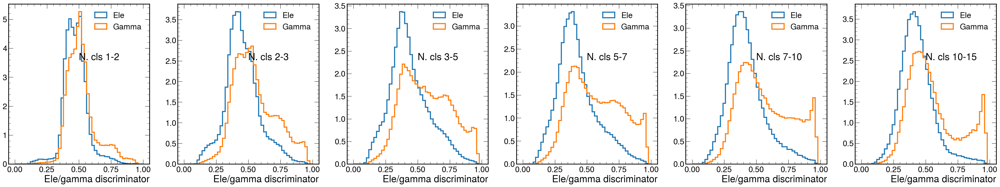

In [188]:
fig, ax = plt.subplots(1,6, figsize=(48,8),dpi=100)

ncls = [1,2,3,5,7,10,15]

for iet in range(len(ncls)-1):
#     ax[i].hist(df_nomatch[v], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="No matched")
    ax[iet].hist(df_ele[(df_ele.ncls >= ncls[iet] ) & (df_ele.ncls < ncls[iet+1])]["w_gamma"], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Ele")
    ax[iet].hist(df_gamma[(df_gamma.ncls >= ncls[iet] ) & (df_gamma.ncls < ncls[iet+1])]["w_gamma"], bins=50, range=(0,1), histtype="step", density=True, linewidth=3, label="Gamma")
    ax[iet].set_xlabel("Ele/gamma discriminator")
    ax[iet].text(0.5,0.65, "N. cls {}-{}".format(ncls[iet],ncls[iet+1]), transform=ax[iet].transAxes)
    ax[iet].legend()

In [12]:
def get_roc(df, true_fl, out):
    w_pos = df[df.flavour == true_fl][out].values
    w_neg = df[df.flavour != true_fl][out].values
    tot_pos = w_pos.shape[0]
    tot_neg = w_neg.shape[0]


    fpr, tpr, thresholds = [] , [], [] 
    for i in range(50):
        t = i/30.
        tp = np.sum(w_pos>t) / float(tot_pos)
        fp = np.sum(w_neg>t) / float(tot_neg)
        fpr.append(fp)
        tpr.append(tp)
        thresholds.append(i)
    return fpr, tpr
    
# roc_curve(df_tot.flavour, scores, pos_label=2)

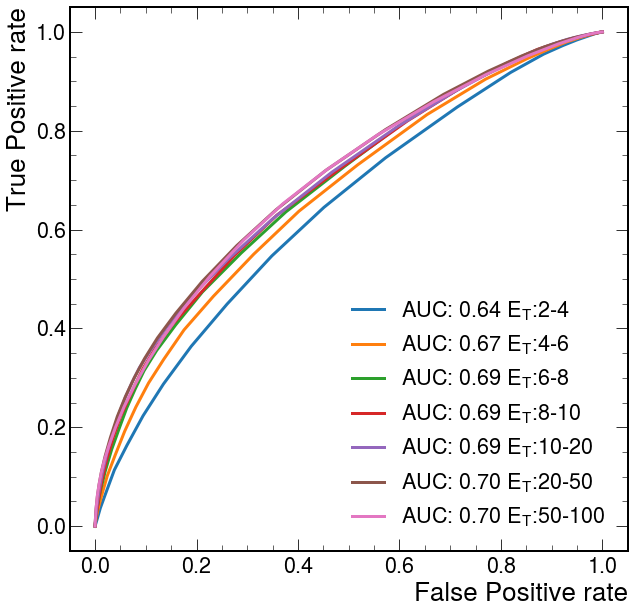

In [26]:
ets = [2,4,6,8,10,20,50,100]

for iet in range(len(ets)-1):
    fpr_nomat, tpr_nomat = get_roc(df_tot[(df_tot.et_seed >= ets[iet]) &(df_tot.et_seed < ets[iet+1])], 22, "w_gamma")
    plt.plot(fpr_nomat, tpr_nomat, label="AUC: {:.2f} $E_T$:{}-{}".format(auc(fpr_nomat, tpr_nomat), ets[iet], ets[iet+1]), linewidth=3)
   
plt.xlabel("False Positive rate")
plt.ylabel("True Positive rate")
plt.legend()

Text(1, 58.111111111111114, 'Seed $\\eta$')

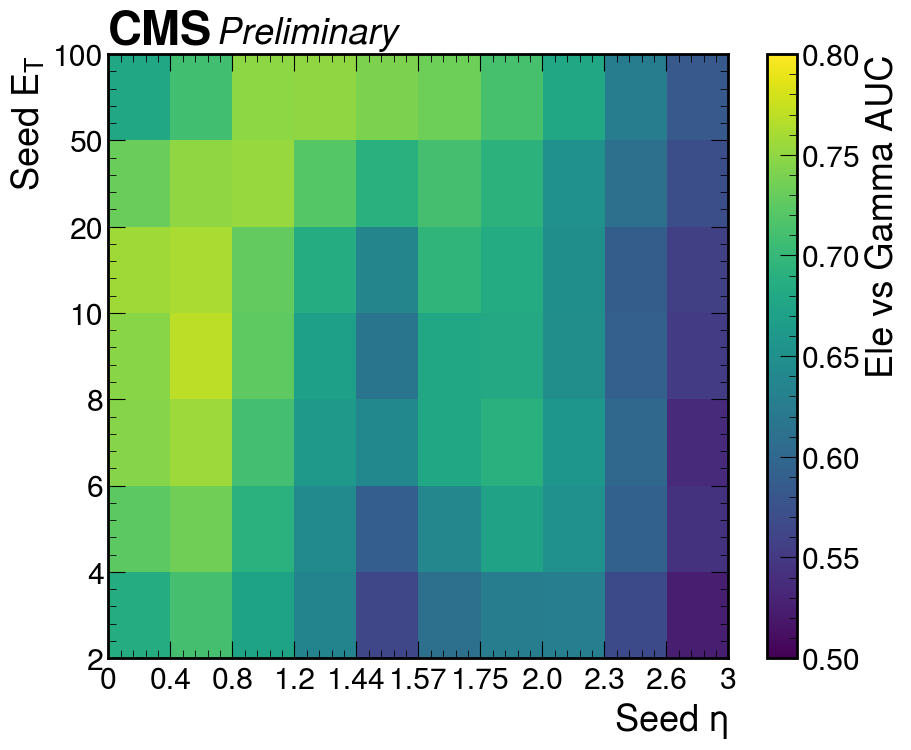

In [13]:
ets = [2,4,6,8,10,20,50,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
aucs = np.zeros((len(ets)-1, len(etas)-1))

for iet in range(len(ets)-1):
    for ieta in range(len(etas)-1):
        fpr_nomat, tpr_nomat = get_roc(df_tot[(df_tot.et_seed >= ets[iet]) &(df_tot.et_seed < ets[iet+1]) & (df_tot.seed_eta.abs() >= etas[ieta]) &(df_tot.seed_eta.abs() < etas[ieta+1])], 22, "w_gamma")
        aucs[iet,ieta] = auc(fpr_nomat, tpr_nomat)
        
fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100, )
I = ax.imshow(aucs, aspect="auto", vmin=0.5, vmax=0.8)
hep.cms.text("Preliminary ",loc=0, ax=ax)

ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)

fig.colorbar(I, label="Ele vs Gamma AUC")

ax.set_ylabel("Seed $E_T$")
ax.set_xlabel("Seed $\eta$")

Text(1, 58.111111111111114, 'N. clusters total')

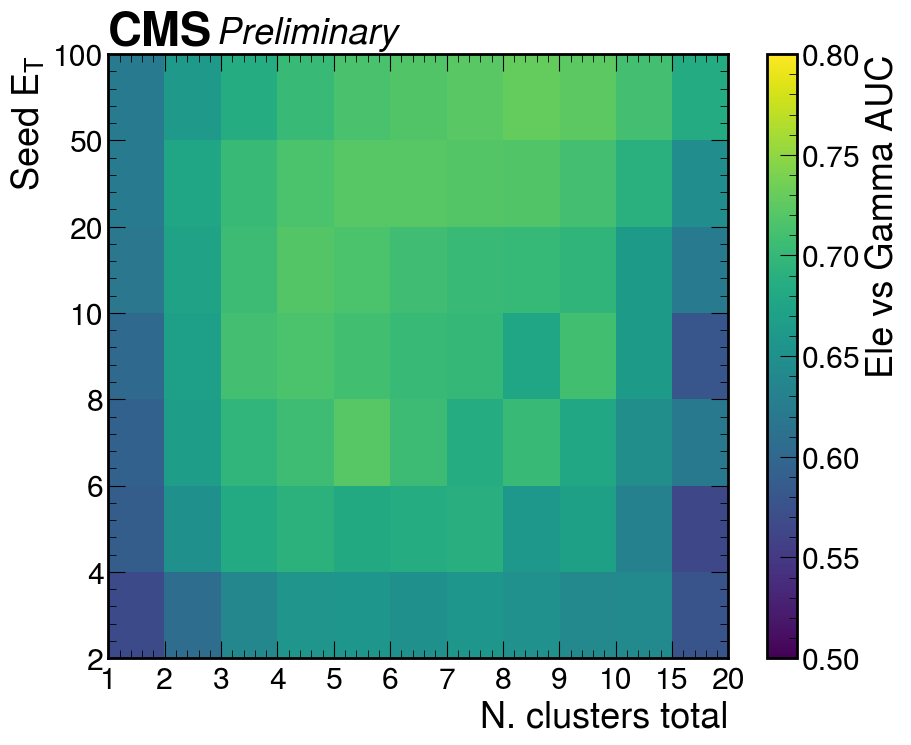

In [28]:
ets = [2,4,6,8,10,20,50,100]
ncls = [1,2,3,4,5,6,7,8,9,10,15,20]
aucs = np.zeros((len(ets)-1, len(ncls)-1))

for iet in range(len(ets)-1):
    for ncl in range(len(ncls)-1):
        fpr_nomat, tpr_nomat = get_roc(df_tot[(df_tot.et_seed >= ets[iet]) &(df_tot.et_seed < ets[iet+1]) & (df_tot.ncls >= ncls[ncl]) &(df_tot.ncls < ncls[ncl+1])], 22, "w_gamma")
        aucs[iet,ncl] = auc(fpr_nomat, tpr_nomat)
        
fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100, )
I = ax.imshow(aucs, aspect="auto", vmin=0.5, vmax=0.8)
hep.cms.text("Preliminary ",loc=0, ax=ax)

ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(ncls)

fig.colorbar(I, label="Ele vs Gamma AUC")

ax.set_ylabel("Seed $E_T$")
ax.set_xlabel("N. clusters total")

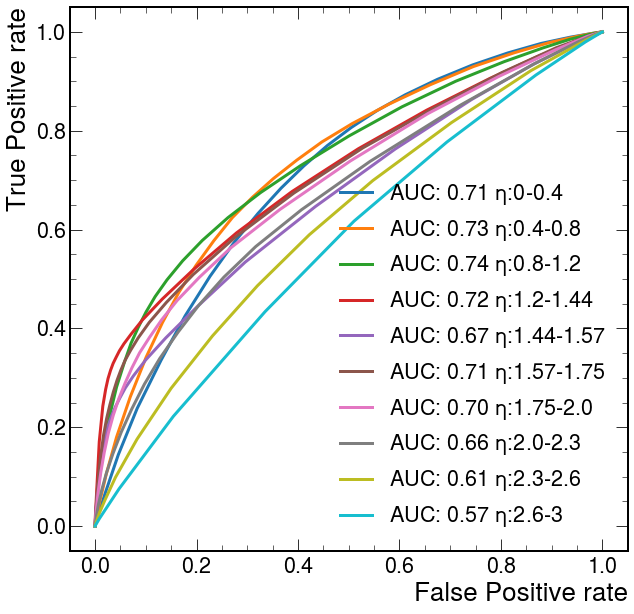

In [29]:
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]

for iet in range(len(etas)-1):
    fpr_nomat, tpr_nomat = get_roc(df_tot[(abs(df_tot.seed_eta) >= etas[iet]) &(abs(df_tot.seed_eta) < etas[iet+1])], 22, "w_gamma")
    plt.plot(fpr_nomat, tpr_nomat, label="AUC: {:.2f} $\eta$:{}-{}".format(auc(fpr_nomat, tpr_nomat), etas[iet], etas[iet+1]), linewidth=3)
   
plt.xlabel("False Positive rate")
plt.ylabel("True Positive rate")
plt.legend()

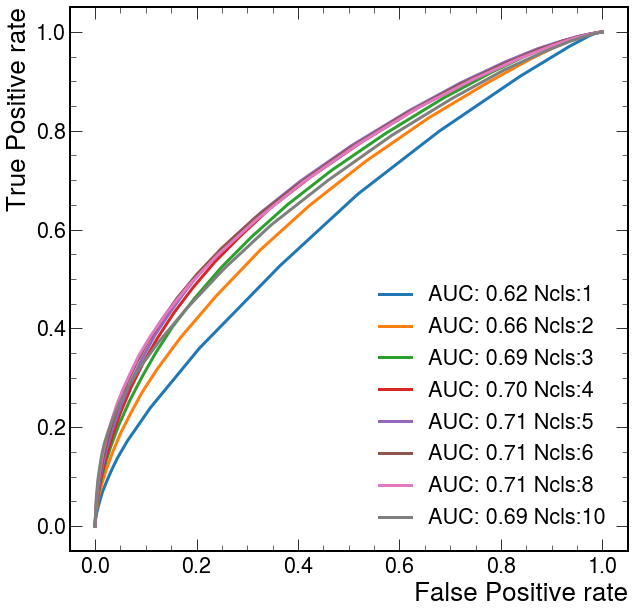

In [30]:
ncls = [1,2,3,4,5,6,8,10,15]

for iet in range(len(ncls)-1):
    fpr_nomat, tpr_nomat = get_roc(df_tot[(df_tot.ncls >= ncls[iet]) &( df_tot.ncls < ncls[iet+1])], 22, "w_gamma")
    plt.plot(fpr_nomat, tpr_nomat, label="AUC: {:.2f} Ncls:{}".format(auc(fpr_nomat, tpr_nomat),ncls[iet]), linewidth=3)
   
plt.xlabel("False Positive rate")
plt.ylabel("True Positive rate")
plt.legend()

# Precision/recall

In [14]:
ets = [0,5,10,15, 20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.479, 1.75,2.,2.3,2.6,3]
ncls = [1,2,3,5,10,12,15,17,20,25,30]
nvtx = [20,30,35,40,45,50,55,60,65,70,75,80,90,100,130]

df["eta_bin"] = pd.cut(abs(df.seed_eta), etas, labels=list(range(len(etas)-1)))
df["et_bin"] = pd.cut(df.et_seed, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))
df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))

(exptext: Custom Text(0.001, 1, 'CMS'),
 expsuffix: Custom Text(0.001, 1.005, 'Preliminary '))

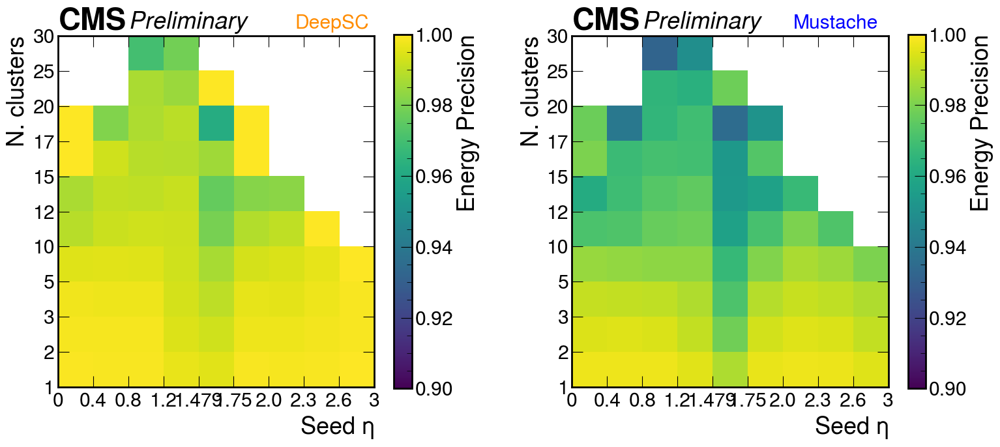

In [15]:
res_dsc =  df.groupby(["eta_bin", "ncls_bin"])\
             .apply( lambda gr:  (gr.Et_sel_true/ gr.Et_sel).mean())\
             .unstack(fill_value=0).stack()

res_mst =  df.groupby(["eta_bin", "ncls_bin"])\
             .apply( lambda gr:  (gr.Et_sel_must_true / gr.Et_sel_must).mean())\
             .unstack(fill_value=0).stack()

vmin=0.9

fig, (ax, ab) = plt.subplots(1,2, figsize=(18,8),dpi=100)
plt.subplots_adjust( wspace=0.3)

a1 = res_dsc.values.reshape((len(etas)-1,len(ncls)-1))
a1[a1==0] = np.nan
a2 = res_mst.values.reshape((len(etas)-1,len(ncls)-1))
a2[a2==0] = np.nan

A = ax.imshow(a1.T, vmin=vmin, vmax=1)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("N. clusters")
fig.colorbar(A , label="Energy Precision", ax=ax, shrink=0.9)

ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(etas)

B = ab.imshow(a2.T, vmin=vmin, vmax=1)
ab.set_xlabel("Seed $\eta$")
ab.set_ylabel("N. clusters")
plt.colorbar(B , label="Energy Precision", ax=ab, shrink=0.9)


ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ab.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ab.set_yticklabels(ncls)
ab.set_xticklabels(etas)

ax.text(0.75, 1.02, "DeepSC", transform=ax.transAxes, color='darkorange', fontsize="small", fontweight='roman')
ab.text(0.7, 1.02, "Mustache", transform=ab.transAxes, color='blue', fontsize="small", fontweight='roman')

ax.minorticks_off()
ab.minorticks_off()

hep.cms.text("Preliminary ",loc=0, ax=ax)
hep.cms.text("Preliminary ",loc=0, ax=ab)

(exptext: Custom Text(0.001, 1, 'CMS'),
 expsuffix: Custom Text(0.001, 1.005, 'Preliminary '))

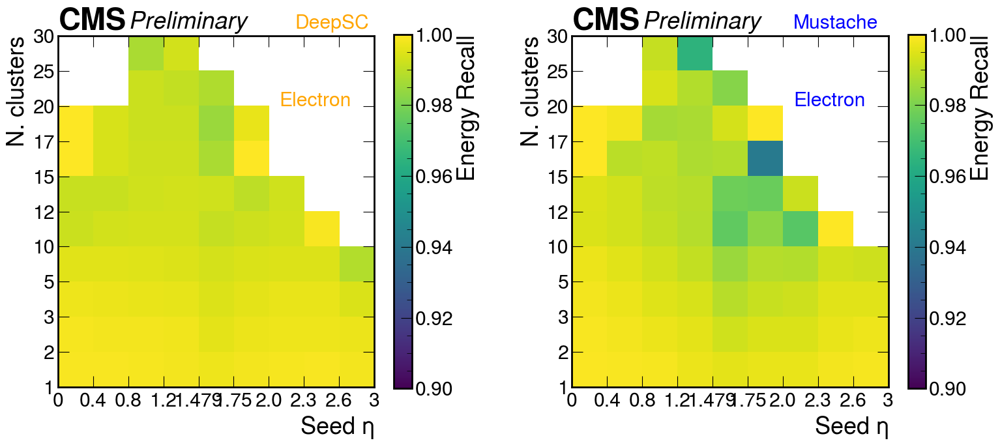

In [16]:
res_dsc =  df.groupby(["eta_bin", "ncls_bin"])\
             .apply( lambda gr:  (gr.Et_sel_true/ gr.Et_true).mean())\
             .unstack(fill_value=0).stack()

res_mst =  df.groupby(["eta_bin", "ncls_bin"])\
             .apply( lambda gr:  (gr.Et_sel_must_true / gr.Et_true).mean())\
             .unstack(fill_value=0).stack()

vmin = min(min(res_dsc), min(res_mst))
vmin =0.9

fig, (ax, ab) = plt.subplots(1,2, figsize=(18,8),dpi=100)
plt.subplots_adjust( wspace=0.3)

a1 = res_dsc.values.reshape((len(etas)-1,len(ncls)-1))
a1[a1==0] = np.nan
a2 = res_mst.values.reshape((len(etas)-1,len(ncls)-1))
a2[a2==0] = np.nan

A = ax.imshow(a1.T, vmin=vmin, vmax=1)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("N. clusters")
fig.colorbar(A , label="Energy Recall", ax=ax, shrink=0.9)

ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(etas)

B = ab.imshow(a2.T, vmin=vmin, vmax=1)
ab.set_xlabel("Seed $\eta$")
ab.set_ylabel("N. clusters")
plt.colorbar(B , label="Energy Recall", ax=ab, shrink=0.9)


ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ab.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ab.set_yticklabels(ncls)
ab.set_xticklabels(etas)

ax.text(0.75, 1.02, "DeepSC", transform=ax.transAxes, color='orange', fontsize="small", fontweight='roman')
ab.text(0.7, 1.02, "Mustache", transform=ab.transAxes, color='blue', fontsize="small", fontweight='roman')
ax.text(0.7, 0.8,  flavour, transform=ax.transAxes, color='orange', fontsize="small", )
ab.text(0.7, 0.8, flavour, transform=ab.transAxes, color='blue', fontsize="small")

ax.minorticks_off()
ab.minorticks_off()

hep.cms.text("Preliminary ",loc=0, ax=ax)
hep.cms.text("Preliminary ",loc=0, ax=ab)

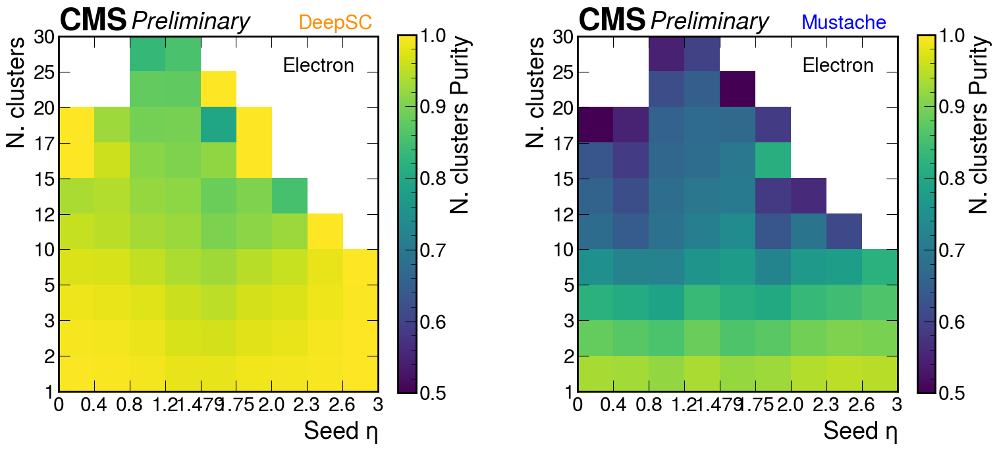

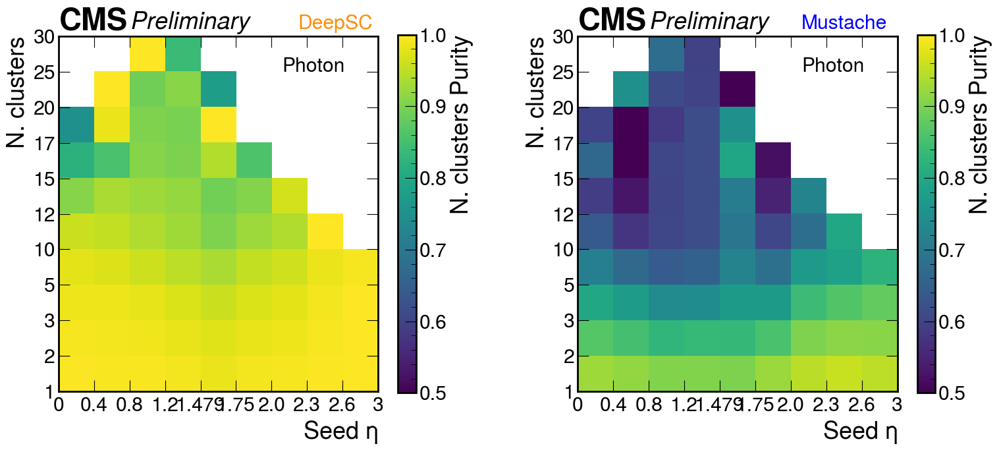

In [17]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    
    ets = [0,5,10,15, 20,40,60,80,100]
    etas = [0, 0.4,0.8, 1.2,1.479, 1.75,2.,2.3,2.6,3]
    ncls = [1,2,3,5,10,12,15,17,20,25,30]
    nvtx = [20,30,35,40,45,50,55,60,65,70,75,80,90,100,130]

    df["eta_bin"] = pd.cut(abs(df.seed_eta), etas, labels=list(range(len(etas)-1)))
    df["et_bin"] = pd.cut(df.et_seed, ets, labels=list(range(len(ets)-1)))
    df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))
    df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))


    res_dsc =  df.groupby(["eta_bin", "ncls_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_true/ gr.ncls_sel).mean())\
                 .unstack(fill_value=0).stack()

    res_mst =  df.groupby(["eta_bin", "ncls_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_must_true / gr.ncls_sel_must).mean())\
                 .unstack(fill_value=0).stack()

    vmin=0.5

    fig, (ax, ab) = plt.subplots(1,2, figsize=(18,8),dpi=100)
    plt.subplots_adjust( wspace=0.3)

    a1 = res_dsc.values.reshape((len(etas)-1,len(ncls)-1))
    a1[a1==0] = np.nan
    a2 = res_mst.values.reshape((len(etas)-1,len(ncls)-1))
    a2[a2==0] = np.nan

    A = ax.imshow(a1.T, vmin=vmin, vmax=1)
    ax.set_xlabel("Seed $\eta$")
    ax.set_ylabel("N. clusters")
    fig.colorbar(A , label="N. clusters Purity", ax=ax, shrink=0.9)

    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ax.set_yticklabels(ncls)
    ax.set_xticklabels(etas)

    B = ab.imshow(a2.T, vmin=vmin, vmax=1)
    ab.set_xlabel("Seed $\eta$")
    ab.set_ylabel("N. clusters")
    plt.colorbar(B , label="N. clusters Purity", ax=ab, shrink=0.9)


    ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ab.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ab.set_yticklabels(ncls)
    ab.set_xticklabels(etas)

    ax.text(0.75, 1.02, "DeepSC", transform=ax.transAxes, color='darkorange', fontsize="small", fontweight='roman')
    ab.text(0.7, 1.02, "Mustache", transform=ab.transAxes, color='blue', fontsize="small", fontweight='roman')
    ax.text(0.7, 0.9,  flavour, transform=ax.transAxes, fontsize="small", )
    ab.text(0.7, 0.9, flavour, transform=ab.transAxes, fontsize="small")

    ax.minorticks_off()
    ab.minorticks_off()

    hep.cms.text("Preliminary ",loc=0, ax=ax)
    hep.cms.text("Preliminary ",loc=0, ax=ab)

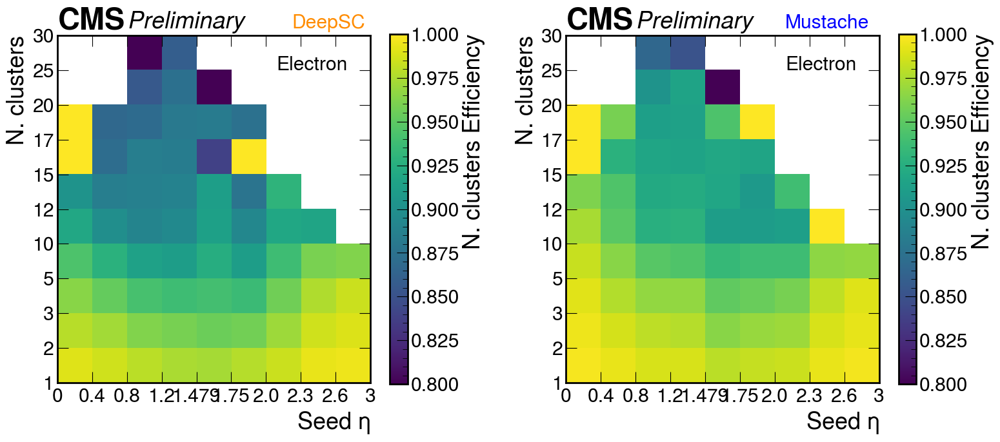

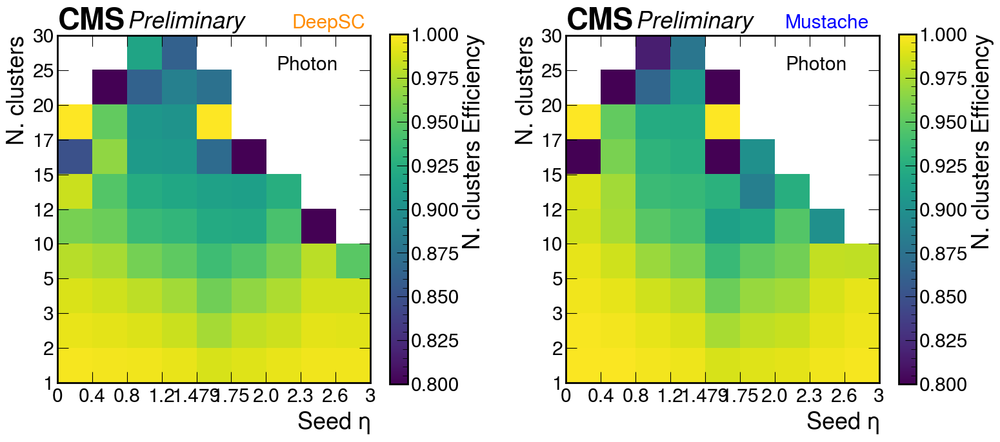

In [18]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    
    ets = [0,5,10,15, 20,40,60,80,100]
    etas = [0, 0.4,0.8, 1.2,1.479, 1.75,2.,2.3,2.6,3]
    ncls = [1,2,3,5,10,12,15,17,20,25,30]
    nvtx = [20,30,35,40,45,50,55,60,65,70,75,80,90,100,130]

    df["eta_bin"] = pd.cut(abs(df.seed_eta), etas, labels=list(range(len(etas)-1)))
    df["et_bin"] = pd.cut(df.et_seed, ets, labels=list(range(len(ets)-1)))
    df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))
    df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))


    res_dsc =  df.groupby(["eta_bin", "ncls_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_true/ gr.ncls_true).mean())\
                 .unstack(fill_value=0).stack()

    res_mst =  df.groupby(["eta_bin", "ncls_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_must_true / gr.ncls_true).mean())\
                 .unstack(fill_value=0).stack()

    vmin=0.8

    fig, (ax, ab) = plt.subplots(1,2, figsize=(18,8),dpi=100)
    plt.subplots_adjust( wspace=0.3)

    a1 = res_dsc.values.reshape((len(etas)-1,len(ncls)-1))
    a1[a1==0] = np.nan
    a2 = res_mst.values.reshape((len(etas)-1,len(ncls)-1))
    a2[a2==0] = np.nan

    A = ax.imshow(a1.T, vmin=vmin, vmax=1)
    ax.set_xlabel("Seed $\eta$")
    ax.set_ylabel("N. clusters")
    fig.colorbar(A , label="N. clusters Efficiency", ax=ax, shrink=0.9)

    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ax.set_yticklabels(ncls)
    ax.set_xticklabels(etas)

    B = ab.imshow(a2.T, vmin=vmin, vmax=1)
    ab.set_xlabel("Seed $\eta$")
    ab.set_ylabel("N. clusters")
    plt.colorbar(B , label="N. clusters Efficiency", ax=ab, shrink=0.9)


    ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ab.set_xticks(np.arange(len(etas))- 0.5, minor=False)
    ab.set_yticklabels(ncls)
    ab.set_xticklabels(etas)

    ax.text(0.75, 1.02, "DeepSC", transform=ax.transAxes, color='darkorange', fontsize="small", fontweight='roman')
    ab.text(0.7, 1.02, "Mustache", transform=ab.transAxes, color='blue', fontsize="small", fontweight='roman')
    ax.text(0.7, 0.9,  flavour, transform=ax.transAxes, fontsize="small", )
    ab.text(0.7, 0.9, flavour, transform=ab.transAxes, fontsize="small")

    ax.minorticks_off()
    ab.minorticks_off()

    hep.cms.text("Preliminary ",loc=0, ax=ax)
    hep.cms.text("Preliminary ",loc=0, ax=ab)

# Energy regression

Text(1, 0, 'En. calibration factor')

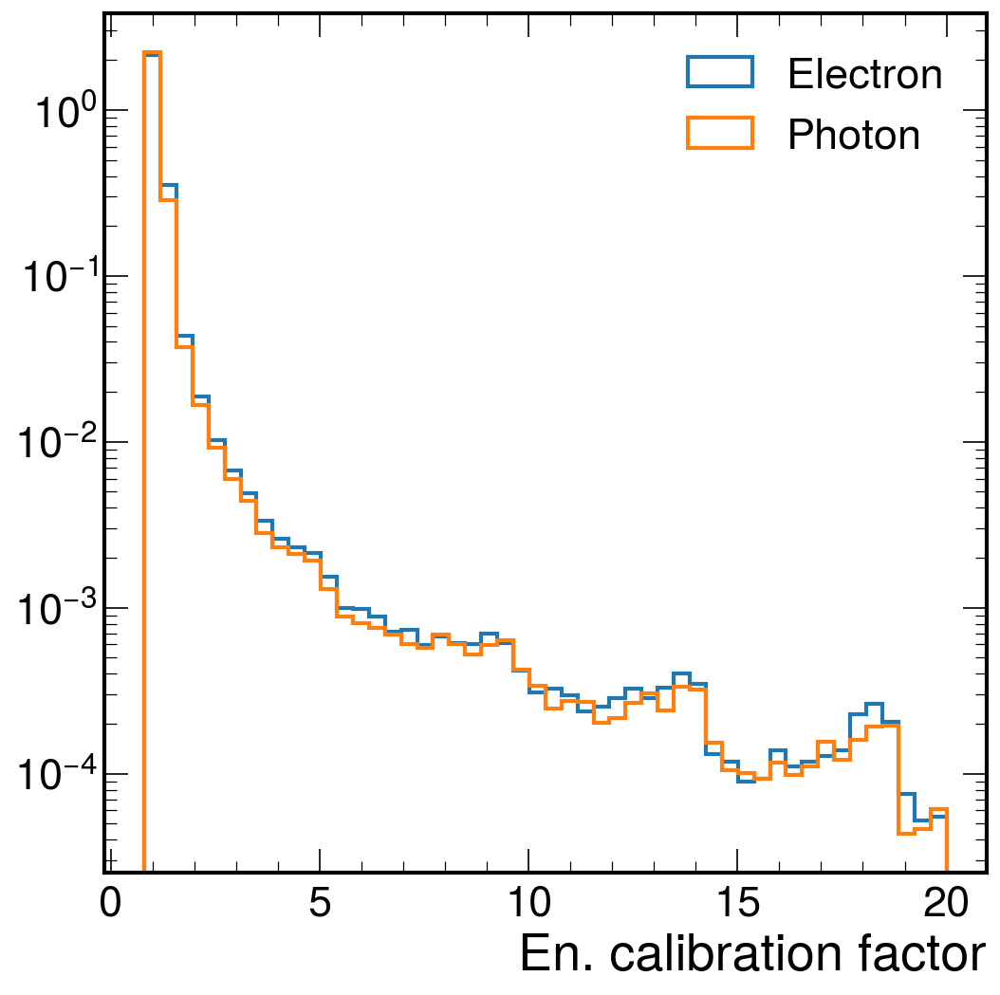

In [32]:
fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=150)

plt.hist(df_ele.en_regr_factor, bins=50, range=(0.8,20), histtype="step", linewidth=2, density=True, label="Electron")
plt.hist(df_gamma.en_regr_factor, bins=50, range=(0.8,20), histtype="step", linewidth=2, density=True, label="Photon")
plt.yscale("log")
plt.legend()
plt.xlabel("En. calibration factor")
# plt.ylim(1e-3,1e2)

<ipython-input-33-8dfe9962e7c0>:6: RuntimeWarning: invalid value encountered in true_divide
  m1 = A[0]/A_count[0]


Text(1, 0, 'ieta')

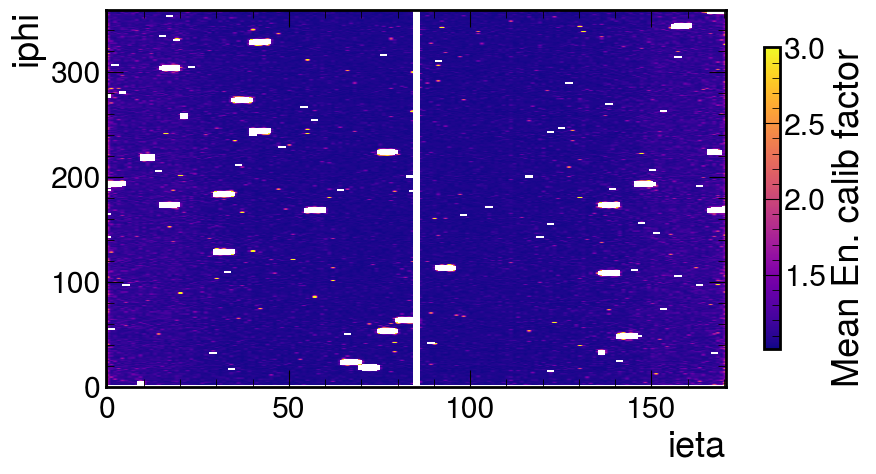

In [33]:
f, ax, = plt.subplots(1,1, figsize=(10,5), dpi=100)

df = df_ele
A = np.histogram2d(df[df.seed_iz==0].seed_ieta, df[df.seed_iz==0].seed_iphi, weights=df[df.seed_iz==0].en_regr_factor , range=((-85,85),(0,360)), bins=(171,360))
A_count = np.histogram2d(df[df.seed_iz==0].seed_ieta, df[df.seed_iz==0].seed_iphi, range=((-85,85),(0,360)), bins=(171,360))
m1 = A[0]/A_count[0]
I1 = ax.imshow(m1.T, cmap="plasma", origin="lower", aspect="auto", vmax=3)
f.colorbar(I1, label="Mean En. calib factor", ax=ax, shrink=0.8)

ax.set_ylabel("iphi")
ax.set_xlabel("ieta")

<ipython-input-34-add111ddc373>:5: RuntimeWarning: invalid value encountered in true_divide
  m1 = A[0]/A_count[0]
<ipython-input-34-add111ddc373>:11: RuntimeWarning: invalid value encountered in true_divide
  m2 = A2[0]/A2_count[0]


Text(1, 0, 'iphi')

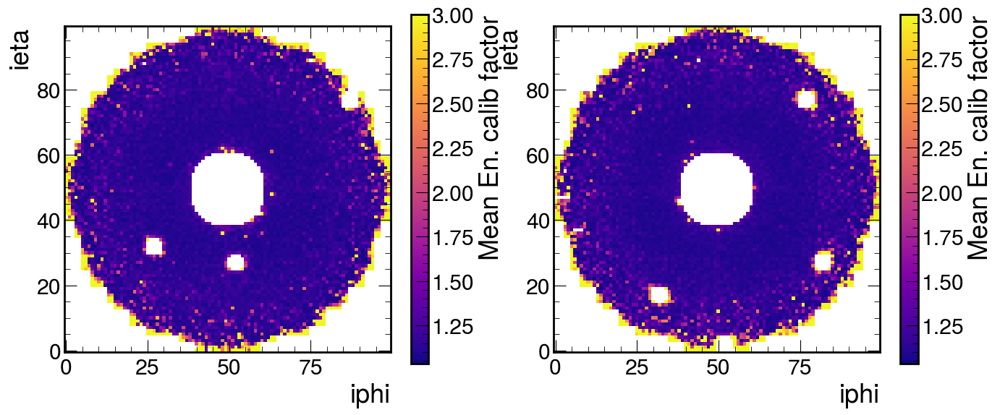

In [34]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

A = np.histogram2d(df_gamma[df_gamma.seed_iz==-1].seed_iphi, df_gamma[df_gamma.seed_iz==-1].seed_ieta, weights=df_gamma[df_gamma.seed_iz==-1].en_regr_factor ,range=((1,100),(1,100)), bins=(100,100) )
A_count = np.histogram2d(df_gamma[df_gamma.seed_iz==-1].seed_iphi,df_gamma[df_gamma.seed_iz==-1].seed_ieta, range=((1,100),(1,100)), bins=(100,100))
m1 = A[0]/A_count[0]
I1 = ax[0].imshow(m1, cmap="plasma", vmax=3)
f.colorbar(I1, label="Mean En. calib factor", ax=ax[0], shrink=0.8)

A2 = np.histogram2d(df_gamma[df_gamma.seed_iz==1].seed_iphi,df_gamma[df_gamma.seed_iz==1].seed_ieta, weights=df_gamma[df_gamma.seed_iz==1].en_regr_factor,range=((1,100),(1,100)), bins=(100,100))
A2_count = np.histogram2d(df_gamma[df_gamma.seed_iz==1].seed_iphi,df_gamma[df_gamma.seed_iz==1].seed_ieta, range=((1,100),(1,100)), bins=(100,100))
m2 = A2[0]/A2_count[0]

I2 = ax[1].imshow(m2, cmap="plasma", vmax=3)
f.colorbar(I2, label="Mean En. calib factor", ax=ax[1], shrink=0.8)

ax[0].set_ylabel("ieta")
ax[0].set_xlabel("iphi")
ax[1].set_ylabel("ieta")
ax[1].set_xlabel("iphi")

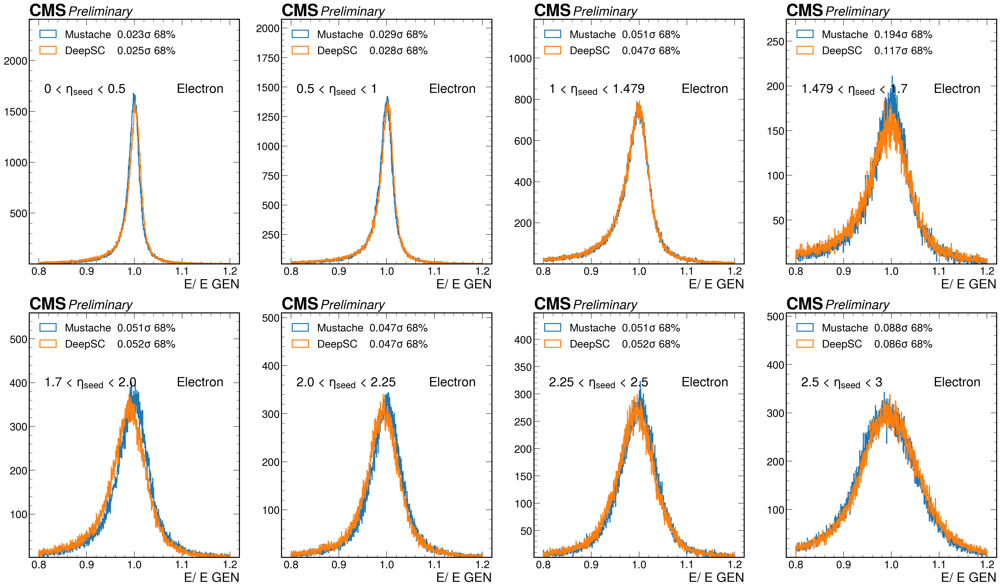

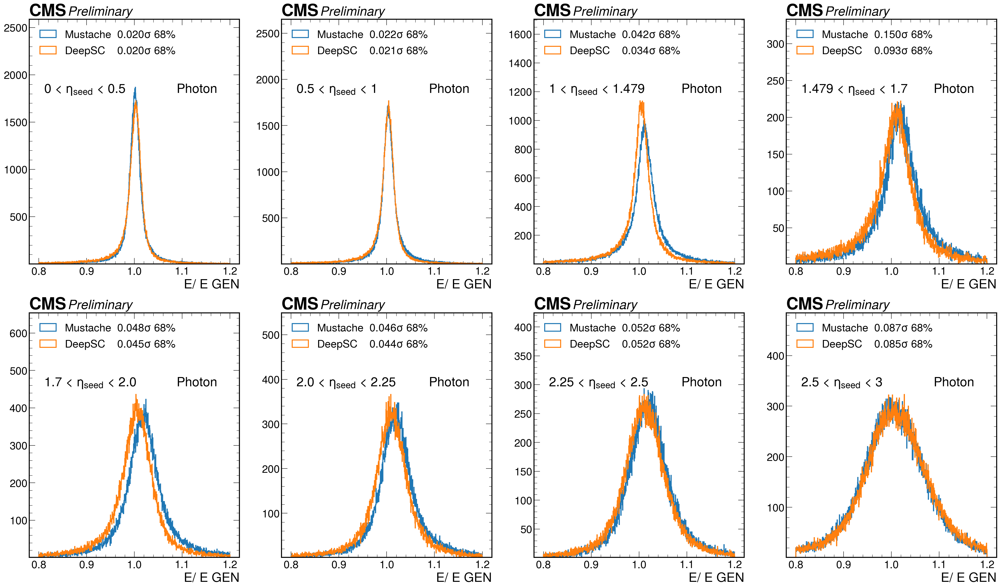

In [35]:
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(2,4, figsize=(35,20),dpi=150)

    xrange = (0.8, 1.2)
    bins= 1000
    CL = 0.4


    r = [0, 0.5,1, 1.479, 1.7, 2.0, 2.25, 2.5, 3]
    s = [[], []]
    for i in range(len(r)-1):
        line = i //4 
        s[line].append((r[i],r[i+1]))

    for j,ss in enumerate(s): 
        for i, (e1,e2) in enumerate(ss): 
            dfx = df[(abs(df.seed_eta)>=e1) & (abs(df.seed_eta)<e2)]

            width, width_2 = get_sigma_eff(dfx.En_ovEtrue_gen_calib)
            width_must, width_2_must = get_sigma_eff(dfx.En_ovEtrue_gen_calib_mustache)
    #         rms_regr = dfx.En_ovEtrue_gen_corr.std()

            ax[j,i].hist(dfx.En_ovEtrue_gen_calib_mustache,bins=bins, range=xrange,histtype='step', linewidth=2, label='Mustache  {:.3f}$\sigma$ 68%'.format(width_must, CL))
            A= ax[j,i].hist(dfx.En_ovEtrue_gen_calib,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC    {:.3f}$\sigma$ 68%'.format(width, CL))
    #         ax[j,i].hist(dfx.En_ovEtrue_gen_corr,bins=bins, range=xrange,histtype='step', linewidth=2, label='DeepSC +regre    RMS: {:.4f}'.format(rms_regr))
            maxY = np.max(A[0])
            ax[j,i].legend(loc="upper left")
    #         ax[j,i].set_yscale('log')
            ax[j,i].set_ylim(1, 1.5 * maxY)
            ax[j,i].set_xlabel("E/ E GEN")
            ax[j,i].text(0.07,0.7,  str(e1) + ' < $\eta_{seed}$ < ' + str(e2), transform = ax[j,i].transAxes)  
            ax[j,i].text(0.7, 0.7, flavour, transform=ax[j,i].transAxes)

            hep.cms.text("Preliminary ",loc=0, ax=ax[j,i])


(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

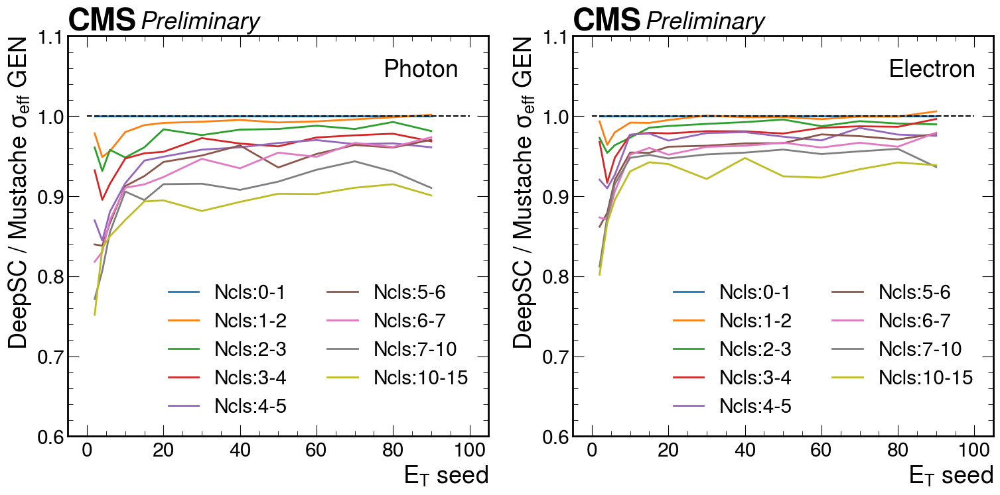

In [45]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour ="Photon"
ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ncls[:-1]):
    ax.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2,4,6,10,15,20,30,40,50,60,70,80,90,100]
ncls = [0,1,2,3,4,5,6,7,10,15]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["ncls_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))


res = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_must = df.groupby(["et_bin","ncls_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ncls[:-1]):
    ay.plot(ets[:-1], res[res.ncls_bin == ieta].w68/res_must[res_must.ncls_bin == ieta].w68, label="Ncls:{}-{}".format(ncls[ieta], ncls[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

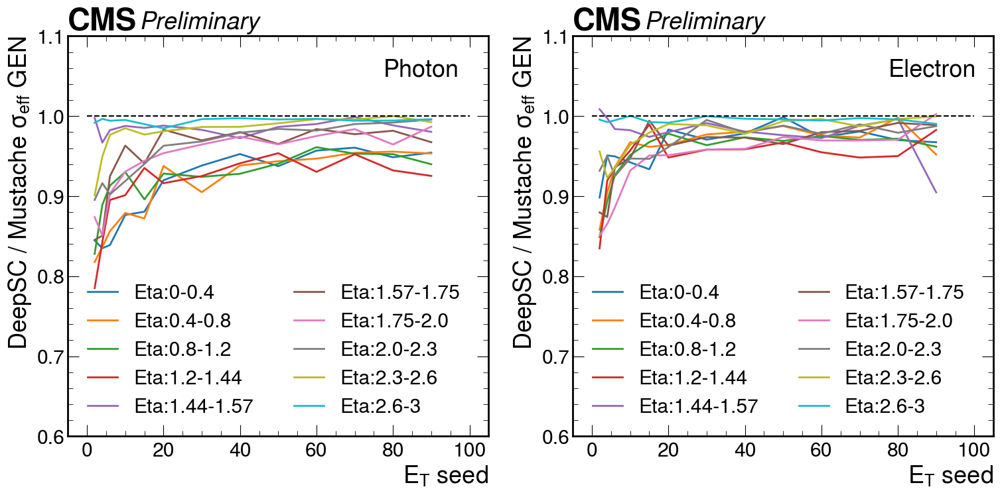

In [46]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

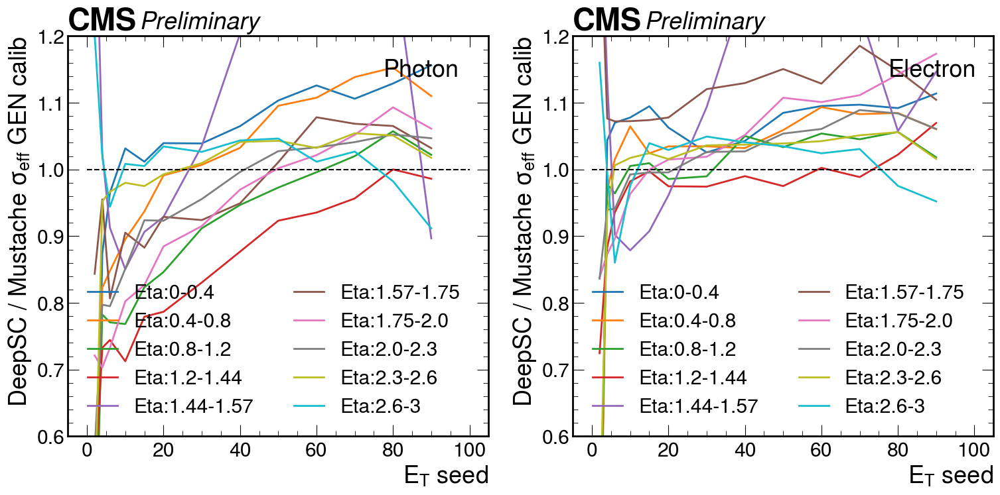

In [36]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.2)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN calib")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.2)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ GEN calib")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

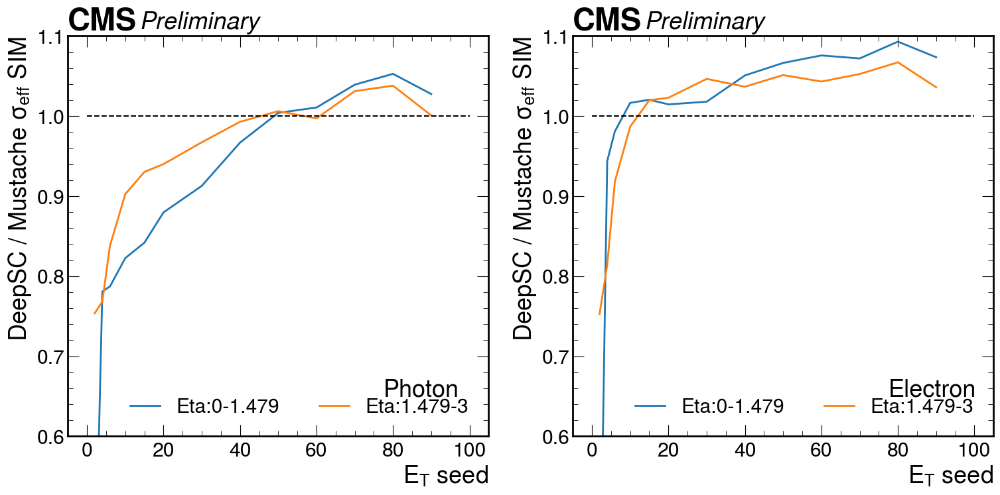

In [38]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 1.479, 3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(etas[:-1]):
    ax.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ax.set_ylim(0.6, 1.1)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2)
ax.set_xlabel("$E_T$ seed")
ax.plot([0,100],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.1, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 1.479, 3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(etas[:-1]):
    ay.plot(ets[:-1], res[res.eta_bin == ieta].w68/res_must[res_must.eta_bin == ieta].w68, label="Eta:{}-{}".format(etas[ieta], etas[ieta+1]), linewidth=2)
ay.set_ylim(0.6, 1.1)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2)
ay.set_xlabel("$E_T$ seed")
ay.plot([0,100],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.1, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

(exptext: Custom Text(0.0, 1, 'CMS'),
 expsuffix: Custom Text(0.0, 1.005, 'Preliminary'))

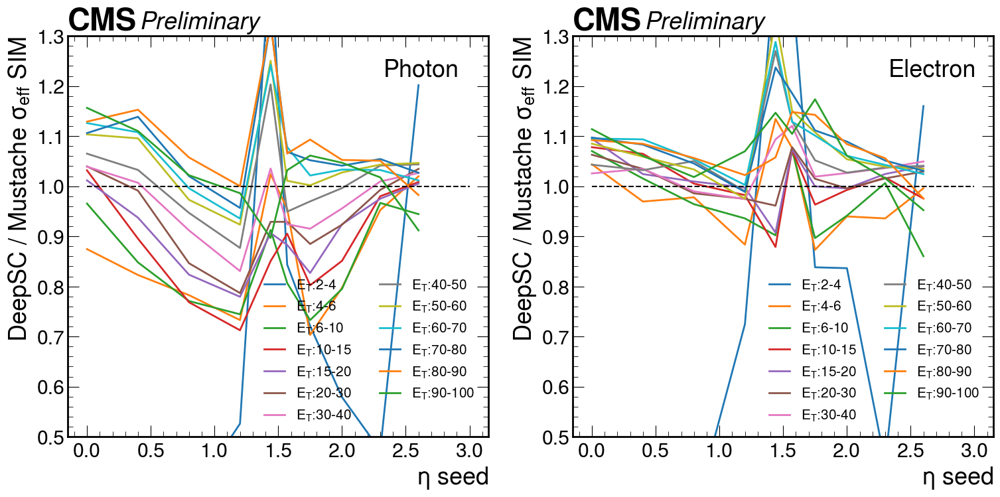

In [42]:
fig, (ax, ay) = plt.subplots(1,2, figsize=(18,8),dpi=100, )

df = df_gamma
flavour = "Photon"
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


# gs = fig.add_gridspec(2, hspace=0.1, height_ratios=[0.8,0.2])
# axs = gs.subplots(sharex=True)

for ieta, eta in enumerate(ets[:-1]):
    ax.plot(etas[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="$E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ax.set_ylim(0.5, 1.3)
ax.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ax.legend(ncol=2, fontsize="xx-small")
ax.set_xlabel("$\eta$ seed")
ax.plot([0,3],[1,1], linestyle="dashed", color="black")

ax.text(0.75, 0.9, flavour, transform=ax.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ax)



df = df_ele
flavour = "Electron"

ets = [2, 4,6,10,15,20,30,40,50,60,70,80,90,100]
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df["et_bin"] = pd.cut(df.et, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.eta, etas, labels=list(range(len(etas)-1)))


res = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib"))
res_must = df.groupby(["et_bin","eta_bin"]).apply(bin_analysis("En_ovEtrue_gen_calib_mustache"))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

for ieta, eta in enumerate(ets[:-1]):
    ay.plot(etas[:-1], res[res.et_bin == ieta].w68/res_must[res_must.et_bin == ieta].w68, label="$E_T$:{}-{}".format(ets[ieta], ets[ieta+1]), linewidth=2)
ay.set_ylim(0.5, 1.3)
ay.set_ylabel("DeepSC / Mustache $\sigma_{eff}$ SIM")
ay.legend(ncol=2, loc="lower right", fontsize="xx-small")
ay.set_xlabel("$\eta$ seed")
ay.plot([0,3],[1,1], linestyle="dashed", color="black")

ay.text(0.75, 0.9, flavour, transform=ay.transAxes)

hep.cms.text("Preliminary", loc=0, ax=ay)

# Number of cluster study

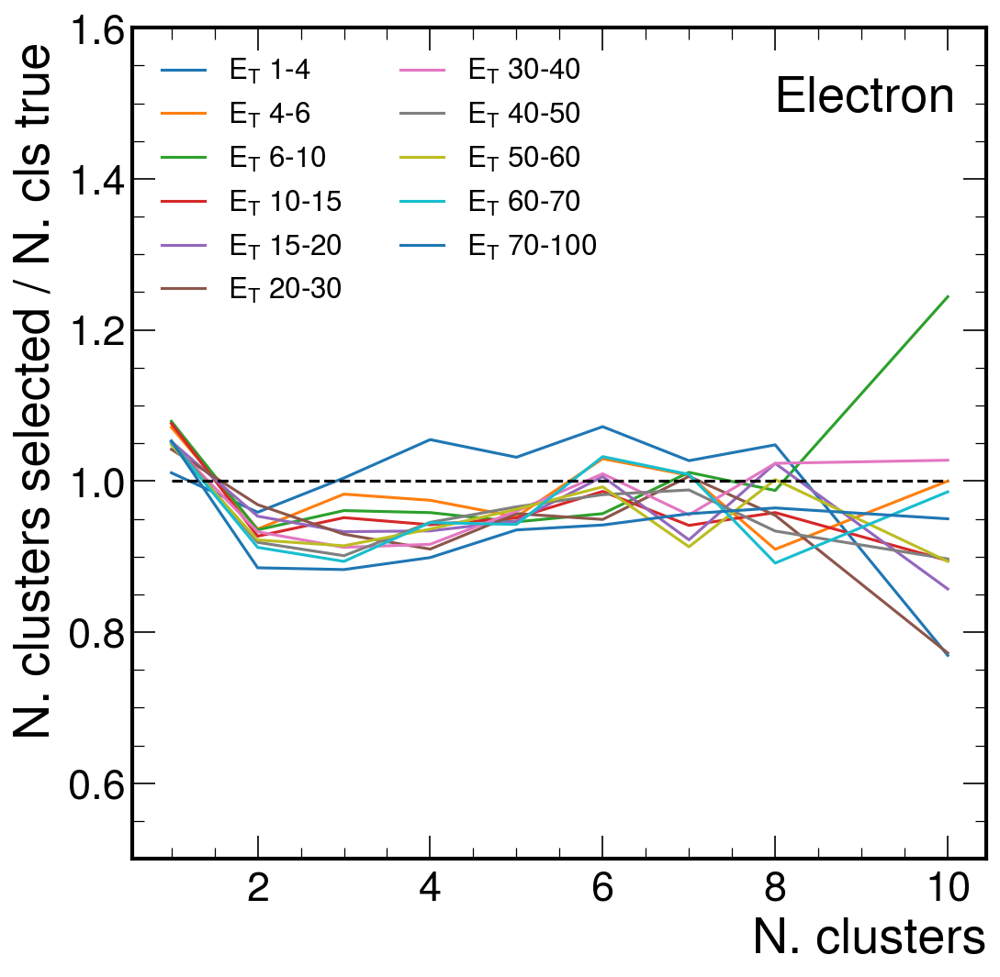

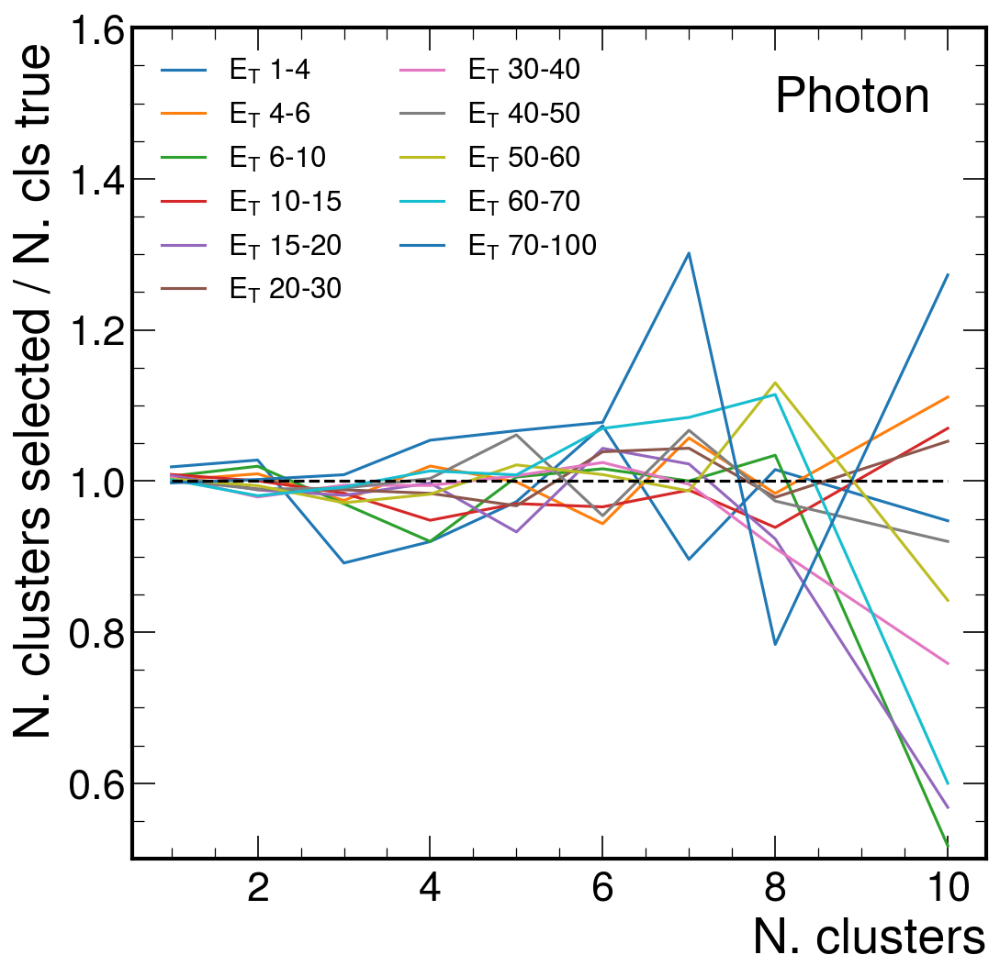

In [43]:
np.seterr(divide='ignore', invalid='ignore')

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=150)

    bins = [1,2,3,4,5,6,7,8,10,15]
    ets = [1,4,6,10,15,20,30,40,50,60,70,100]


    for iet in range(len(ets)-1):
        dfx = df[(df.et>=ets[iet]) & (df.et<ets[iet+1])]

        A = np.histogram(dfx.ncls_sel.values, bins=bins)
        B = np.histogram(dfx.ncls_true.values, bins=bins)
        ax.plot(A[1][:-1], np.divide(A[0],B[0]), label="$E_T$ {}-{}".format(ets[iet],ets[iet+1]))
        
    ax.plot()    
    ax.legend(ncol=2, loc="upper left", fontsize="xx-small")
    ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
    ax.set_ylim(0.5, 1.6)
    ax.set_ylabel("N. clusters selected / N. cls true ")
    ax.set_xlabel("N. clusters")
    ax.plot([bins[0], bins[-2]],[1,1], linestyle="dashed", color="black")


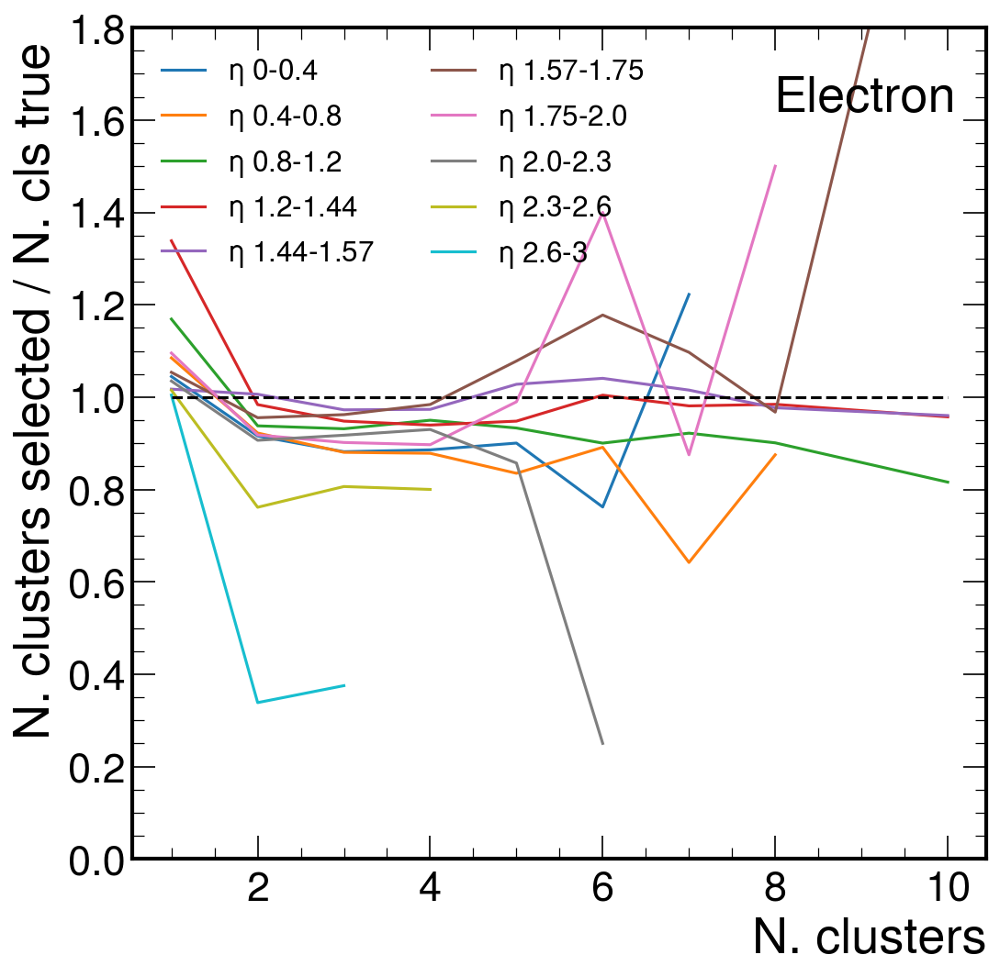

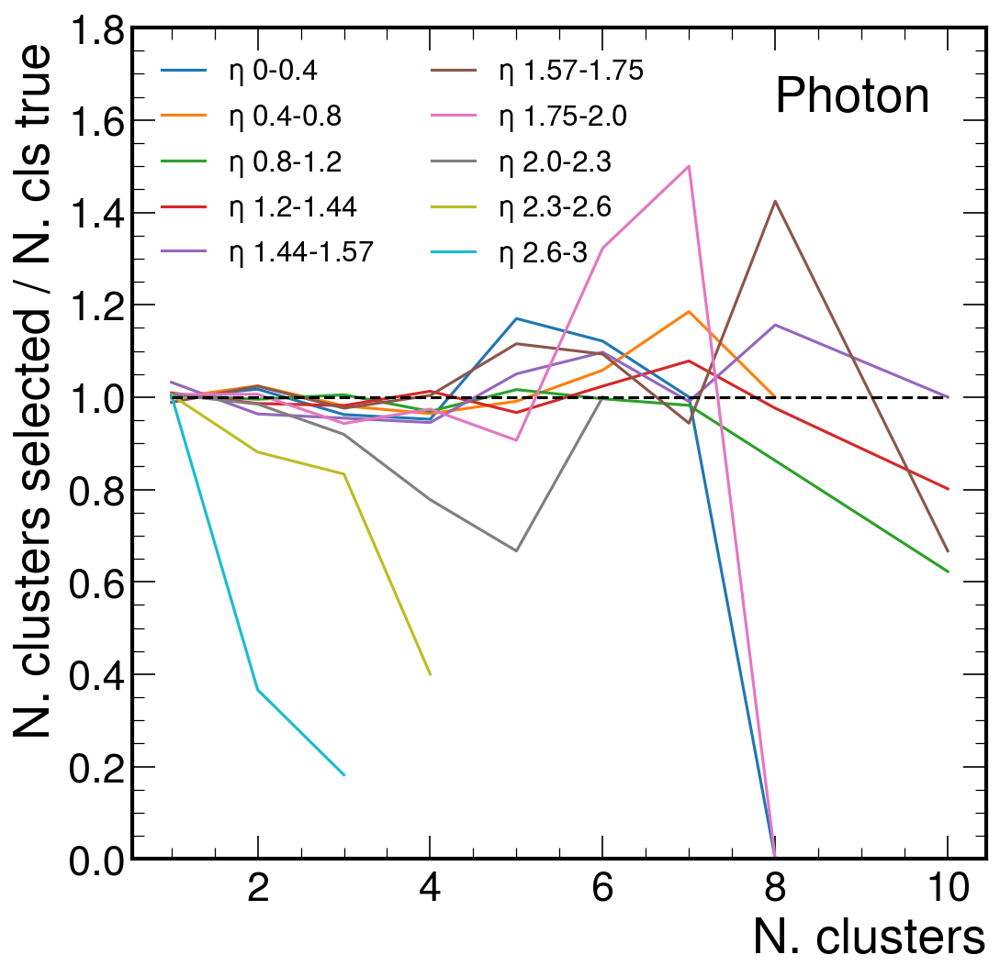

In [44]:
np.seterr(divide='ignore', invalid='ignore')

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=150)

    bins = [1,2,3,4,5,6,7,8,10,15]
    etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]


    for iet in range(len(etas)-1):
        dfx = df[(df.eta>=etas[iet]) & (df.eta<etas[iet+1])]

        A = np.histogram(dfx.ncls_sel.values, bins=bins)
        B = np.histogram(dfx.ncls_true.values, bins=bins)
        ax.plot(A[1][:-1], np.divide(A[0],B[0]), label="$\eta$ {}-{}".format(etas[iet],etas[iet+1]))
        
    ax.plot()    
    ax.legend(ncol=2, loc="upper left", fontsize="xx-small")
    ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
    ax.set_ylim(0., 1.8)
    ax.set_ylabel("N. clusters selected / N. cls true ")
    ax.set_xlabel("N. clusters")
    ax.plot([bins[0], bins[-2]],[1,1], linestyle="dashed", color="black")


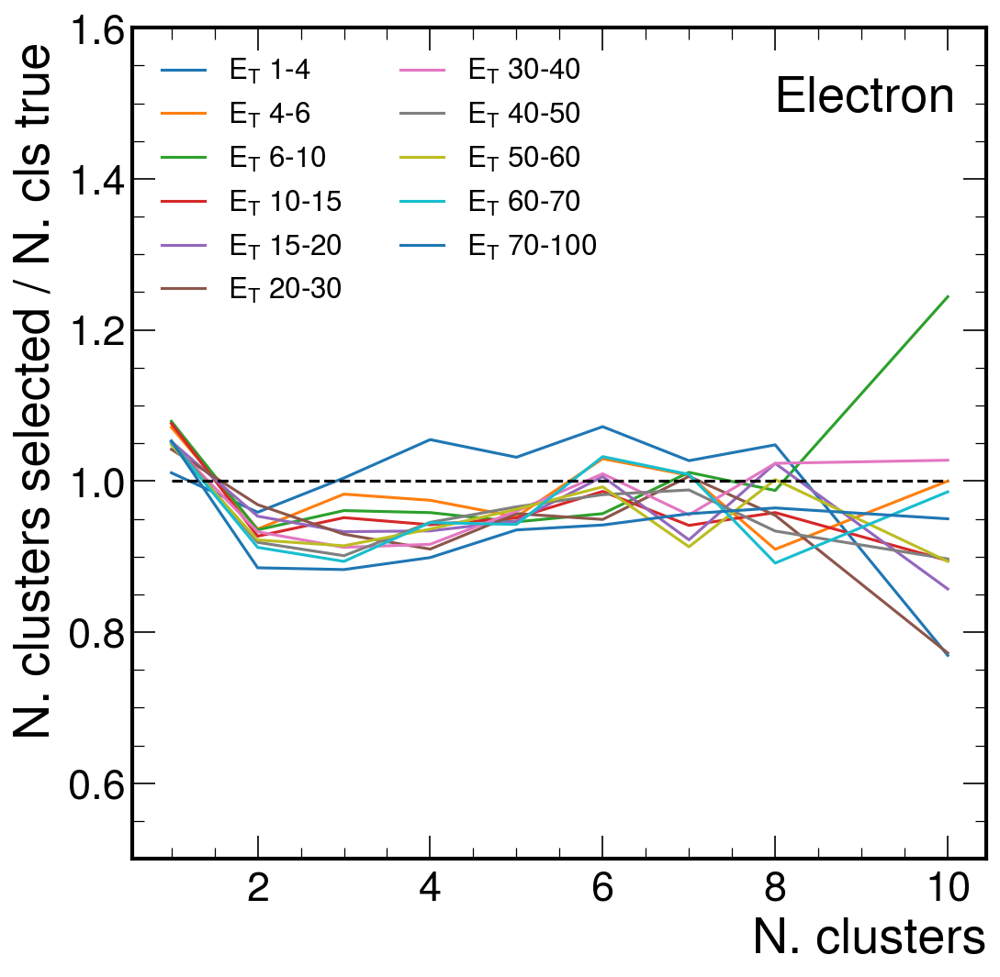

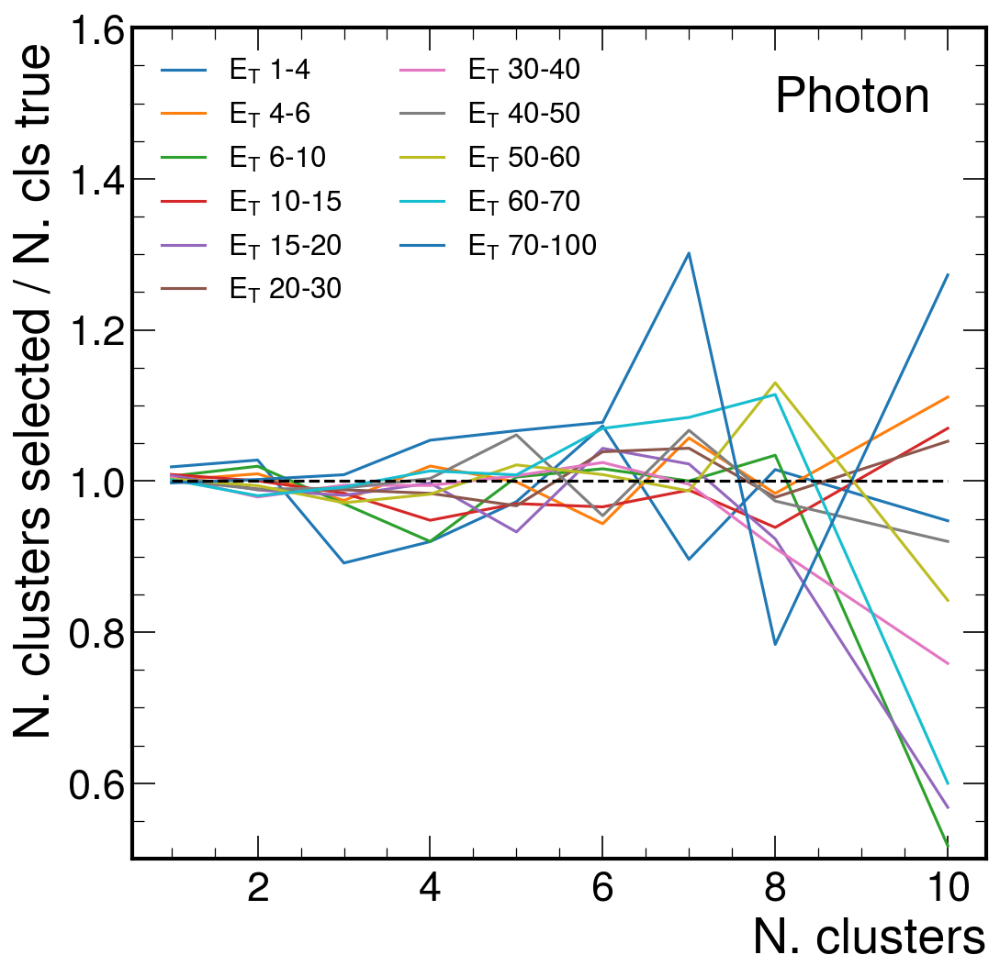

In [45]:
np.seterr(divide='ignore', invalid='ignore')

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):

    fig, ax = plt.subplots(1,1, figsize=(8,8),dpi=150)

    bins = [1,2,3,4,5,6,7,8,10,15]
    ets = [1,4,6,10,15,20,30,40,50,60,70,100]


    for iet in range(len(ets)-1):
        dfx = df[(df.et>=ets[iet]) & (df.et<ets[iet+1])]

        A = np.histogram(dfx.ncls_sel.values, bins=bins)
        B = np.histogram(dfx.ncls_true.values, bins=bins)
        ax.plot(A[1][:-1], np.divide(A[0],B[0]), label="$E_T$ {}-{}".format(ets[iet],ets[iet+1]))
        
    ax.plot()    
    ax.legend(ncol=2, loc="upper left", fontsize="xx-small")
    ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
    ax.set_ylim(0.5, 1.6)
    ax.set_ylabel("N. clusters selected / N. cls true ")
    ax.set_xlabel("N. clusters")
    ax.plot([bins[0], bins[-2]],[1,1], linestyle="dashed", color="black")


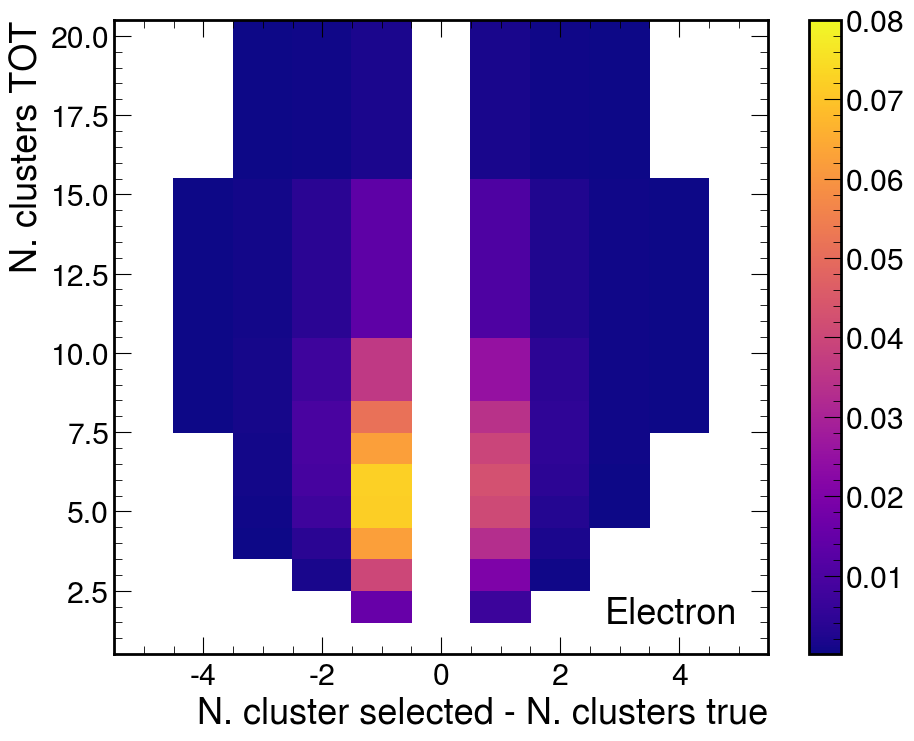

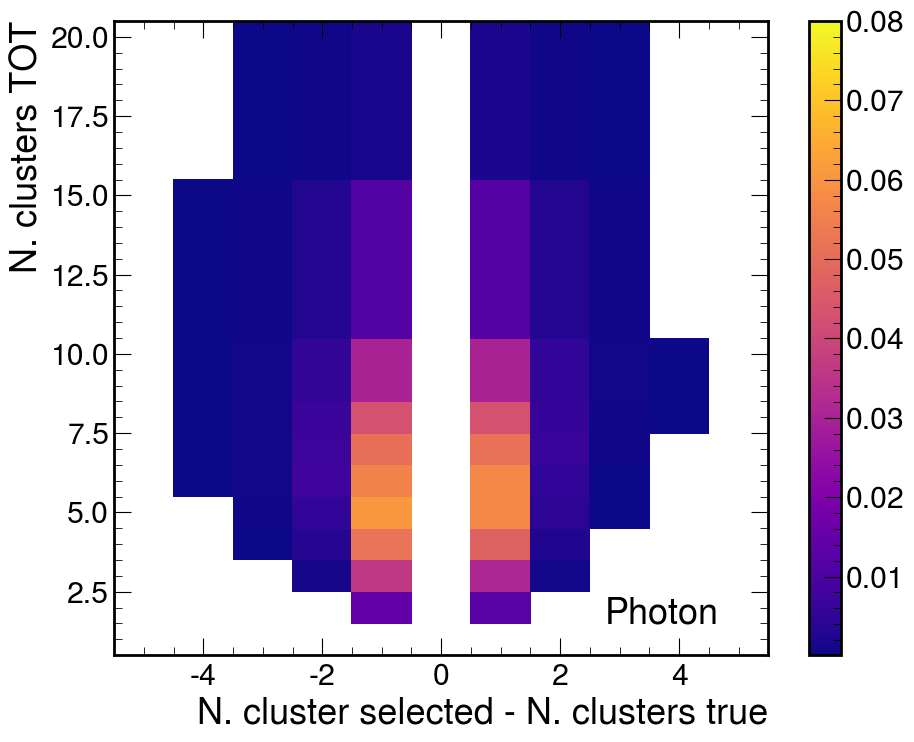

In [46]:
ncls = [0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,10.5,15.5, 20.5]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4,vmax=0.08, density=True )#
    fig.colorbar(A[3], ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("N. clusters TOT")
    ax.text(0.75, 0.05, flavour, transform=ax.transAxes)
    fig.tight_layout()
    fig.savefig(outdir+ "/Ncltot_lost_{}.png".format(flavour))
    

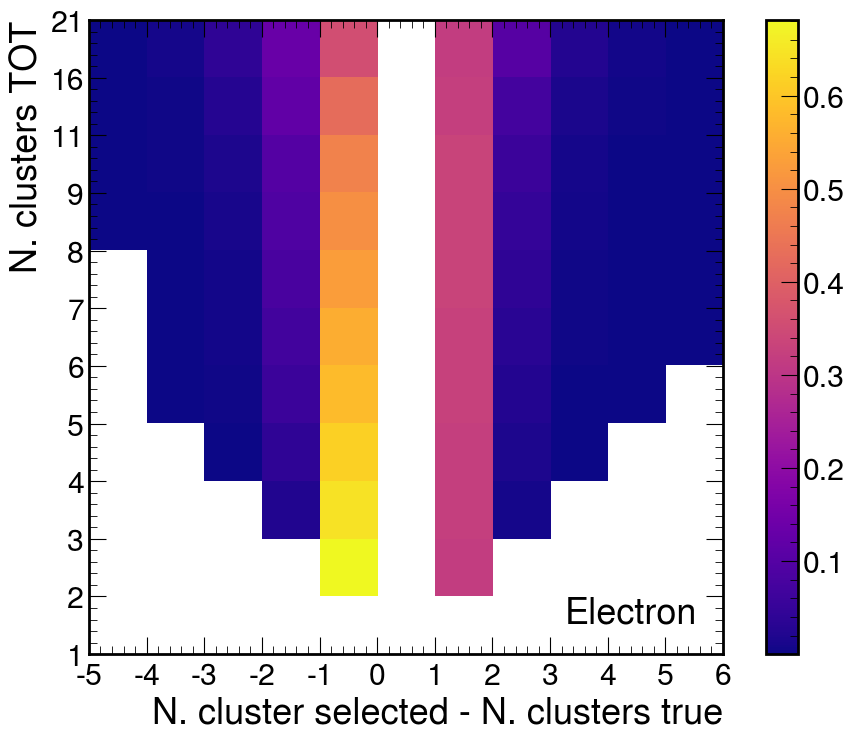

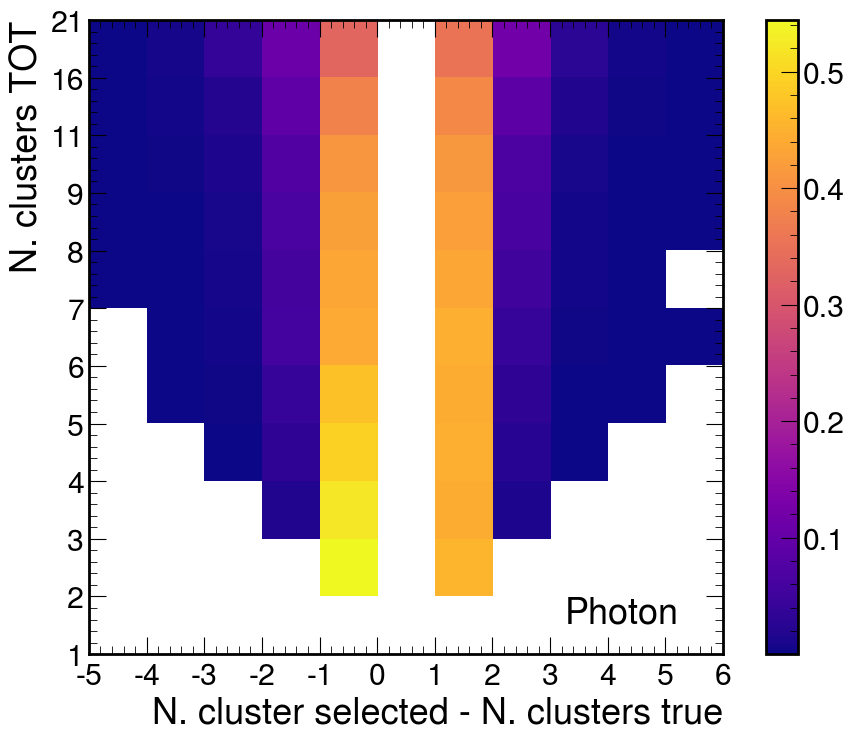

In [47]:
ncls = [0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,10.5,15.5, 20.5]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    H,x,y  = np.histogram2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls, bins=(nclsx, ncls),)#
    
    Hnorm = H.T / np.sum(H.T, axis=-1).reshape(-1,1)
    Hnorm[Hnorm ==0] = np.nan
    A = plt.imshow(Hnorm, cmap="plasma",)
    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
    ax.set_yticklabels(["{:.0f}".format(n+0.5) for n in ncls])
    ax.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
    
    fig.colorbar(A, ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("N. clusters TOT")
    ax.text(0.75, 0.05, flavour, transform=ax.transAxes)
    fig.tight_layout()
    fig.savefig(outdir+ "/Ncltot_norm_lost_{}.png".format(flavour))
    

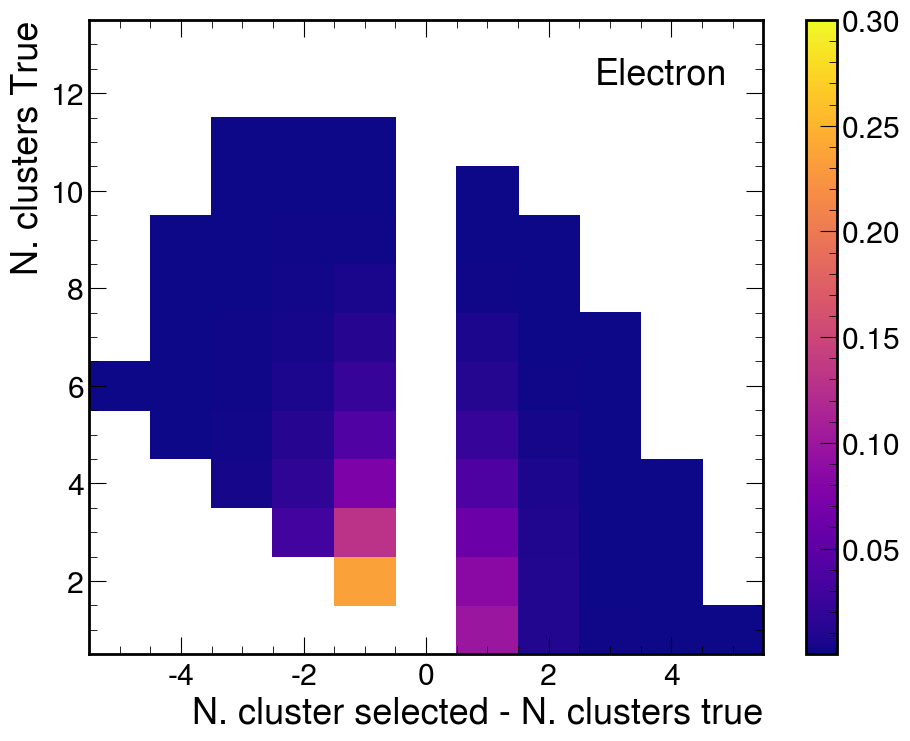

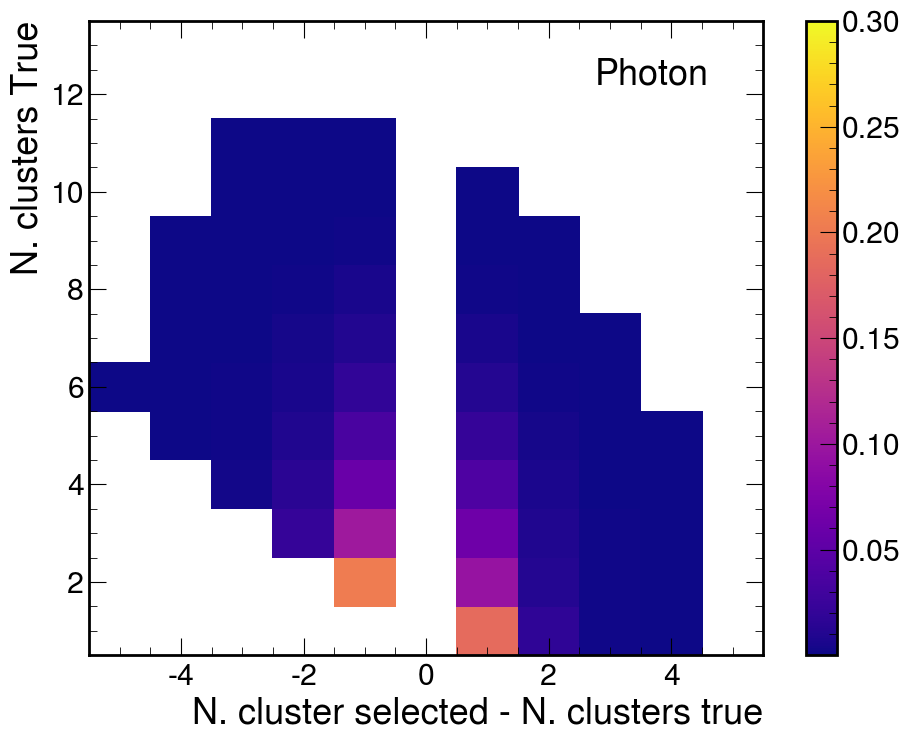

In [48]:
ncls = [0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4,vmax=0.3, density=True )#
    fig.colorbar(A[3], ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("N. clusters True")
    ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
    
    fig.tight_layout()
    fig.savefig(outdir+ "/Ncltrue_lost_{}.png".format(flavour))
    

NameError: name 'ab' is not defined

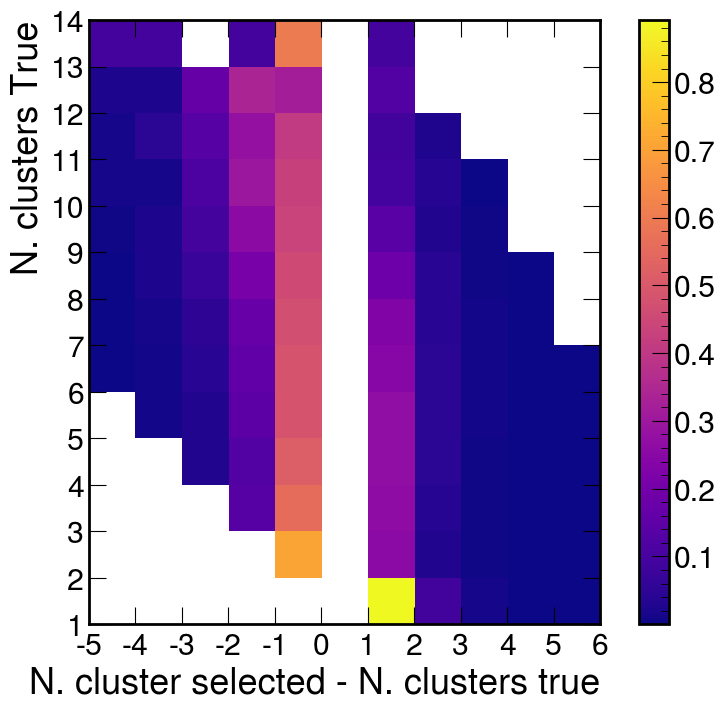

In [49]:
ncls = [0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5,12.5,13.5]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    
    H,x,y  = np.histogram2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls) )#
    Hnorm = H.T / np.sum(H.T, axis=-1).reshape(-1,1)
    Hnorm[Hnorm ==0] = np.nan
    A = plt.imshow(Hnorm, cmap="plasma",)
    fig.colorbar(A, ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("N. clusters True")
    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
    ax.set_yticklabels(["{:.0f}".format(n+0.5) for n in ncls])
    ax.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
    ax.minorticks_off()
    ab.minorticks_off()
    ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
    
    fig.tight_layout()
    fig.savefig(outdir+ "/Ncltrue_norm_lost_{}.png".format(flavour))
    

In [ ]:
ncls = [1,2,3,4,5,6,7,8,10,15]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]

os.makedirs(outdir + "/Ncls_lost/")

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    for ncl in ncls:
        fig, (ax,ay) = plt.subplots(1,2, figsize=(19,8),dpi=100)
        dfb = df[(df.ncls == ncl)]
        dfc = df[(df.ncls_sel != df.ncls_true)&(df.ncls == ncl)]
        H,x,y  = np.histogram2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls))#
        Hnorm = H.T / np.sum(H.T, axis=-1).reshape(-1,1)
        Hnorm[Hnorm==0] = np.nan
        A = ax.imshow(Hnorm, cmap="plasma", vmin=0, vmax=1)
        fig.colorbar(A, ax=ax, shrink=0.8)   
        ax.set_xlabel("N. cluster selected - N. clusters true")
        ax.set_ylabel("N. clusters True")
        ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
        ax.text(0.45, 0.8, "N clusters tot: {}".format(ncl), transform=ax.transAxes)
        
        ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
        ax.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
        ax.set_yticklabels(["{:.0f}".format(n) for n in ncls])
        ax.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
    
        
        Z,x,y  = np.histogram2d(dfc.ncls_sel - dfc.ncls_true, dfc.ncls_true, bins=(nclsx, ncls))#
        Znorm = Z.T / np.sum(Z.T, axis=-1).reshape(-1,1)
        Znorm[Znorm==0] = np.nan
        B = ay.imshow(Znorm, cmap="plasma", vmin=0, vmax=1)
        fig.colorbar(B, ax=ay, shrink=0.8)   
        ay.set_xlabel("N. cluster selected - N. clusters true")
        ay.set_ylabel("N. clusters True")
        ay.text(0.75, 0.9, flavour, transform=ay.transAxes)
        ay.text(0.45, 0.8, "N clusters tot: {}".format(ncl), transform=ay.transAxes)
        
        
        ay.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
        ay.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
        ay.set_yticklabels(["{:.0f}".format(n) for n in ncls])
        ay.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
        
        fig.tight_layout()
        fig.savefig(outdir + "/Ncls_lost/Ncls_lost_{}_ncl{}.png".format(flavour, ncl))
    

In [ ]:
ncls = [1,2,3,4,5,6,7,8,10,15]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
ets = [2, 4,6, 10,15,20,30,40,50,60,70,80,90,100]

os.makedirs(outdir + "/Ncls_lost_et/")

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    for iet in range(len(ets)-1):
        fig, (ax,ay) = plt.subplots(1,2, figsize=(19,8),dpi=100)
        dfb = df[(df.et >=ets[iet]) & (df.et < ets[iet+1])]
        dfc = df[(df.ncls_sel != df.ncls_true)&(df.et >=ets[iet]) & (df.et < ets[iet+1])]
        A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4, density=True )#
        fig.colorbar(A[3], ax=ax, shrink=0.8)   
        ax.set_xlabel("N. cluster selected - N. clusters true")
        ax.set_ylabel("N. clusters True")
        ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
        ax.text(0.45, 0.8, "Seed $E_T$: {}-{}".format(ets[iet],ets[iet+1]), transform=ax.transAxes)
        
        B  = ay.hist2d(dfc.ncls_sel - dfc.ncls_true, dfc.ncls_true, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4, density=True )#
        fig.colorbar(B[3], ax=ay, shrink=0.8)   
        ay.set_xlabel("N. cluster selected - N. clusters true")
        ay.set_ylabel("N. clusters True")
        ay.text(0.75, 0.9, flavour, transform=ay.transAxes)
        ay.text(0.45, 0.8,  "Seed $E_T$: {}-{}".format(ets[iet],ets[iet+1]), transform=ay.transAxes)
        
        fig.tight_layout()
        fig.savefig(outdir + "/Ncls_lost_et/Ncls_lost_{}_et{}-{}.png".format(flavour, ets[iet],ets[iet+1]))
    

In [ ]:
ncls = [1,2,3,4,5,6,7,8,10,15]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
ets = np.linspace(0,1,10)

os.makedirs(outdir + "/Ncls_lost_enfrac/")

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    for iet in range(len(ets)-1):
        fig, (ax,ay) = plt.subplots(1,2, figsize=(19,8),dpi=100)
        dfb = df[(df.en_seed / df.En_true >=ets[iet]) & (df.en_seed / df.En_true < ets[iet+1])]
        dfc = df[(df.ncls_sel != df.ncls_true) & (df.en_seed / df.En_true >=ets[iet]) & (df.en_seed / df.En_true < ets[iet+1])]
        A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4, density=True )#
        fig.colorbar(A[3], ax=ax, shrink=0.8)   
        ax.set_xlabel("N. cluster selected - N. clusters true")
        ax.set_ylabel("N. clusters True")
        ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
        ax.text(0.4, 0.8, "Seed En/En true: {:.1f}-{:.1f}".format(ets[iet],ets[iet+1]), transform=ax.transAxes)
        
        B  = ay.hist2d(dfc.ncls_sel - dfc.ncls_true, dfc.ncls_true, bins=(nclsx, ncls), cmap="plasma",cmin=1e-4, density=True )#
        fig.colorbar(B[3], ax=ay, shrink=0.8)   
        ay.set_xlabel("N. cluster selected - N. clusters true")
        ay.set_ylabel("N. clusters True")
        ay.text(0.75, 0.9, flavour, transform=ay.transAxes)
        ay.text(0.45, 0.8,  "Seed En/En true: \\ {:.1f}-{:.1f}".format(ets[iet],ets[iet+1]), transform=ay.transAxes)
        
        fig.tight_layout()
        fig.savefig(outdir + "/Ncls_lost_enfrac/Ncls_lost_{}_enfrac{:.1f}-{:.1f}.png".format(flavour, ets[iet],ets[iet+1]))
    

In [ ]:
ncls = [1,2,3,4,5,6,7,8,10,15]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
ets = np.linspace(0,1,10)

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    for iet in range(len(ets)-1):
        fig, (ax,ay) = plt.subplots(1,2, figsize=(19,8),dpi=100)
        dfb = df[(df.en_seed / df.En_true >=ets[iet]) & (df.en_seed / df.En_true < ets[iet+1])]
        dfc = df[(df.ncls_sel != df.ncls_true) & (df.en_seed / df.En_true >=ets[iet]) & (df.en_seed / df.En_true < ets[iet+1])]
        H,z,y  = np.histogram2d(dfb.ncls_sel - dfb.ncls_true, dfb.ncls_true, bins=(nclsx, ncls))#
        Hnorm = H.T / np.sum(H.T, axis=-1).reshape(-1,1)
        Hnorm[Hnorm==0] = np.nan
        A = ax.imshow(Hnorm, cmap="plasma", vmin=0, vmax=1)
        fig.colorbar(A, ax=ax, shrink=0.8)   
        ax.set_xlabel("N. cluster selected - N. clusters true")
        ax.set_ylabel("N. clusters True")
        ax.text(0.75, 0.9, flavour, transform=ax.transAxes)
        ax.text(0.4, 0.8, "Seed En/En true: {:.1f}-{:.1f}".format(ets[iet],ets[iet+1]), transform=ax.transAxes)
         
        ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
        ax.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
        ax.set_yticklabels(["{:.0f}".format(n) for n in ncls])
        ax.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
        
        Z,x,y  = np.histogram2d(dfc.ncls_sel - dfc.ncls_true, dfc.ncls_true, bins=(nclsx, ncls))#
        Znorm = Z.T / np.sum(Z.T, axis=-1).reshape(-1,1)
        Znorm[Znorm==0] = np.nan
        B = ay.imshow(Znorm, cmap="plasma", vmin=0, vmax=1)
        fig.colorbar(B, ax=ay, shrink=0.8)   
         
        ay.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
        ay.set_xticks(np.arange(len(nclsx))- 0.5, minor=False)
        ay.set_yticklabels(["{:.0f}".format(n) for n in ncls])
        ay.set_xticklabels(["{:.0f}".format(n+0.5) for n in nclsx])
        ay.set_xlabel("N. cluster selected - N. clusters true")
        ay.set_ylabel("N. clusters True")
        ay.text(0.75, 0.9, flavour, transform=ay.transAxes)
        ay.text(0.4, 0.8,  "Seed En/En true: {:.1f}-{:.1f}".format(ets[iet],ets[iet+1]), transform=ay.transAxes)
        
        fig.tight_layout()
        fig.savefig(outdir + "/Ncls_lost_enfrac/Ncls_lost_norm_{}_enfrac{:.1f}-{:.1f}.png".format(flavour, ets[iet],ets[iet+1]))
    

In [ ]:
etas =  [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, abs(dfb.seed_eta), bins=(nclsx, etas),cmap="plasma",cmin=1e-4,vmax=0.4, density=True )#
    fig.colorbar(A[3], ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("Seed $\eta$")
    ax.text(0.75, 0.05, flavour, transform=ax.transAxes)
    

In [ ]:
ets =  [1,2,4,6,8,10,15,20,30,40,50,60,70,100]
nclsx = [-5.5,-4.5,-3.5,-2.5,-1.5,-0.5,0.5, 1.5 ,2.5 ,3.5, 4.5 ,5.5 ]
for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    fig, ax = plt.subplots(1,1, figsize=(10,8),dpi=100)
    dfb = df[df.ncls_sel != df.ncls_true]
    A  = ax.hist2d(dfb.ncls_sel - dfb.ncls_true, dfb.et_seed, bins=(nclsx, ets),cmap="plasma",cmin=1e-4,vmax=0.015, density=True )#
    fig.colorbar(A[3], ax=ax)   
    ax.set_xlabel("N. cluster selected - N. clusters true")
    ax.set_ylabel("Seed $E_T$")
    ax.text(0.75, 0.05, flavour, transform=ax.transAxes)
    ax.set_yscale("log")

In [ ]:
ets = [0,5,10,15, 20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.479, 1.75,2.,2.5,3]
ncls = [1,2,3,5,6,8,10,15]

hs = {}
rs = {}
ps = {}

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    df["eta_bin"] = pd.cut(abs(df.seed_eta), etas, labels=list(range(len(etas)-1)))
    df["et_bin"] = pd.cut(df.et_seed, ets, labels=list(range(len(ets)-1)))
    df["ncls_tot_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))
    df["ncls_true_bin"] = pd.cut(df.ncls_true, ncls, labels=list(range(len(ncls)-1)))
    # df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))

    res_precision =  df.groupby(["ncls_true_bin", "ncls_tot_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_true/ gr.ncls_sel).mean())\
                 .unstack(fill_value=0).stack()

    res_recall =  df.groupby(["ncls_true_bin", "ncls_tot_bin"])\
                 .apply( lambda gr:  (gr.ncls_sel_true/ gr.ncls_true).mean())\
                 .unstack(fill_value=0).stack()

    vmin=0.85
    vmax=1
    # vmin = min([min(res_dsc), min(res_mst)])
    # if vmin==0: vmin=0.8

    fig, (az, ax, ab) = plt.subplots(1,3, figsize=(26,8),dpi=100)
    plt.subplots_adjust( wspace=0.3)

    H,_,_ = np.histogram2d(df.ncls_true, df.ncls, bins=ncls, density=True)
    H[H==0] = np.nan 
    C = az.imshow(H.T, cmap="plasma" , vmin=0, vmax=0.14)
    hs[flavour] = H.T
    fig.colorbar(C, label="N. windows", ax=az, shrink=0.8)
    az.set_xlabel("N. clusters true")
    az.set_ylabel("N. clusters tot")
    az.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    az.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    az.set_yticklabels(ncls)
    az.set_xticklabels(ncls)
    
    a1 = res_precision.values.reshape((len(ncls)-1,len(ncls)-1))
    a1[a1==0] = np.nan
    a2 = res_recall.values.reshape((len(ncls)-1,len(ncls)-1))
    a2[a2==0] = np.nan

    A = ax.imshow(a1.T, vmin=vmin, vmax=vmax)
    ps[flavour] = a1.T
    ax.set_xlabel("N. clusters true")
    ax.set_ylabel("N. clusters tot")
    fig.colorbar(A , label="N. clusters purity", ax=ax, shrink=0.8)

    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    ax.set_yticklabels(ncls)
    ax.set_xticklabels(ncls)

    B = ab.imshow(a2.T, vmin=vmin, vmax=vmax)
    rs[flavour] = a2.T
    ab.set_xlabel("N. clusters true")
    ab.set_ylabel("N. clusters tot")
    plt.colorbar(B , label="N. clusters efficiency", ax=ab, shrink=0.8)


    ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ab.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    ab.set_yticklabels(ncls)
    ab.set_xticklabels(ncls)
    ax.minorticks_off()
    ab.minorticks_off()
    
    az.text(0.7, 1.02, flavour, transform=az.transAxes, color='blue', fontsize="small")
    ax.text(0.7, 1.02, flavour, transform=ax.transAxes, color='blue', fontsize="small")
    ab.text(0.7, 1.02, flavour, transform=ab.transAxes, color='blue', fontsize="small")
    
    hep.cms.text("Preliminary ",loc=0, ax=az)
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    hep.cms.text("Preliminary ",loc=0, ax=ab)

In [ ]:
fig, (ax,ay,az) = plt.subplots(1,3, figsize=(24,8),dpi=100)
plt.subplots_adjust( wspace=0.3)


A = ax.imshow(hs["Electron"]/ hs["Photon"], cmap="Spectral", vmin=0, vmax=2)
fig.colorbar(A, ax=ax, label="N cluster Ele/Photon",shrink=0.8)
ax.set_xlabel("N. clusters true")
ax.set_ylabel("N. clusters tot")
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ncls)

A = ay.imshow(ps["Electron"]/ ps["Photon"], cmap="Spectral", vmin=0.99, vmax=1.01 )
fig.colorbar(A, ax=ay, label="N cluster purity Ele/Photon", shrink=0.8)
ay.set_xlabel("N. clusters true")
ay.set_ylabel("N. clusters tot")
ay.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ay.set_yticklabels(ncls)
ay.set_xticklabels(ncls)

A = az.imshow(rs["Electron"]/ rs["Photon"], cmap="Spectral", vmin=0.95, vmax=1.05)
fig.colorbar(A, ax=az, label="N cluster efficiency Ele/Photon",shrink=0.8)
az.set_xlabel("N. clusters true")
az.set_ylabel("N. clusters tot")
az.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
az.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
az.set_yticklabels(ncls)
az.set_xticklabels(ncls)

## Energy recall/precision

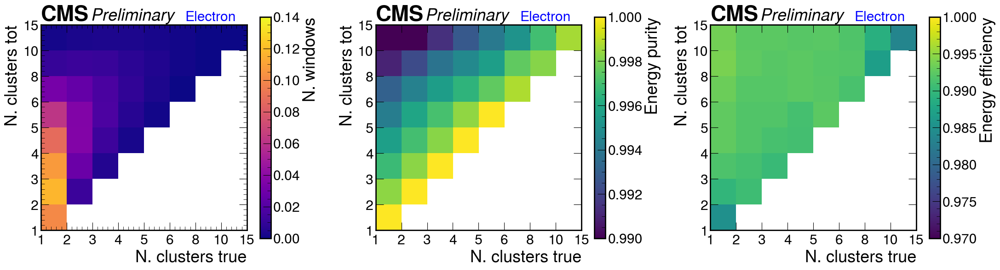

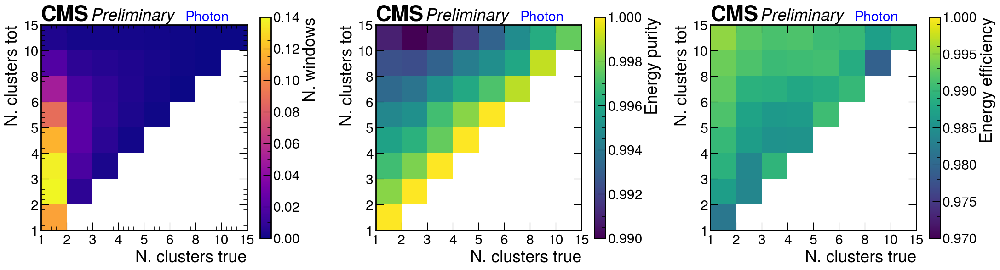

In [19]:
ets = [0,5,10,15, 20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.479, 1.75,2.,2.5,3]
ncls = [1,2,3,4,5,6,8,10,15]

hs = {}
rs = {}
ps = {}

for df, flavour in zip([df_ele,df_gamma],["Electron","Photon"]):
    df["eta_bin"] = pd.cut(abs(df.seed_eta), etas, labels=list(range(len(etas)-1)))
    df["et_bin"] = pd.cut(df.et_seed, ets, labels=list(range(len(ets)-1)))
    df["ncls_tot_bin"] = pd.cut(df.ncls, ncls, labels=list(range(len(ncls)-1)))
    df["ncls_true_bin"] = pd.cut(df.ncls_true, ncls, labels=list(range(len(ncls)-1)))
    # df["nvtx_bin"] = pd.cut(df.nVtx, nvtx, labels=list(range(len(nvtx)-1)))

    res_precision =  df.groupby(["ncls_true_bin", "ncls_tot_bin"])\
                 .apply( lambda gr:  (gr.En_sel_true/ gr.En_sel).mean())\
                 .unstack(fill_value=0).stack()

    res_recall =  df.groupby(["ncls_true_bin", "ncls_tot_bin"])\
                 .apply( lambda gr:  (gr.En_sel_true/ gr.En_true).mean())\
                 .unstack(fill_value=0).stack()

    vmin=0.99
    vmax=1
    # vmin = min([min(res_dsc), min(res_mst)])
    # if vmin==0: vmin=0.8

    fig, (az, ax, ab) = plt.subplots(1,3, figsize=(26,8),dpi=100)
    plt.subplots_adjust( wspace=0.3)

    H,_,_ = np.histogram2d(df.ncls_true, df.ncls, bins=ncls, density=True)
    H[H==0] = np.nan 
    C = az.imshow(H.T, cmap="plasma" , vmin=0, vmax=0.14)
    hs[flavour] = H.T
    fig.colorbar(C, label="N. windows", ax=az, shrink=0.8)
    az.set_xlabel("N. clusters true")
    az.set_ylabel("N. clusters tot")
    az.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    az.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    az.set_yticklabels(ncls)
    az.set_xticklabels(ncls)
    
    a1 = res_precision.values.reshape((len(ncls)-1,len(ncls)-1))
    a1[a1==0] = np.nan
    a2 = res_recall.values.reshape((len(ncls)-1,len(ncls)-1))
    a2[a2==0] = np.nan
  
    
    A = ax.imshow(a1.T, vmin=vmin, vmax=vmax)
    ps[flavour] = a1.T
    ax.set_xlabel("N. clusters true")
    ax.set_ylabel("N. clusters tot")
    fig.colorbar(A , label="Energy purity", ax=ax, shrink=0.8)

    ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    ax.set_yticklabels(ncls)
    ax.set_xticklabels(ncls)
    
      
    vmin=0.97
    vmax=1

    B = ab.imshow(a2.T, vmin=vmin, vmax=vmax)
    rs[flavour] = a2.T
    ab.set_xlabel("N. clusters true")
    ab.set_ylabel("N. clusters tot")
    plt.colorbar(B , label="Energy efficiency", ax=ab, shrink=0.8)


    ab.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
    ab.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
    ab.set_yticklabels(ncls)
    ab.set_xticklabels(ncls)
    ax.minorticks_off()
    ab.minorticks_off()
    
    az.text(0.7, 1.02, flavour, transform=az.transAxes, color='blue', fontsize="small")
    ax.text(0.7, 1.02, flavour, transform=ax.transAxes, color='blue', fontsize="small")
    ab.text(0.7, 1.02, flavour, transform=ab.transAxes, color='blue', fontsize="small")
    
    hep.cms.text("Preliminary ",loc=0, ax=az)
    hep.cms.text("Preliminary ",loc=0, ax=ax)
    hep.cms.text("Preliminary ",loc=0, ax=ab)

[Text(-0.5, 0, '1'),
 Text(0.5, 0, '2'),
 Text(1.5, 0, '3'),
 Text(2.5, 0, '4'),
 Text(3.5, 0, '5'),
 Text(4.5, 0, '6'),
 Text(5.5, 0, '8'),
 Text(6.5, 0, '10'),
 Text(7.5, 0, '15')]

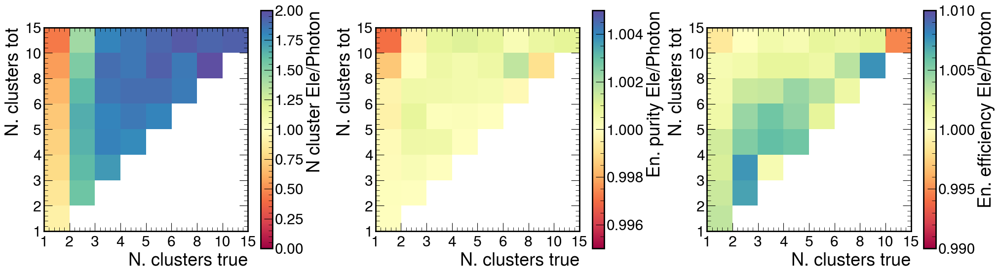

In [20]:
fig, (ax,ay,az) = plt.subplots(1,3, figsize=(24,8),dpi=100)
plt.subplots_adjust( wspace=0.3)

A = ax.imshow(hs["Electron"]/ hs["Photon"],cmap="Spectral",  vmax=2, vmin=0)
fig.colorbar(A, ax=ax, label="N cluster Ele/Photon",shrink=0.8)
ax.set_xlabel("N. clusters true")
ax.set_ylabel("N. clusters tot")
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ncls)
 
A = ay.imshow(ps["Electron"]/ ps["Photon"], cmap="Spectral",  vmax=1.005, vmin=0.995)
fig.colorbar(A, ax=ay, label="En. purity Ele/Photon", shrink=0.8)
ay.set_xlabel("N. clusters true")
ay.set_ylabel("N. clusters tot")
ay.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ay.set_yticklabels(ncls)
ay.set_xticklabels(ncls)

A = az.imshow(rs["Electron"]/ rs["Photon"], cmap="Spectral",  vmax=1.01, vmin=0.99 )
fig.colorbar(A, ax=az, label="En. efficiency Ele/Photon",shrink=0.8)
az.set_xlabel("N. clusters true")
az.set_ylabel("N. clusters tot")
az.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
az.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
az.set_yticklabels(ncls)
az.set_xticklabels(ncls)

# Cluster contamination energy

Text(1, 0, 'En . 2nd false negative Cluster / Seed En')

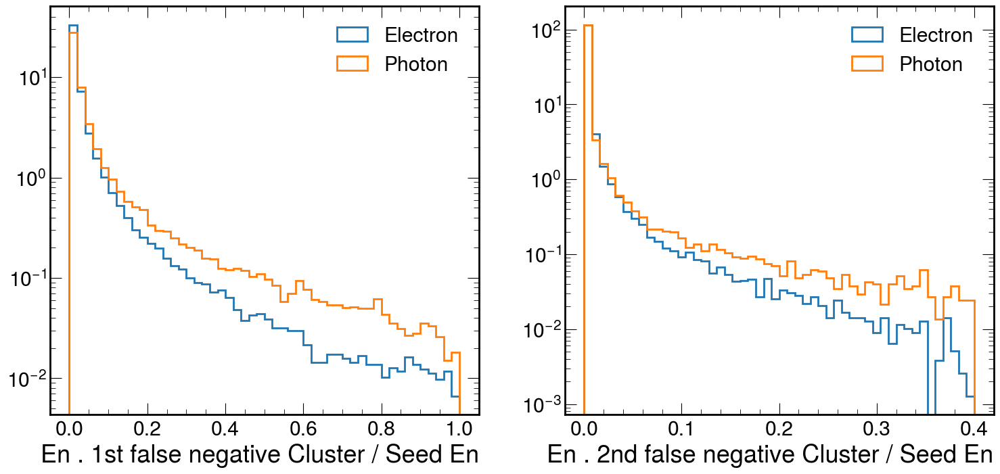

In [67]:
fig, (ax,ay) = plt.subplots(1,2, figsize=(18,8),dpi=100)

for df, fl in zip([df_ele, df_gamma], ["Electron", "Photon"]):
    df = df[(df.ncls_sel - df.ncls_true) < 0]
    ax.hist(df.En_cl_first_fn / df.en_seed, range=(0,1), bins=50, label=fl, linewidth=2, histtype="step", density=True)
    ay.hist(df.En_cl_second_fn / df.en_seed, range=(0,0.4), bins=50, label=fl, linewidth=2, histtype="step", density=True)

ax.set_yscale("log")
ax.legend()
ax.set_xlabel("En . 1st false negative Cluster / Seed En")
ay.set_yscale("log")
ay.legend()
ay.set_xlabel("En . 2nd false negative Cluster / Seed En")
    

Text(1, 0, 'En . 2nd false negative Cluster / En Sim')

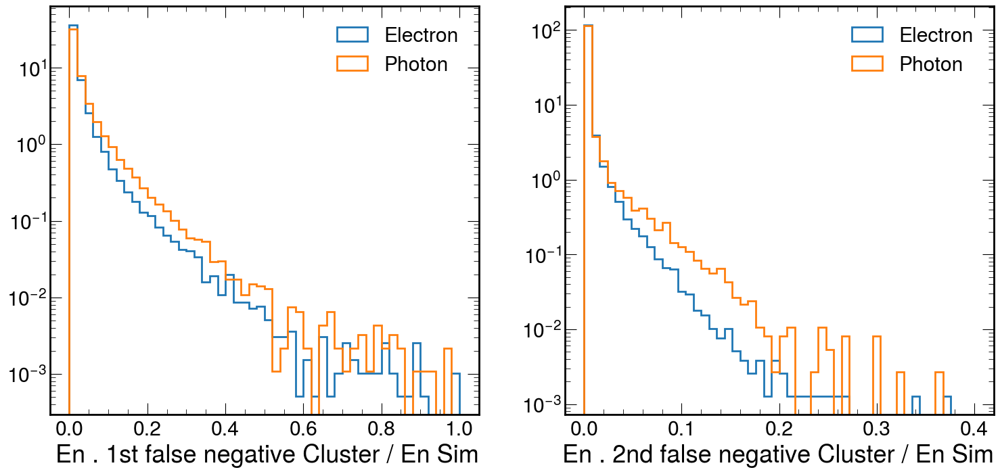

In [68]:
fig, (ax,ay) = plt.subplots(1,2, figsize=(18,8),dpi=100)

for df, fl in zip([df_ele, df_gamma], ["Electron", "Photon"]):
    df = df[(df.ncls_sel - df.ncls_true) < 0]
    ax.hist(df.En_cl_first_fn / df.en_true_sim_good, range=(0,1), bins=50, label=fl, linewidth=2, histtype="step", density=True)
    ay.hist(df.En_cl_second_fn / df.en_true_sim_good, range=(0,0.4), bins=50, label=fl, linewidth=2, histtype="step", density=True)

ax.set_yscale("log")
ax.legend()
ax.set_xlabel("En . 1st false negative Cluster / En Sim")
ay.set_yscale("log")
ay.legend()
ay.set_xlabel("En . 2nd false negative Cluster / En Sim")
    

Text(1, 0, 'En . 2nd False positive Cluster / Seed En')

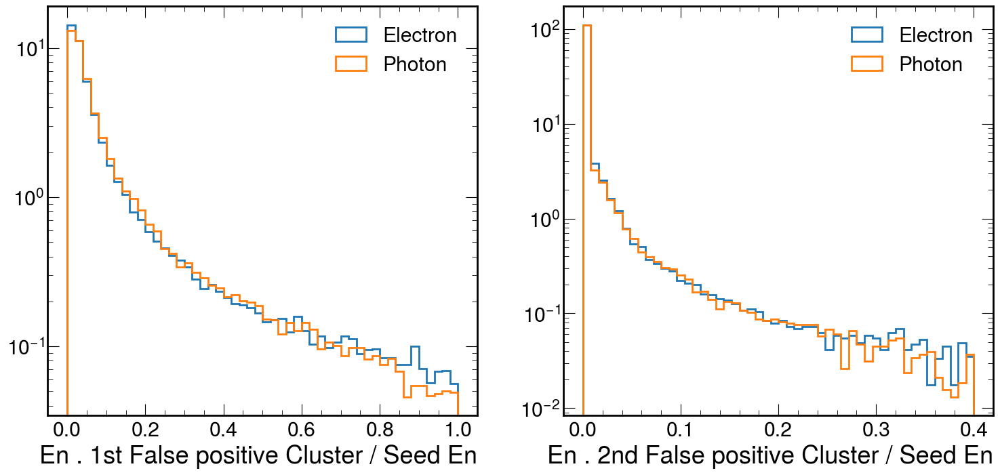

In [69]:
fig, (ax,ay) = plt.subplots(1,2, figsize=(18,8),dpi=100)

for df, fl in zip([df_ele, df_gamma], ["Electron", "Photon"]):
    df = df[(df.ncls_sel - df.ncls_true) > 0]
    ax.hist(df.En_cl_first_fp / df.en_seed, range=(0,1), bins=50, label=fl, linewidth=2, histtype="step", density=True)
    ay.hist(df.En_cl_second_fp / df.en_seed, range=(0,0.4), bins=50, label=fl, linewidth=2, histtype="step", density=True)

ax.set_yscale("log")
ax.legend()
ax.set_xlabel("En . 1st False positive Cluster / Seed En")
ay.set_yscale("log")
ay.legend()
ay.set_xlabel("En . 2nd False positive Cluster / Seed En")
    

# Check ele vs gamma Gen level

In [70]:
df_ele.columns

Index(['ncls', 'ncls_true', 'ncls_sel', 'ncls_sel_true', 'En_cl_first_fn',
       'En_cl_first_fp', 'En_cl_second_fn', 'En_cl_second_fp', 'En_cl_true_2',
       'En_cl_true_3',
       ...
       'eta', 'phi', 'en', 'et', 'et_bin', 'eta_bin', 'ncls_bin', 'nvtx_bin',
       'ncls_tot_bin', 'ncls_true_bin'],
      dtype='object', length=112)

Text(1, 0, 'Calo Gen $E_T$')

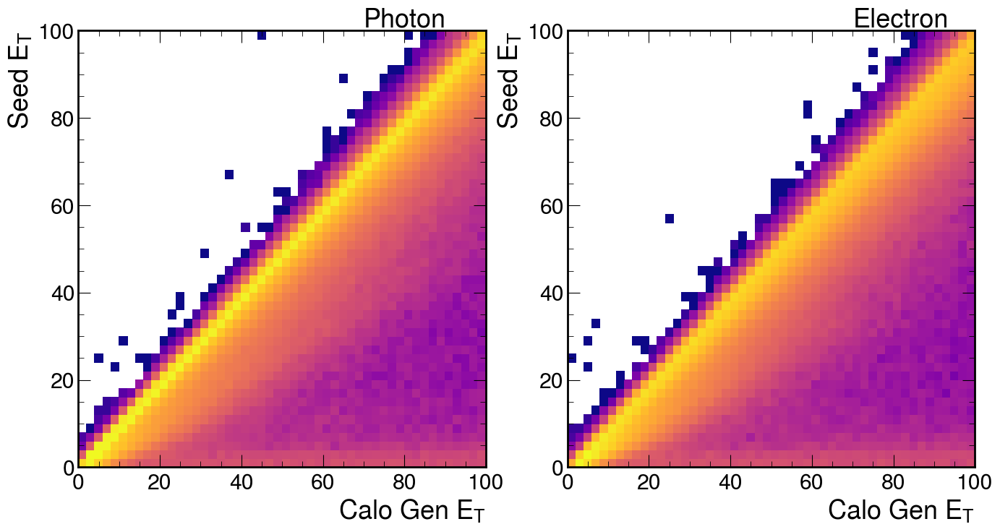

In [71]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

A = ax[0].hist2d( df_gamma.et_true_gen.abs(), df_gamma.et_seed, range=((0,100),(0,100)), bins=(50,50), cmap='plasma', norm=colors.LogNorm())
B = ax[1].hist2d( df_ele.iloc[0:len(df_gamma)].et_true_gen.abs(), df_ele.iloc[0:len(df_gamma)].et_seed, range=((0,100),(0,100)), bins=(50,50), cmap='plasma', norm=colors.LogNorm())

ax[0].set_ylabel("Seed $E_T$")
ax[1].set_ylabel("Seed $E_T$")
ax[0].text(0.7,1.01, "Photon", transform=ax[0].transAxes)
ax[1].text(0.7,1.01, "Electron", transform=ax[1].transAxes)
ax[0].set_xlabel("Calo Gen $E_T$")
ax[1].set_xlabel("Calo Gen $E_T$")

<ipython-input-72-4924d4ab3b67>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0,0,20,40,60,80,100])
<ipython-input-72-4924d4ab3b67>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0,0,20,40,60,80,100])


[Text(0, -10.0, '0'),
 Text(0, 0.0, '0'),
 Text(0, 10.0, '20'),
 Text(0, 20.0, '40'),
 Text(0, 30.0, '60'),
 Text(0, 40.0, '80'),
 Text(0, 50.0, '100')]

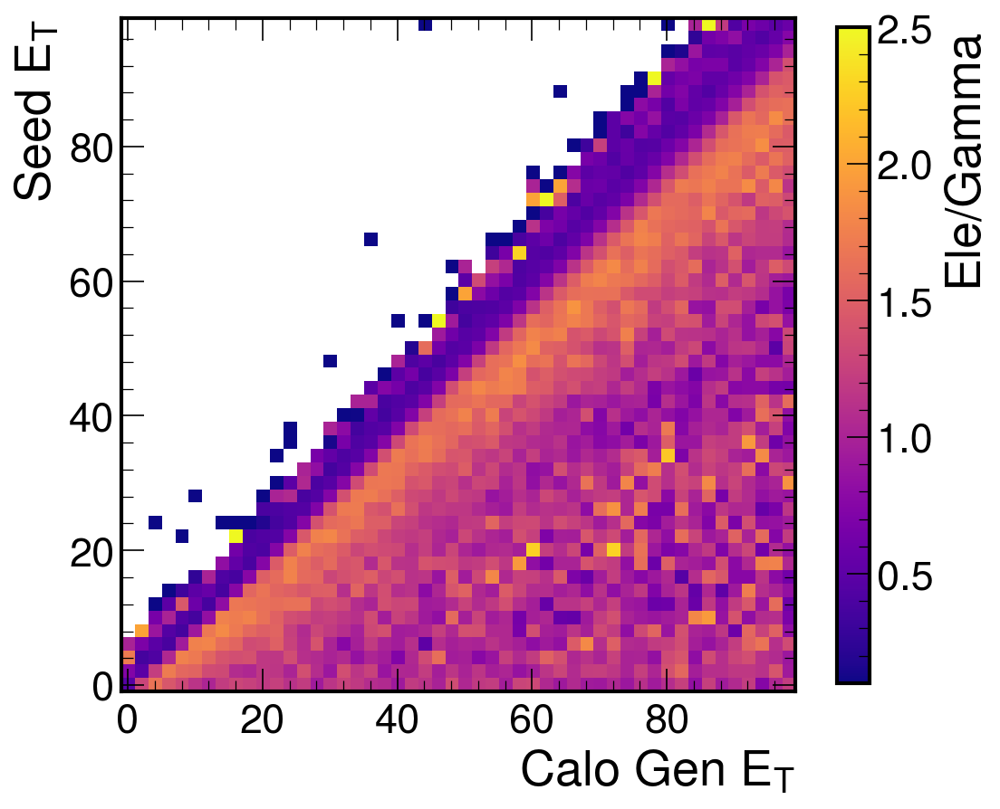

In [72]:
f, ax, = plt.subplots(1,1, figsize=(8,8), dpi=150)
I = ax.imshow((B[0]/A[0]).T, origin="lower",  cmap='plasma',vmax=2.5, vmin=0.1)
f.colorbar(I, label="Ele/Gamma", ax=ax, shrink=0.8, )
ax.set_ylabel("Seed $E_T$")
ax.set_xlabel("Calo Gen $E_T$")
ax.set_xticklabels([0,0,20,40,60,80,100])
ax.set_yticklabels([0,0,20,40,60,80,100])

Text(1, 0, 'Calo Gen $E_T$')

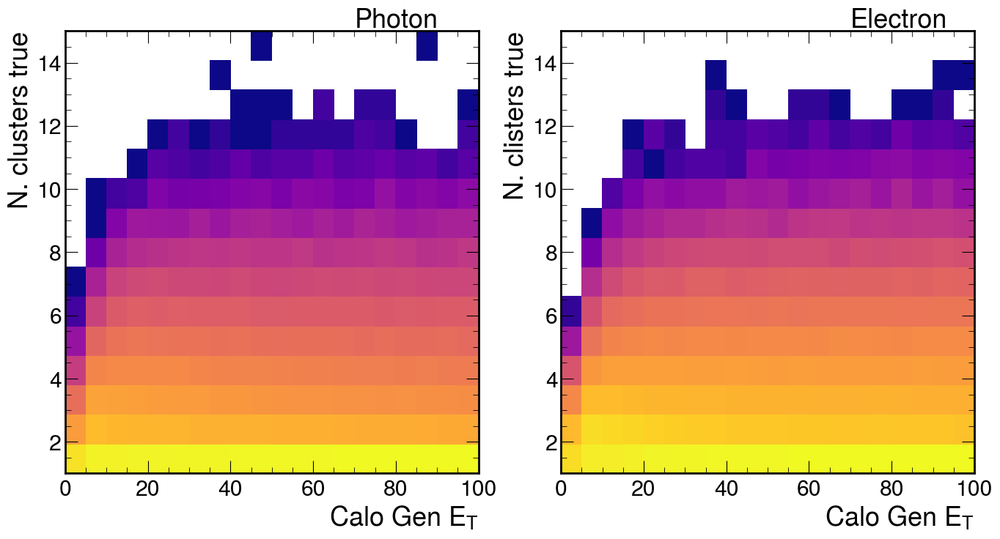

In [73]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

A = ax[0].hist2d(  df_gamma.et_true_gen.abs(), df_gamma.ncls_true, range=((0,100),(1,15)), bins=(20,15), cmap='plasma', norm=colors.LogNorm())
B = ax[1].hist2d( df_ele.iloc[1:len(df_gamma)].et_true_gen.abs(),  df_ele.iloc[1:len(df_gamma)].ncls_true,   range=((0,100),(1,15)), bins=(20,15), cmap='plasma', norm=colors.LogNorm())

ax[0].set_ylabel("N. clusters true")
ax[1].set_ylabel("N. clisters true")
ax[0].text(0.7,1.01, "Photon", transform=ax[0].transAxes)
ax[1].text(0.7,1.01, "Electron", transform=ax[1].transAxes)
ax[0].set_xlabel("Calo Gen $E_T$")
ax[1].set_xlabel("Calo Gen $E_T$")

900091.0 899907.0


[Text(0, -0.5, '1'),
 Text(0, 0.5, '2'),
 Text(0, 1.5, '3'),
 Text(0, 2.5, '4'),
 Text(0, 3.5, '5'),
 Text(0, 4.5, '6'),
 Text(0, 5.5, '7'),
 Text(0, 6.5, '8'),
 Text(0, 7.5, '9'),
 Text(0, 8.5, '10'),
 Text(0, 9.5, '11'),
 Text(0, 10.5, '12'),
 Text(0, 11.5, '13'),
 Text(0, 12.5, '14'),
 Text(0, 13.5, '15'),
 Text(0, 14.5, '16')]

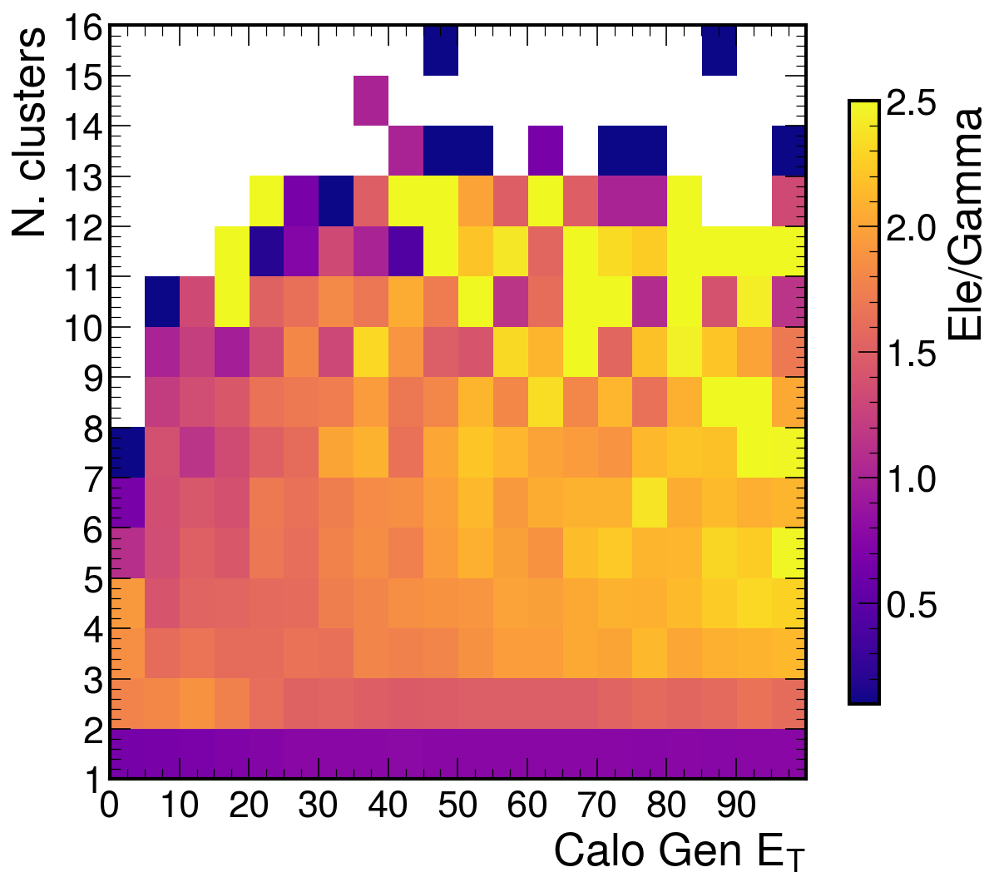

In [74]:
f, ax, = plt.subplots(1,1, figsize=(9,8), dpi=150)
print(np.sum(A[0]), np.sum(B[0]))
I = ax.imshow((B[0]/A[0]).T, origin="lower",  cmap='plasma',vmax=2.5, vmin=0.1, aspect='auto')
f.colorbar(I, label="Ele/Gamma", ax=ax, shrink=0.8, )
ax.set_ylabel("N. clusters")
ax.set_xlabel("Calo Gen $E_T$")
ax.set_xticks(np.arange(0,20,2)-0.5)
ax.set_xticklabels(list(range(0,100,10)))
ax.set_yticks(np.arange(16)-0.5)
ax.set_yticklabels(list(range(1,17)))

Text(1, 0, 'Seed $E_T$')

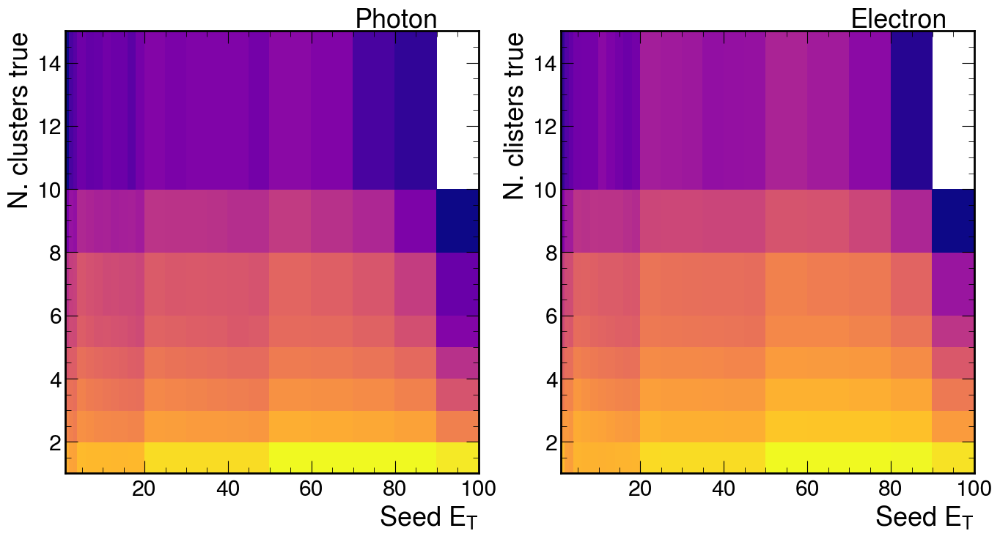

In [75]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

ncls= [1,2,3,4,5,6,8,10,15]
ets = [1,2,3,4,6,8,10,12,14,16,18,20,25,30,35,40,45,50,60,70,80,90,100]

g = ax[0].hist2d(  df_gamma.et_seed.abs(), df_gamma.ncls_true, bins=(ets,ncls), cmap='plasma', norm=colors.LogNorm())
e = ax[1].hist2d( df_ele.iloc[0:len(df_gamma)].et_seed.abs(),  df_ele.iloc[0:len(df_gamma)].ncls_true,  bins=(ets,ncls), cmap='plasma', norm=colors.LogNorm())

ax[0].set_ylabel("N. clusters true")
ax[1].set_ylabel("N. clisters true")
ax[0].text(0.7,1.01, "Photon", transform=ax[0].transAxes)
ax[1].text(0.7,1.01, "Electron", transform=ax[1].transAxes)
ax[0].set_xlabel("Seed $E_T$")
ax[1].set_xlabel("Seed $E_T$")

900091.0 899907.0


[Text(-0.5, 0, '1'),
 Text(0.5, 0, '2'),
 Text(1.5, 0, '3'),
 Text(2.5, 0, '4'),
 Text(3.5, 0, '6'),
 Text(4.5, 0, '8'),
 Text(5.5, 0, '10'),
 Text(6.5, 0, '12'),
 Text(7.5, 0, '14'),
 Text(8.5, 0, '16'),
 Text(9.5, 0, '18'),
 Text(10.5, 0, '20'),
 Text(11.5, 0, '25'),
 Text(12.5, 0, '30'),
 Text(13.5, 0, '35'),
 Text(14.5, 0, '40'),
 Text(15.5, 0, '45'),
 Text(16.5, 0, '50'),
 Text(17.5, 0, '60'),
 Text(18.5, 0, '70'),
 Text(19.5, 0, '80'),
 Text(20.5, 0, '90'),
 Text(21.5, 0, '100')]

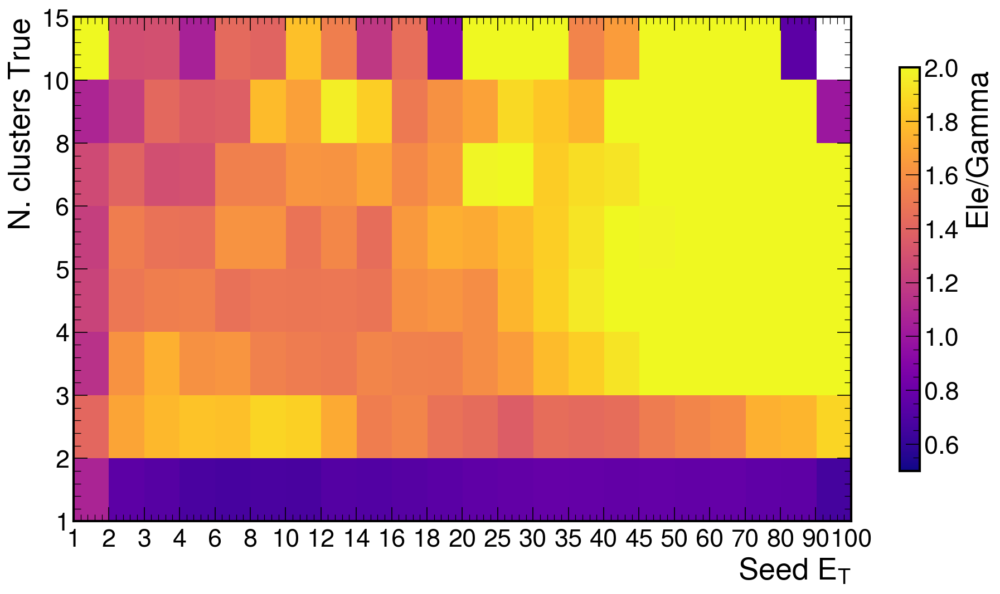

In [76]:
f, ax, = plt.subplots(1,1, figsize=(15,8), dpi=150)
print(np.sum(A[0]), np.sum(B[0]))
I = ax.imshow((e[0]/g[0]).T, origin="lower",  cmap='plasma',vmax=2, vmin=0.5, aspect='auto')
f.colorbar(I, label="Ele/Gamma", ax=ax, shrink=0.8, )
ax.set_ylabel("N. clusters True")
ax.set_xlabel("Seed $E_T$")
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ets))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ets)

In [77]:
len(df_ele)

899908

Text(1, 0, 'Seed $E_T$')

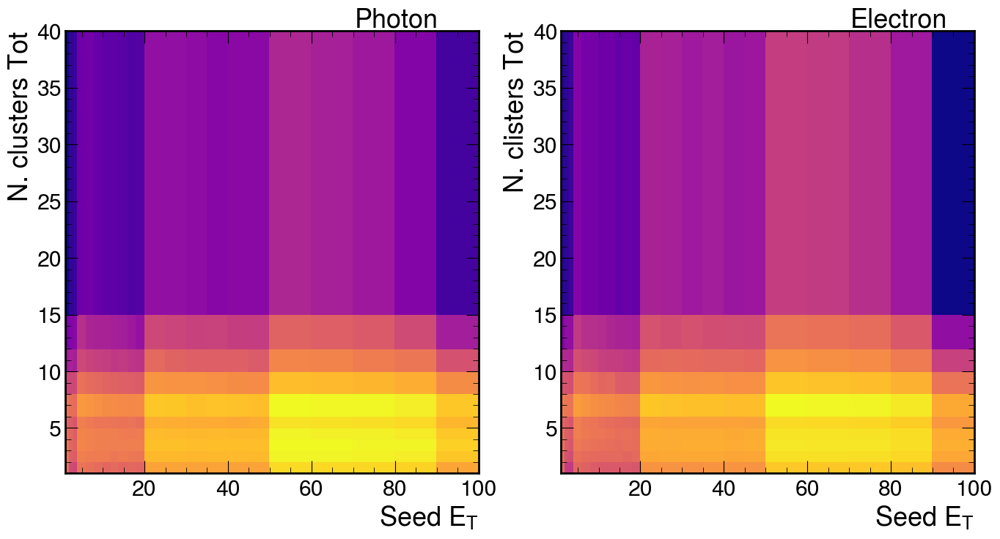

In [78]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

ncls= [1,2,3,4,5,6,8,10,12,15,40]
ets = [1,2,3,4,6,8,10,12,14,16,18,20,25,30,35,40,45,50,60,70,80,90,100]

g = ax[0].hist2d(  df_gamma.et_seed.abs(), df_gamma.ncls, bins=(ets,ncls), cmap='plasma', norm=colors.LogNorm())
e = ax[1].hist2d( df_ele.iloc[0:len(df_gamma)].et_seed.abs(),  df_ele.iloc[0:len(df_gamma)].ncls,  bins=(ets,ncls), cmap='plasma', norm=colors.LogNorm())

ax[0].set_ylabel("N. clusters Tot")
ax[1].set_ylabel("N. clisters Tot")
ax[0].text(0.7,1.01, "Photon", transform=ax[0].transAxes)
ax[1].text(0.7,1.01, "Electron", transform=ax[1].transAxes)
ax[0].set_xlabel("Seed $E_T$")
ax[1].set_xlabel("Seed $E_T$")

900091.0 899907.0


[Text(-0.5, 0, '1'),
 Text(0.5, 0, '2'),
 Text(1.5, 0, '3'),
 Text(2.5, 0, '4'),
 Text(3.5, 0, '6'),
 Text(4.5, 0, '8'),
 Text(5.5, 0, '10'),
 Text(6.5, 0, '12'),
 Text(7.5, 0, '14'),
 Text(8.5, 0, '16'),
 Text(9.5, 0, '18'),
 Text(10.5, 0, '20'),
 Text(11.5, 0, '25'),
 Text(12.5, 0, '30'),
 Text(13.5, 0, '35'),
 Text(14.5, 0, '40'),
 Text(15.5, 0, '45'),
 Text(16.5, 0, '50'),
 Text(17.5, 0, '60'),
 Text(18.5, 0, '70'),
 Text(19.5, 0, '80'),
 Text(20.5, 0, '90'),
 Text(21.5, 0, '100')]

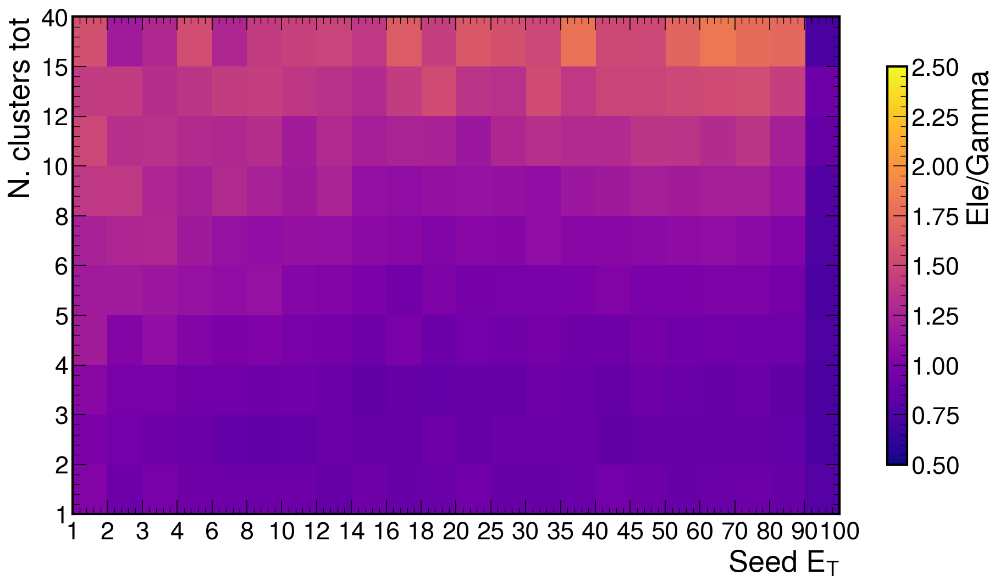

In [79]:
f, ax, = plt.subplots(1,1, figsize=(15,8), dpi=150)
print(np.sum(A[0]), np.sum(B[0]))
I = ax.imshow((e[0]/g[0]).T, origin="lower",  cmap='plasma', aspect='auto',vmin=0.5, vmax=2.5)
f.colorbar(I, label="Ele/Gamma", ax=ax, shrink=0.8, )
ax.set_ylabel("N. clusters tot")
ax.set_xlabel("Seed $E_T$")
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ets))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ets)

In [80]:
import ROOT as R 
from array import array

Welcome to JupyROOT 6.24/00


In [81]:
th2 = R.TH2F("weight","weight", len(ets)-1, array("d", ets), len(ncls)-1, array("d", ncls))

for icl in range(len(ncls)-1):
    for iet in range(len(ets)-1):
        th2.SetBinContent(th2.FindBin(ets[iet], ncls[icl]), A[icl,iet])
        
c = R.TCanvas()
th2.Draw("colz")
c.SetLogy()
c.Draw()

file = R.TFile(outdir+ "/reweighting_ele_gamma.root", "recreate")
th2.Write()
file.Close()

TypeError: tuple indices must be integers or slices, not tuple

In [ ]:
f, ax, = plt.subplots(1,2, figsize=(16,8), dpi=100)

ets = [1,2,3,4,6,8,10,12,14,16,18,20,25,30,35,40,45,50,60,70,80,90,100]
etas = [0, 0.2,0.4,0.6, 0.8,1., 1.2,1.44, 1.57, 1.75, 2., 2.2, 2.4, 3]

g = ax[0].hist2d(  df_gamma.et_seed, df_gamma.eta.abs(), bins=(ets,etas), cmap='plasma', norm=colors.LogNorm())
e = ax[1].hist2d( df_ele.iloc[0:len(df_gamma)].et_seed,  df_ele.iloc[0:len(df_gamma)].eta.abs(),  bins=(ets,etas), cmap='plasma', norm=colors.LogNorm())

ax[0].set_ylabel("Seed $\eta$")
ax[1].set_ylabel("Seed $\eta$")
ax[0].text(0.7,1.01, "Photon", transform=ax[0].transAxes)
ax[1].text(0.7,1.01, "Electron", transform=ax[1].transAxes)
ax[0].set_xlabel("Seed $E_T$")
ax[1].set_xlabel("Seed $E_T$")

In [ ]:
f, ax, = plt.subplots(1,1, figsize=(15,8), dpi=150)
print(np.sum(A[0]), np.sum(B[0]))
I = ax.imshow((e[0]/g[0]).T, origin="lower",  cmap='plasma', aspect='auto',vmin=0.5, vmax=2.5)
f.colorbar(I, label="Ele/Gamma", ax=ax, shrink=0.8, )
ax.set_ylabel("Seed $\eta$")
ax.set_xlabel("Seed $E_T$")
ax.set_yticks(np.arange(len(etas)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ets))- 0.5, minor=False)
ax.set_yticklabels(etas)
ax.set_xticklabels(ets)

# Comparison between theoretical resolutions

Text(0.01, 1.02, 'SimTruth')

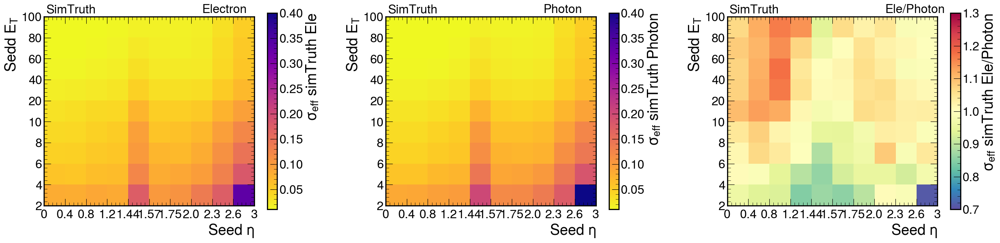

In [21]:
fig, (ax, ay,az) = plt.subplots(1,3, figsize=(30, 8),dpi=100, )
plt.subplots_adjust( wspace=0.3)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele.reset_index(level=0, inplace=True)
res_ele.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)


vmax=  0.4
vmin =0.01

a1 = res_ele.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
a2 = res_gamma.w68.values.reshape((len(etas)-1,len(ets)-1))
a2[a2==0] = np.nan

A = ax.imshow(a1.T,  cmap="plasma_r", vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Sedd $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ simTruth Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "SimTruth", transform=ax.transAxes,  fontsize="small")

A2 = ay.imshow(a2.T,  cmap="plasma_r", vmin=vmin, vmax=vmax)
ay.set_xlabel("Seed $\eta$")
ay.set_ylabel("Sedd $E_T$")
fig.colorbar(A2 , label="$\sigma_{eff}$ simTruth Photon", ax=ay, shrink=0.8)
ay.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ay.set_yticklabels(ets)
ay.set_xticklabels(etas)
ay.text(0.75, 1.02, "Photon", transform=ay.transAxes,  fontsize="small")
ay.text(0.01, 1.02, "SimTruth", transform=ay.transAxes,  fontsize="small")

A3 = az.imshow((a1/a2).T,  cmap="Spectral_r", vmin=0.7, vmax=1.3)
az.set_xlabel("Seed $\eta$")
az.set_ylabel("Sedd $E_T$")
fig.colorbar(A3 , label="$\sigma_{eff}$ simTruth Ele/Photon", ax=az, shrink=0.8)
az.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
az.set_xticks(np.arange(len(etas))- 0.5, minor=False)
az.set_yticklabels(ets)
az.set_xticklabels(etas)
az.text(0.75, 1.02, "Ele/Photon", transform=az.transAxes,  fontsize="small")
az.text(0.01, 1.02, "SimTruth", transform=az.transAxes,  fontsize="small")


Text(0.01, 1.02, 'DeepSC')

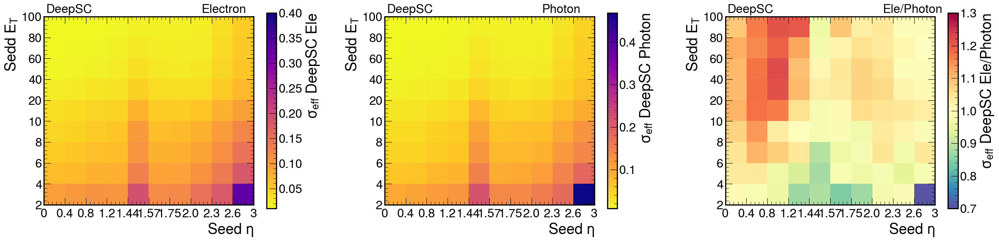

In [22]:
fig, (ax, ay,az) = plt.subplots(1,3, figsize=(30, 8),dpi=100, )
plt.subplots_adjust( wspace=0.3)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele.reset_index(level=0, inplace=True)
res_ele.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)


vmax=0.4
vmin =0.01

a1 = res_ele.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
a2 = res_gamma.w68.values.reshape((len(etas)-1,len(ets)-1))
a2[a2==0] = np.nan

A = ax.imshow(a1.T,  cmap="plasma_r", vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Sedd $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC", transform=ax.transAxes,  fontsize="small")

A2 = ay.imshow(a2.T,  cmap="plasma_r")
ay.set_xlabel("Seed $\eta$")
ay.set_ylabel("Sedd $E_T$")
fig.colorbar(A2 , label="$\sigma_{eff}$ DeepSC Photon", ax=ay, shrink=0.8)
ay.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ay.set_yticklabels(ets)
ay.set_xticklabels(etas)
ay.text(0.75, 1.02, "Photon", transform=ay.transAxes,  fontsize="small")
ay.text(0.01, 1.02, "DeepSC", transform=ay.transAxes,  fontsize="small")

A3 = az.imshow((a1/a2).T,  cmap="Spectral_r", vmin=0.7, vmax=1.3)
az.set_xlabel("Seed $\eta$")
az.set_ylabel("Sedd $E_T$")
fig.colorbar(A3 , label="$\sigma_{eff}$ DeepSC Ele/Photon", ax=az, shrink=0.8)
az.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
az.set_xticks(np.arange(len(etas))- 0.5, minor=False)
az.set_yticklabels(ets)
az.set_xticklabels(etas)
az.text(0.75, 1.02, "Ele/Photon", transform=az.transAxes,  fontsize="small")
az.text(0.01, 1.02, "DeepSC", transform=az.transAxes,  fontsize="small")

Text(0.01, 1.02, 'Mustache')

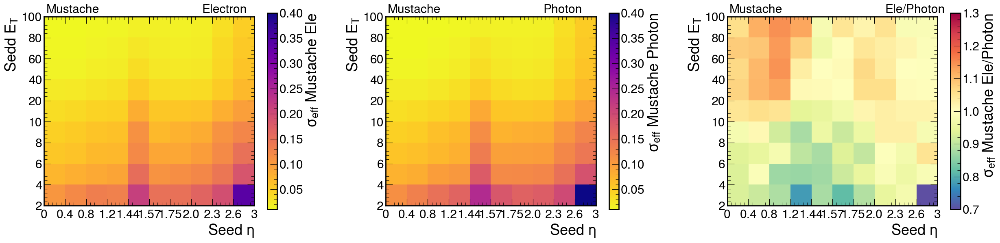

In [23]:
fig, (ax, ay,az) = plt.subplots(1,3, figsize=(30, 8),dpi=100, )
plt.subplots_adjust( wspace=0.3)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele.reset_index(level=0, inplace=True)
res_ele.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)
res_gamma.reset_index(level=0, inplace=True)


vmax= 0.4
vmin =0.01

a1 = res_ele.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
a2 = res_gamma.w68.values.reshape((len(etas)-1,len(ets)-1))
a2[a2==0] = np.nan

A = ax.imshow(a1.T,  cmap="plasma_r", vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Sedd $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustache Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache", transform=ax.transAxes,  fontsize="small")

A2 = ay.imshow(a2.T,  cmap="plasma_r", vmin=vmin, vmax=vmax)
ay.set_xlabel("Seed $\eta$")
ay.set_ylabel("Sedd $E_T$")
fig.colorbar(A2 , label="$\sigma_{eff}$ Mustache Photon", ax=ay, shrink=0.8)
ay.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ay.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ay.set_yticklabels(ets)
ay.set_xticklabels(etas)
ay.text(0.75, 1.02, "Photon", transform=ay.transAxes,  fontsize="small")
ay.text(0.01, 1.02, "Mustache", transform=ay.transAxes,  fontsize="small")

A3 = az.imshow((a1/a2).T,  cmap="Spectral_r", vmin=0.7, vmax=1.3)
az.set_xlabel("Seed $\eta$")
az.set_ylabel("Sedd $E_T$")
fig.colorbar(A3 , label="$\sigma_{eff}$ Mustache Ele/Photon", ax=az, shrink=0.8)
az.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
az.set_xticks(np.arange(len(etas))- 0.5, minor=False)
az.set_yticklabels(ets)
az.set_xticklabels(etas)
az.text(0.75, 1.02, "Ele/Photon", transform=az.transAxes,  fontsize="small")
az.text(0.01, 1.02, "Mustache", transform=az.transAxes,  fontsize="small")


Text(0.01, 1.02, 'Mustache / simTruth')

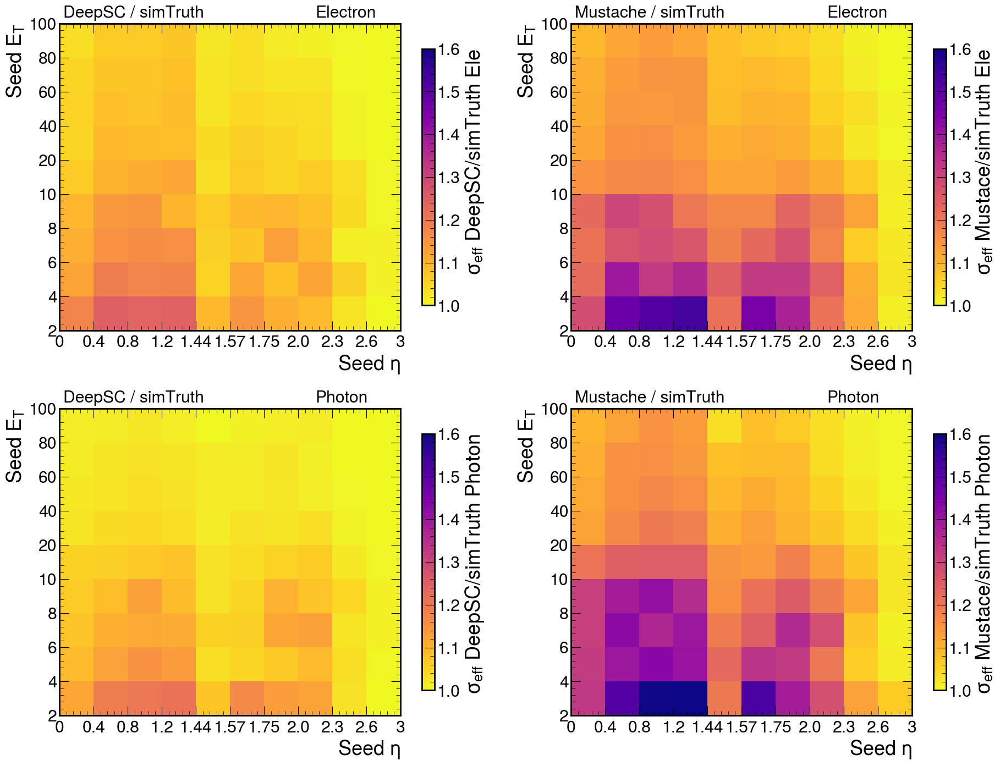

In [24]:
fig, axs = plt.subplots(2,2, figsize=(22, 17),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)


res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)


vmax=1.6
vmin =1
palette = "plasma_r"

a1 = res_ele_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan

a1_mst = res_ele_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan




ax = axs[0,0]
A = ax.imshow((a1_dsc/a1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/simTruth Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")

ax = axs[0,1]
A = ax.imshow((a1_mst/a1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustace/simTruth Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")


a1 = res_gamma_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan

a1_dsc = res_gamma_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan

a1_mst = res_gamma_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan



ax = axs[1,0]
A = ax.imshow((a1_dsc/a1).T, cmap=palette  , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/simTruth Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")

ax = axs[1,1]
A = ax.imshow((a1_mst/a1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustace/simTruth Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")





Text(0.01, 1.02, 'Mustache / simTruth')

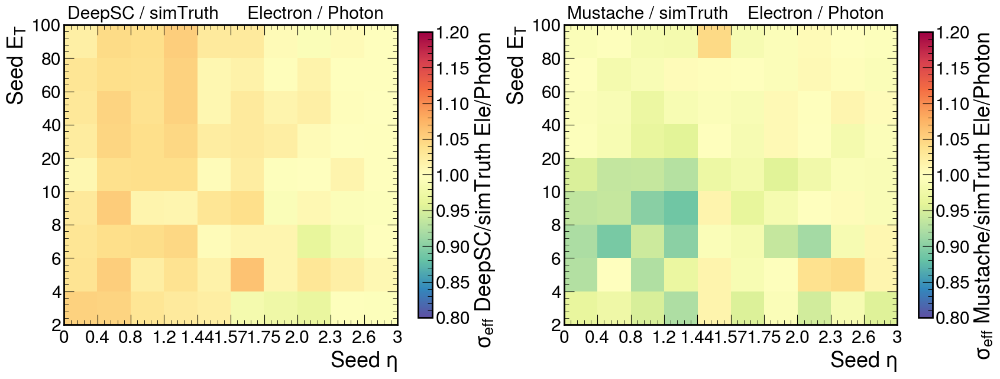

In [28]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 0.8
vmin = 1.2
palette = "Spectral_r"

a1 = res_ele_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow(( (a1_dsc/a1) / (b1_dsc/b1)).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow(( (a1_mst/a1) / (b1_mst/b1)).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustache/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")


Text(0.01, 1.02, 'DeepSC / Mustache')

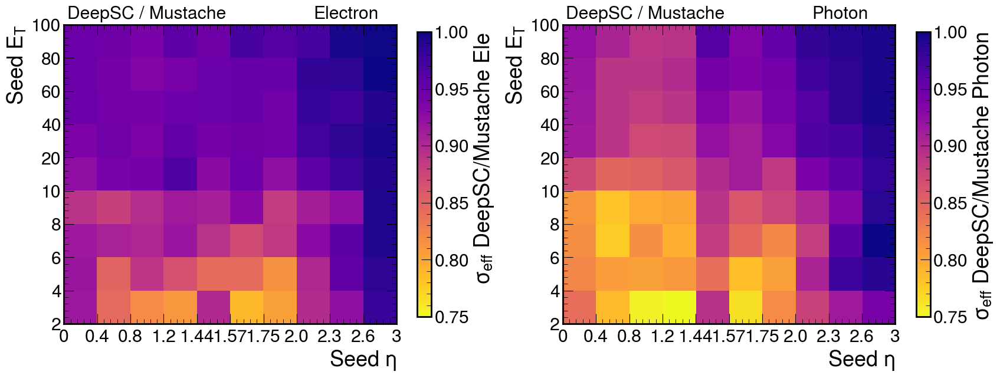

In [26]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1
vmin = 0.75
palette = "plasma_r"

a1 = res_ele_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.w68.values.reshape((len(etas)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_dsc/a1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_dsc/ b1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


Text(0.01, 1.02, 'DeepSC / Mustache')

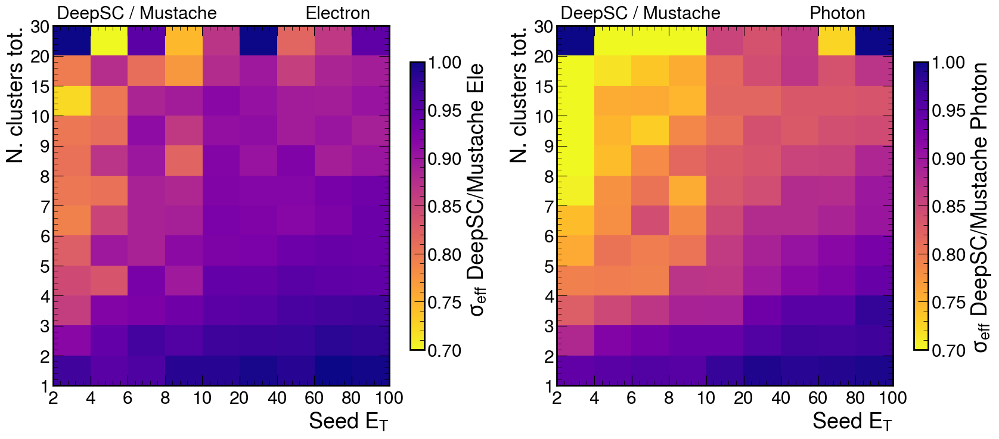

In [27]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ncls = [1,2,3,4,5,6,7,8,9,10,15,20,30]
ets = [2,4,6,8,10,20,40,60,80,100]
df_ele["ncl_bin"] = pd.cut(df_ele.ncls, ncls, labels=list(range(len(ncls)-1)))
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_gamma["ncl_bin"] = pd.cut(df_gamma.ncls, ncls, labels=list(range(len(ncls)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))


res_ele_sim = df_ele.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["et_bin","ncl_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1
vmin = 0.7
palette = "plasma_r"

a1 = res_ele_sim.w68.values.reshape((len(ets)-1,len(ncls)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.w68.values.reshape((len(ets)-1,len(ncls)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(ets)-1,len(ncls)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(ets)-1,len(ncls)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(ets)-1,len(ncls)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(ets)-1,len(ncls)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_dsc/a1_mst).T,  aspect="auto", cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $E_T$")
ax.set_ylabel("N. clusters tot.")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ets))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ets)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_dsc/ b1_mst).T,  aspect="auto",  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $E_T$")
ax.set_ylabel("N. clusters tot.")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ncls)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ets))- 0.5, minor=False)
ax.set_yticklabels(ncls)
ax.set_xticklabels(ets)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


## Comparison to E gen

Text(0.01, 1.02, 'DeepSC / Mustache')

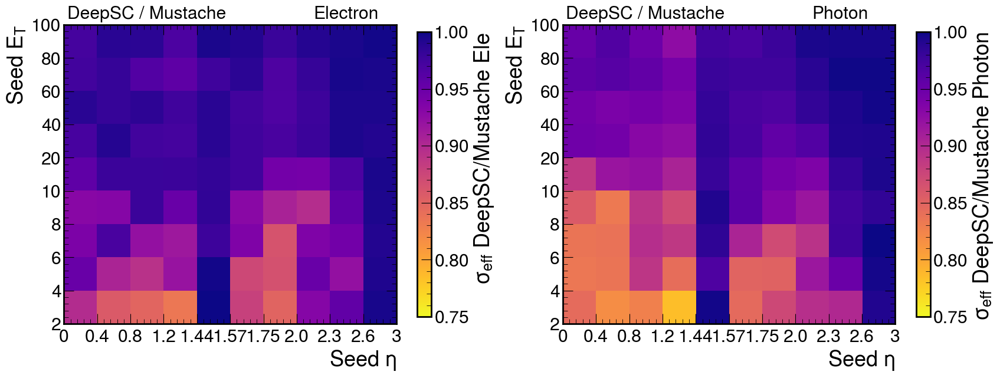

In [190]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))



res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_gen"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_gen_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1
vmin = 0.75
palette = "plasma_r"

a1_dsc = res_ele_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_dsc/a1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_dsc/ b1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/Mustache Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


# Comparison by N cluster

In [88]:
res_ele_dsc

,et_bin,eta_bin,m,w68,w95,N
0,0,0,0.806291,0.096073,-0.286098,1799.0
1,1,0,0.857522,0.065442,-0.177532,1652.0
2,2,0,0.885604,0.051102,-0.135704,1590.0
3,3,0,0.901508,0.042597,-0.116771,1515.0
4,4,0,0.933198,0.033247,-0.084434,6896.0
...,...,...,...,...,...,...
85,4,9,1.014362,0.095514,-0.210918,6156.0
86,5,9,0.954616,0.070599,-0.144938,11498.0
87,6,9,0.967256,0.059205,-0.121204,10864.0
88,7,9,0.977150,0.056738,-0.112653,10362.0


Text(0.01, 1.02, 'Mustache / simTruth')

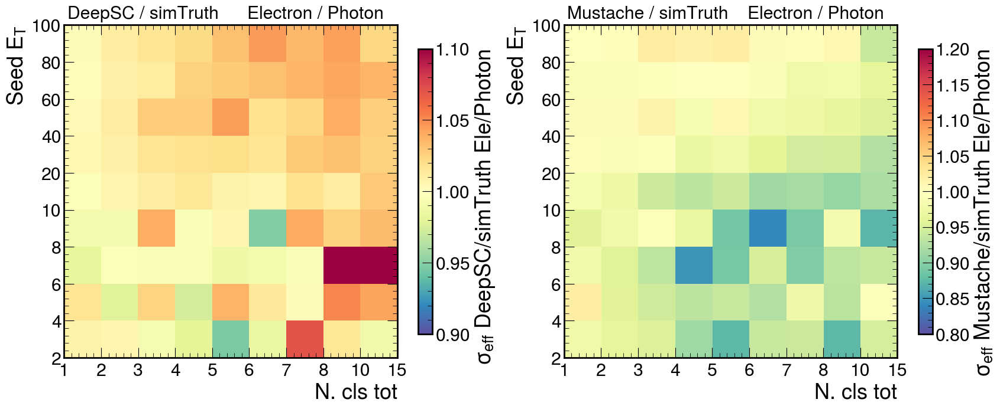

In [89]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
ncls = [1,2,3,4,5,6,7,8,10,15]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["ncl_bin"] = pd.cut(df_ele.ncls, ncls, labels=list(range(len(ncls)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["ncl_bin"] = pd.cut(df_gamma.ncls, ncls, labels=list(range(len(ncls)-1)))


res_ele_sim = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 0.8
vmin = 1.2
palette = "Spectral_r"

a1 = res_ele_sim.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow(( (a1_dsc/a1) / (b1_dsc/b1)).T,  cmap=palette , vmin=0.9, vmax=1.10)
ax.set_xlabel("N. cls tot")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(ncls)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow(( (a1_mst/a1) / (b1_mst/b1)).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("N. cls tot")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustache/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(ncls)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")


Text(0.01, 1.02, 'Mustache / simTruth')

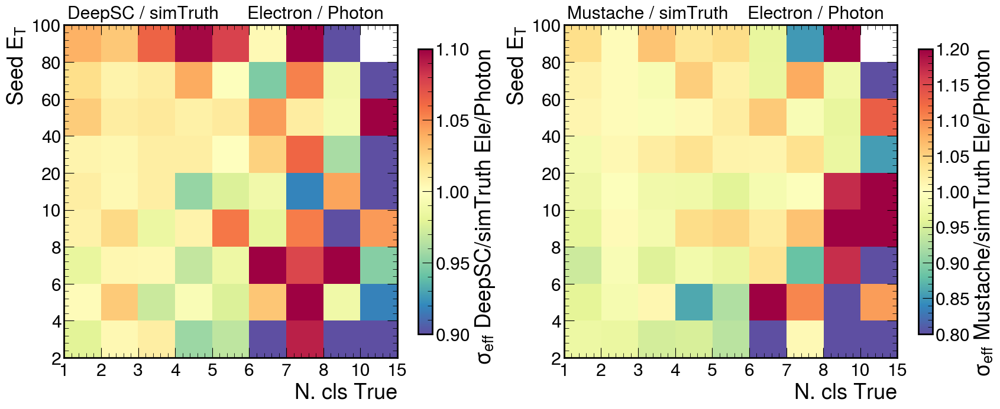

In [90]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
ncls = [1,2,3,4,5,6,7,8,10,15]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["ncl_bin"] = pd.cut(df_ele.ncls_true, ncls, labels=list(range(len(ncls)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["ncl_bin"] = pd.cut(df_gamma.ncls_true, ncls, labels=list(range(len(ncls)-1)))


res_ele_sim = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["ncl_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 0.8
vmin = 1.2
palette = "Spectral_r"

a1 = res_ele_sim.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.w68.values.reshape((len(ncls)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.w68.values.reshape((len(ncls)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow(( (a1_dsc/a1) / (b1_dsc/b1)).T,  cmap=palette , vmin=0.9, vmax=1.10)
ax.set_xlabel("N. cls True")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ DeepSC/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(ncls)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow(( (a1_mst/a1) / (b1_mst/b1)).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("N. cls True")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="$\sigma_{eff}$ Mustache/simTruth Ele/Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(ncls))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(ncls)
ax.text(0.55, 1.02, "Electron / Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")


# Scale comparison

Text(0.01, 1.02, 'DeepSC / Mustache')

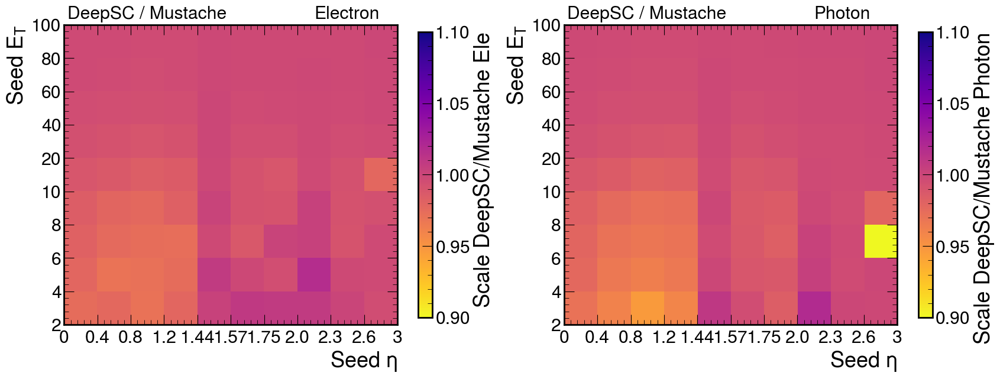

In [91]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1.1
vmin = 0.9
palette = "plasma_r"

a1 = res_ele_sim.m.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.m.values.reshape((len(etas)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.m.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.m.values.reshape((len(etas)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.m.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.m.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_dsc/a1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale DeepSC/Mustache Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_dsc/ b1_mst).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale DeepSC/Mustache Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / Mustache", transform=ax.transAxes,  fontsize="small")


Text(0.01, 1.02, 'DeepSC / simTruth')

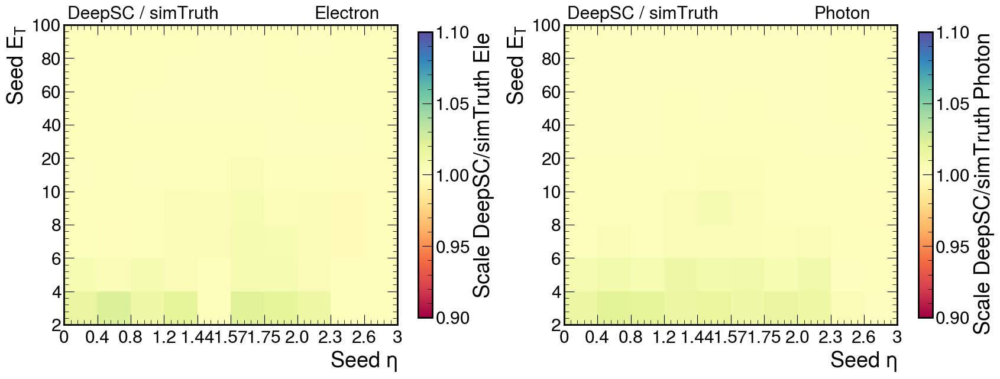

In [92]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1.10
vmin = 0.90
palette = "Spectral"

a1 = res_ele_sim.m.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.m.values.reshape((len(etas)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_dsc = res_ele_dsc.m.values.reshape((len(etas)-1,len(ets)-1))
a1_dsc[a1_dsc==0] = np.nan
b1_dsc = res_gamma_dsc.m.values.reshape((len(etas)-1,len(ets)-1))
b1_dsc[b1_dsc==0] = np.nan


a1_mst = res_ele_mst.m.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.m.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_dsc/a1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale DeepSC/simTruth Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_dsc/ b1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale DeepSC/simTruth Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "DeepSC / simTruth", transform=ax.transAxes,  fontsize="small")


Text(0.01, 1.02, 'Mustache / simTruth')

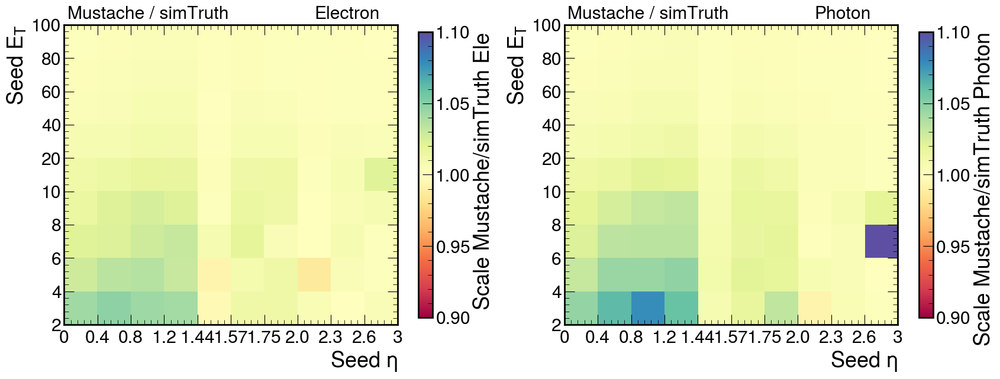

In [93]:
fig, axs = plt.subplots(1,2, figsize=(20, 8),dpi=100, )
plt.subplots_adjust( wspace=0.2)

ets = [2,4,6,8,10,20,40,60,80,100]
etas = [0, 0.4,0.8, 1.2,1.44, 1.57, 1.75,2.,2.3,2.6,3]
df_ele["et_bin"] = pd.cut(df_ele.et, ets, labels=list(range(len(ets)-1)))
df_ele["eta_bin"] = pd.cut(df_ele.eta, etas, labels=list(range(len(etas)-1)))
df_gamma["et_bin"] = pd.cut(df_gamma.et, ets, labels=list(range(len(ets)-1)))
df_gamma["eta_bin"] = pd.cut(df_gamma.eta, etas, labels=list(range(len(etas)-1)))


res_ele_sim = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_gamma_sim  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("EnTrue_ovEtrue_sim_good"))
res_ele_sim.reset_index(level=0, inplace=True)
res_ele_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)
res_gamma_sim.reset_index(level=0, inplace=True)


res_ele_dsc = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_gamma_dsc  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good"))
res_ele_dsc.reset_index(level=0, inplace=True)
res_ele_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)
res_gamma_dsc.reset_index(level=0, inplace=True)

res_ele_mst = df_ele.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_gamma_mst  = df_gamma.groupby(["eta_bin","et_bin"]).apply(bin_analysis("En_ovEtrue_sim_good_mustache"))
res_ele_mst.reset_index(level=0, inplace=True)
res_ele_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)
res_gamma_mst.reset_index(level=0, inplace=True)

vmax= 1.1
vmin = 0.9
palette = "Spectral"

a1 = res_ele_sim.m.values.reshape((len(etas)-1,len(ets)-1))
a1[a1==0] = np.nan
b1 = res_gamma_sim.m.values.reshape((len(etas)-1,len(ets)-1))
b1[b1==0] = np.nan

a1_mst = res_ele_mst.m.values.reshape((len(etas)-1,len(ets)-1))
a1_mst[a1_mst==0] = np.nan
b1_mst = res_gamma_mst.m.values.reshape((len(etas)-1,len(ets)-1))
b1_mst[b1_mst==0] = np.nan

ax = axs[0]
A = ax.imshow( (a1_mst/a1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale Mustache/simTruth Ele", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Electron", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")


ax = axs[1]
A = ax.imshow((b1_mst/ b1).T,  cmap=palette , vmin=vmin, vmax=vmax)
ax.set_xlabel("Seed $\eta$")
ax.set_ylabel("Seed $E_T$")
fig.colorbar(A , label="Scale Mustache/simTruth Photon", ax=ax, shrink=0.8)
ax.set_yticks(np.arange(len(ets)) - 0.5, minor=False)
ax.set_xticks(np.arange(len(etas))- 0.5, minor=False)
ax.set_yticklabels(ets)
ax.set_xticklabels(etas)
ax.text(0.75, 1.02, "Photon", transform=ax.transAxes,  fontsize="small")
ax.text(0.01, 1.02, "Mustache / simTruth", transform=ax.transAxes,  fontsize="small")
